# Radiation Tracking and Detection(Geoplots,Figures,Graphs)2
### Author: Andrew J. Otis

In [4]:
# Data Wrangling
import pandas as pd  # also used in transforming date entries
import numpy as np

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from PIL import Image
from plotly.subplots import make_subplots

# Data Transformation
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.decomposition import PCA

# Statistics
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import f_oneway

# Performing Calculations
from collections import Counter
import math

# Machine Learning Related
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Model Performance Metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, plot_roc_curve

# Model Tuning
from sklearn.model_selection import GridSearchCV, learning_curve, cross_val_predict

# Code Optimization
from sklearn.pipeline import Pipeline


In [8]:
#%% Change directory to use relative file paths
import os

# Change the working directory to a new directory to utilize relative file
#  paths
os.chdir('C:/Users/andio/OneDrive/Desktop/PythonProjectsDU/COMP4449_Capstone/DataScienceCapstone-master/DataScienceCapstone-master/7_FinalProjects/DisasterStHimarkCitizenScienceRescue/data/data/')

# Get the current working directory
cwd = os.getcwd()
print("Current working directory:", cwd)


Current working directory: C:\Users\andio\OneDrive\Desktop\PythonProjectsDU\COMP4449_Capstone\DataScienceCapstone-master\DataScienceCapstone-master\7_FinalProjects\DisasterStHimarkCitizenScienceRescue\data\data


In [9]:
# Load in the mobile sensor data
mobile_sensor_data = pd.read_csv("MobileSensorReadings.csv")
print("----Mobile Sensor Data----")
print(mobile_sensor_data.head())
print()

# Load in stationary sensor location data
stationary_sensor_location = pd.read_csv("StaticSensorLocations.csv")
print("----Stationary Sensor Locations----")
print(stationary_sensor_location.head())
print()

# Lad in the stationary sensor readings data
stationary_sensor_data = pd.read_csv("StaticSensorReadings.csv")
print("----Stationary Sensor Data----")
print(stationary_sensor_data.head())


----Mobile Sensor Data----
             Timestamp  Sensor-id       Long      Lat  Value Units  \
0  2020-04-06 00:00:00         15 -119.83035  0.14007    0.0   cpm   
1  2020-04-06 00:00:00         22 -119.76075  0.04205    0.0   cpm   
2  2020-04-06 00:00:00         40 -119.89067  0.11658    0.0   cpm   
3  2020-04-06 00:00:00          1 -119.96665  0.18792    0.0   cpm   
4  2020-04-06 00:00:00         27 -119.80570  0.01711    0.0   cpm   

             User-id  
0   CitizenScientist  
1                HSS  
2            MutantX  
3           MySensor  
4   CitizenScientist  

----Stationary Sensor Locations----
   Sensor-id      Lat       Long
0         12  0.20764 -119.81556
1         15  0.16849 -119.79033
2         13  0.15979 -119.80715
3         11  0.04147 -119.82861
4          6  0.12180 -119.90430

----Stationary Sensor Data----
       Timestamp  Sensor-id   Value Units
0  4/6/2020 0:00         15  11.926   cpm
1  4/6/2020 0:00          6  14.816   cpm
2  4/6/2020 0:00     

# Geographic Plot of Static Sensors 


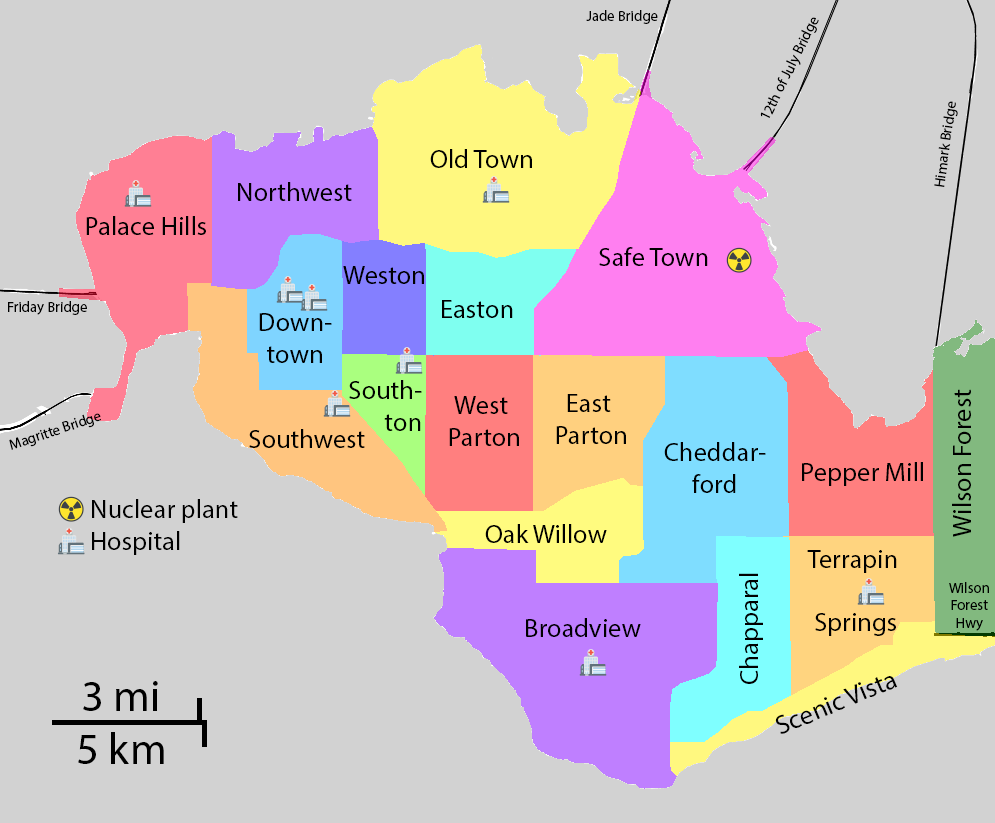

In [10]:
# Load the image
image_path = "StHimarkNeighborhoodMap.png"
image = Image.open(image_path)

# Get the size of the image
img_width, img_height = image.size

# Define the latitude and longitude coordinates of the corners
corner1 = (0.238585, -120.000000)
corner2 = (0.000000, -120.000000)
corner3 = (0.000000, -119.711751)
corner4 = (0.238585, -119.711751)

# Convert latitude and longitude to pixel coordinates
def lat_lon_to_pixel(lat, lon):
    x = (lon - (-120.000000)) / ((-119.711751) - (-120.000000)) * img_width
    y = (0.238585 - lat) / (0.238585 - 0) * img_height
    return x, y

# Convert the corners to pixel coordinates
x1, y1 = lat_lon_to_pixel(corner1[0], corner1[1])
x2, y2 = lat_lon_to_pixel(corner2[0], corner2[1])
x3, y3 = lat_lon_to_pixel(corner3[0], corner3[1])
x4, y4 = lat_lon_to_pixel(corner4[0], corner4[1])


# Convert latitude and longitude of sensors to pixel coordinates
stationary_sensor_location['x'], stationary_sensor_location['y'] = zip(*stationary_sensor_location.apply(lambda row: lat_lon_to_pixel(row['Lat'], row['Long']), axis=1))

# Create the figure
fig = px.imshow(image)

# Add the red lines on the image
fig.add_trace(go.Scatter(x=[x1, x2], y=[y1, y2], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x2, x3], y=[y2, y3], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x3, x4], y=[y3, y4], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x4, x1], y=[y4, y1], line=dict(color="red", width=2), showlegend=False))

# Create the hover text with both coordinates and Sensor-id
hover_text = stationary_sensor_location.apply(lambda row: f"Sensor-id: {row['Sensor-id']}<br>Lat: {row['Lat']}<br>Long: {row['Long']}", axis=1)

# Add the sensor locations as black dots with hover text
fig.add_trace(go.Scatter(x=stationary_sensor_location['x'], y=stationary_sensor_location['y'], 
                         mode='markers', marker=dict(color='black', size=8), 
                         text=hover_text, 
                         hoverinfo='text', showlegend=False))

# Update the layout to remove axis ticks and labels and set the default figure size
fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False, xaxis_zeroline=False, yaxis_zeroline=False,
                  xaxis_showticklabels=False, yaxis_showticklabels=False,
                  width=900, height=700)

# Show the plot
fig.show()


# Geographic Plot of Mobile Sensors

In [13]:
'''Important Note: This cell takes a little bit to run, so run only once'''

# Convert latitude and longitude of mobile sensors to pixel coordinates so that locationa data 
#  can be accurately represented in visuals.
mobile_sensor_data['x'], mobile_sensor_data['y'] = zip(*mobile_sensor_data.apply(lambda row: lat_lon_to_pixel(row['Lat'], row['Long']), axis=1))

mobile_sensor_data.sort_values(by = ['Timestamp'], inplace = True)


In [6]:
# Preview to check if the new columns were generated and populated
mobile_sensor_data.head()


,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,x,y
0,2020-04-06 00:00:00,15,-119.83035,0.14007,0.0,cpm,CitizenScientist,585.610878,339.827923
27,2020-04-06 00:00:00,4,-119.93185,0.18734,0.0,cpm,ASWillhiem,235.245395,176.769851
28,2020-04-06 00:00:00,34,-119.80541,0.08323,0.0,cpm,CitizenScientist,671.700682,535.897751
29,2020-04-06 00:00:00,45,-119.83122,0.06235,0.0,cpm,CitizenScientist,582.607745,607.923403
30,2020-04-06 00:00:00,47,-119.87530,0.17400,0.0,cpm,UncleG,430.449022,222.786240


In [14]:
# Create a copy of the original data to act as a reference point for debugging
mobile_df = mobile_sensor_data.copy()

# Preview the mobile data
mobile_df.head()


,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,x,y
0,2020-04-06 00:00:00,15,-119.83035,0.14007,0.0,cpm,CitizenScientist,585.610878,339.827923
24,2020-04-06 00:00:00,5,-119.86892,0.19111,0.0,cpm,CitizenScientist,452.471995,163.765220
2,2020-04-06 00:00:00,40,-119.89067,0.11658,0.0,cpm,MutantX,377.393677,420.856781
3,2020-04-06 00:00:00,1,-119.96665,0.18792,0.0,cpm,MySensor,115.120087,174.769139
4,2020-04-06 00:00:00,27,-119.80570,0.01711,0.0,cpm,CitizenScientist,670.699638,763.978980


### Transform the data for Geograpic plotting

In [44]:
print("Filtering on sensor and grouping by location")

# Due to a new row of data being generated every 5 seconds, there are a lot of cases where the sensors
#  remain in the same spot for multiple readings. Thus we will group by only the max radiation values 
#  at each location
mobile_df = mobile_df.groupby(["x","y"]).max()

# Reset the index to alter the dataframe. Otherwise, we'd only be creating a view of the the
#  transformation.
mobile_df.reset_index(inplace=True)

# Convert 'Timestamp' to datetime for visualization hover text
mobile_df['Timestamp'] = pd.to_datetime(mobile_df['Timestamp'])

# Scale the radiation values so that there's more differentiation in radiation visualization
mobile_df['Value'] = np.log10(mobile_df['Value'])


Filtering on sensor and grouping by location


C:\Users\andio\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning:

divide by zero encountered in log10

C:\Users\andio\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning:

invalid value encountered in log10



In [27]:
#Important Note(s):
# -If there exists a radiation value of 0 at any given time or place, log scaling will result in
#  nonsensical +inf & -inf values will be generated. These points are valid and should not be 
#  discarded, so simply set them equal to 0 after the transformation (i.e. log-scaling).

# Replace -inf and inf with 0 in the 'Value' column
mobile_df['Value'] = mobile_df['Value'].replace([-np.inf, np.inf], 0)

mobile_df.describe() # confirm there are no longer infinite values resulting from log-scaling step


,x,y,Sensor-id,Long,Lat,Value
count,197052.000000,197052.000000,197052.000000,197052.000000,197052.000000,197052.000000
mean,523.793057,357.903135,25.060086,-119.848258,0.134830,1.404268
std,184.131552,162.807059,14.230044,0.053342,0.047197,0.266861
min,0.172594,0.734744,1.000000,-119.999950,0.017057,-2.105046
25%,401.418739,244.794078,12.000000,-119.883710,0.110250,1.230449
50%,513.760065,352.142654,24.000000,-119.851165,0.136500,1.462398
75%,634.089034,442.693868,37.000000,-119.816306,0.167620,1.585032
max,994.837762,764.161804,50.000000,-119.711798,0.238372,4.758497


#  Mobile Sensors Timeseries Plot of DATE against AVERAGE Radiation Value

### Individual plots  (AVG by Sensor and Date)
#### - Can extrapulate car operation behavior (i.e. on off)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


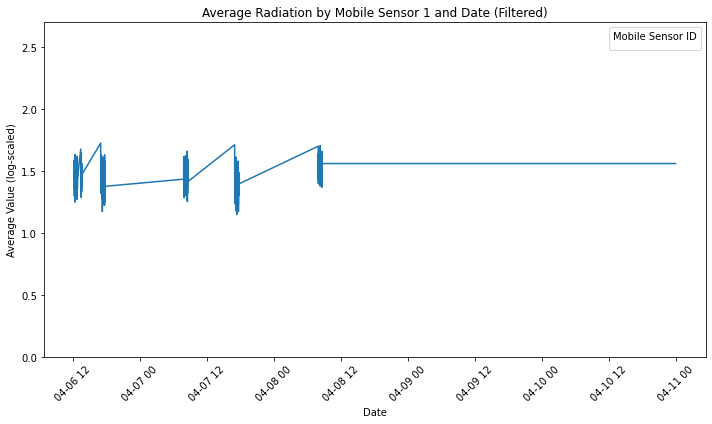

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


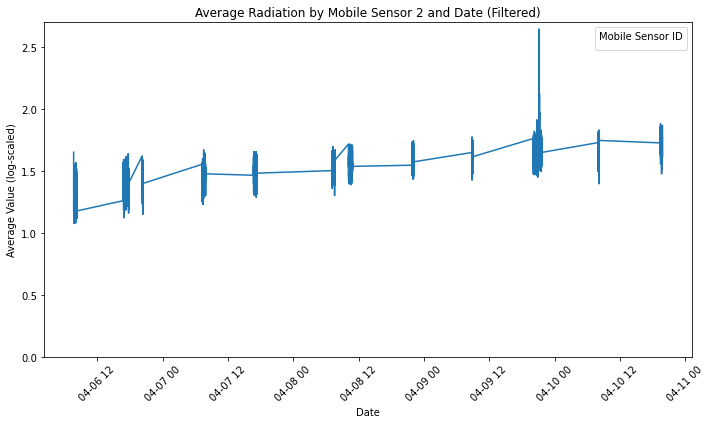

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


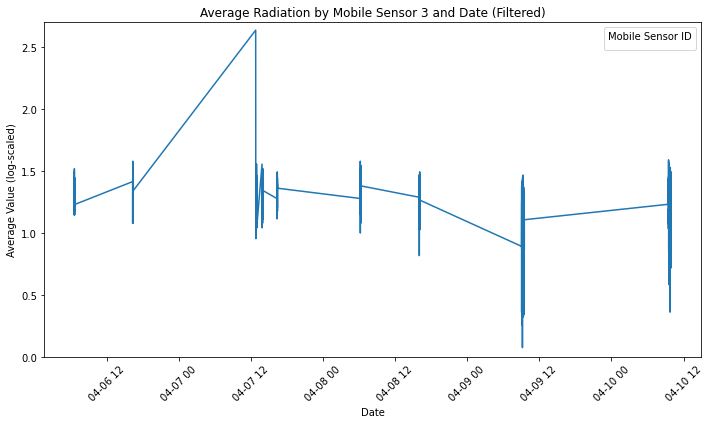

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


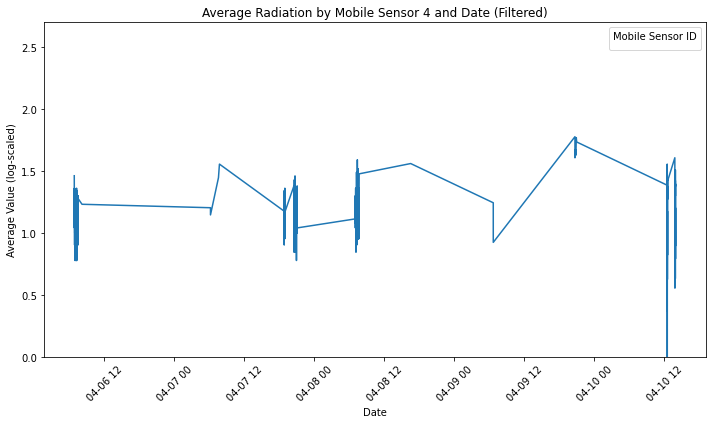

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


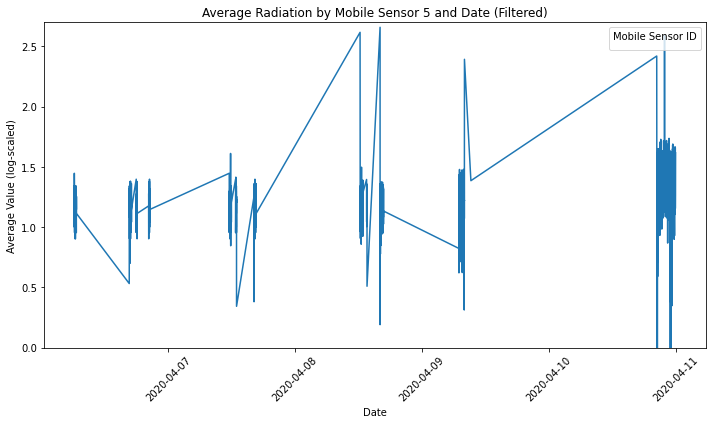

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


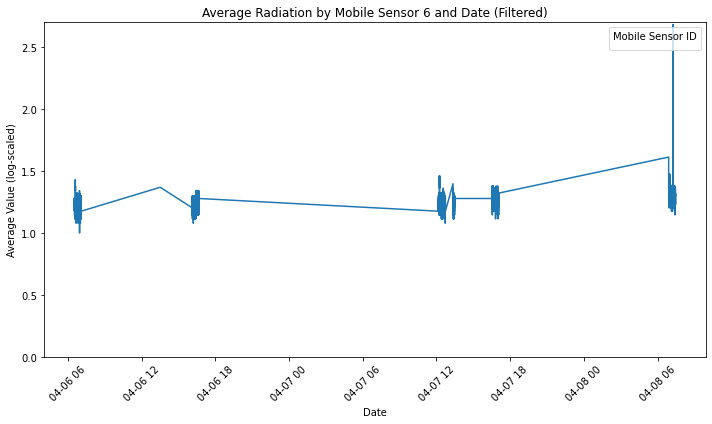

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


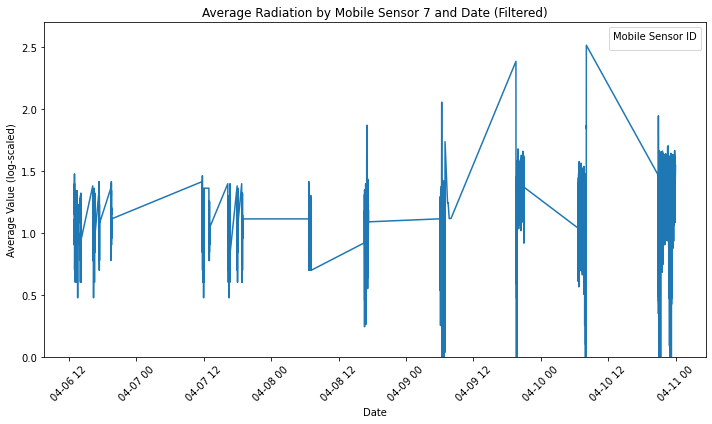

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


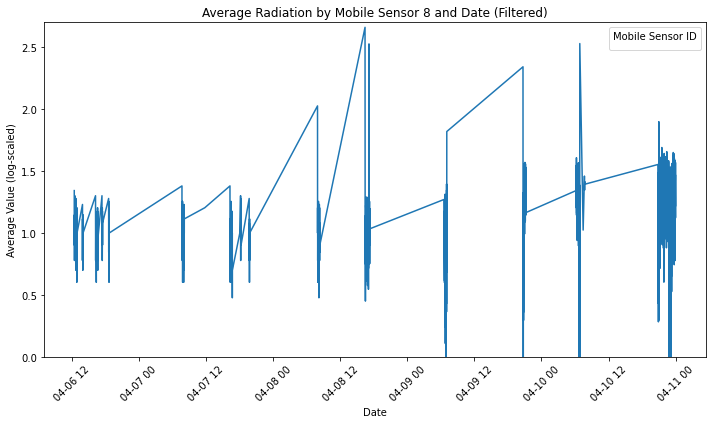

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


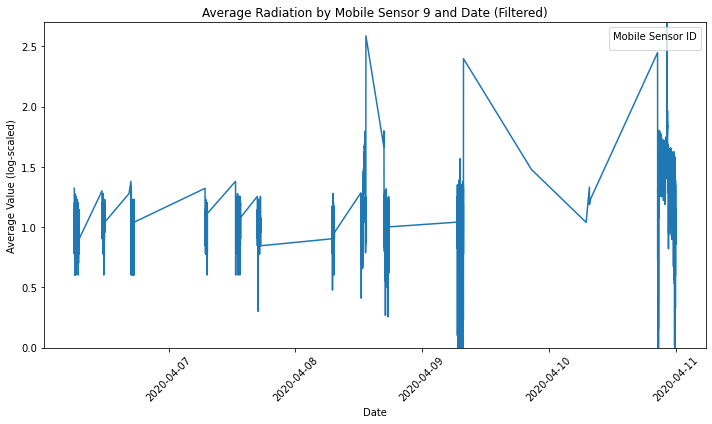

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


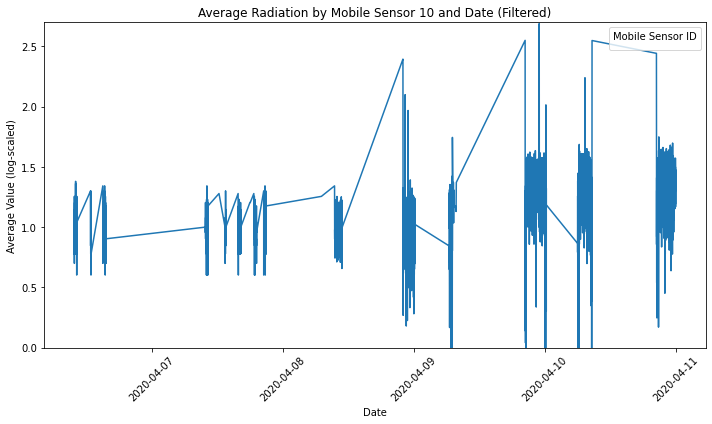

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


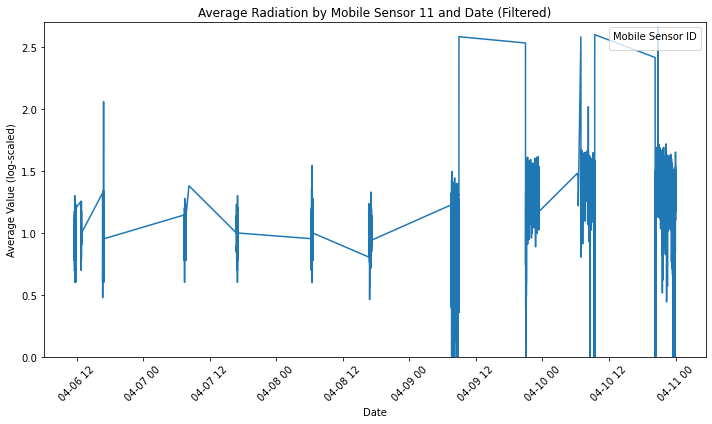

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


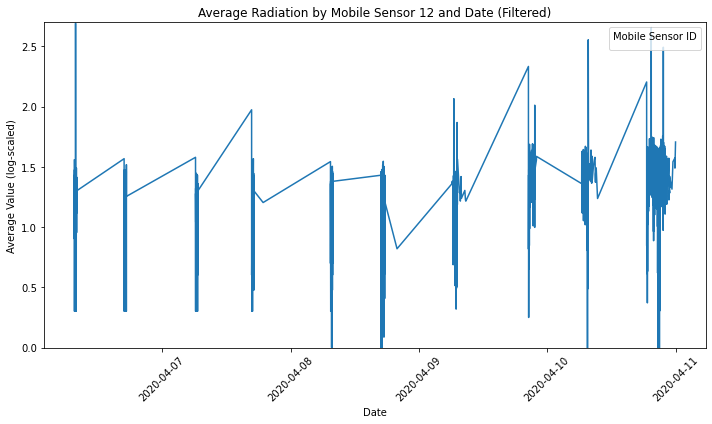

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


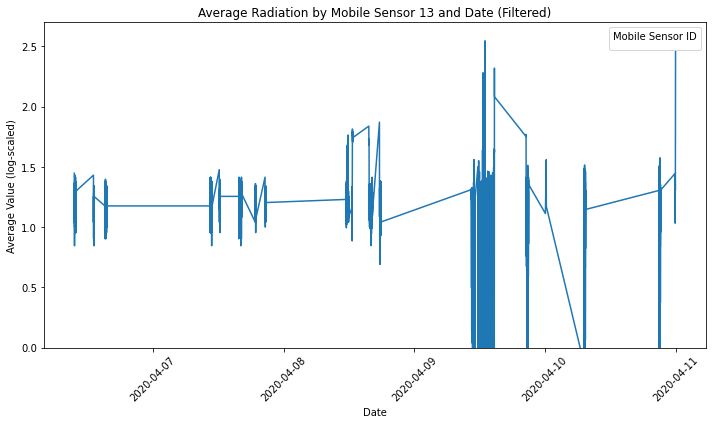

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


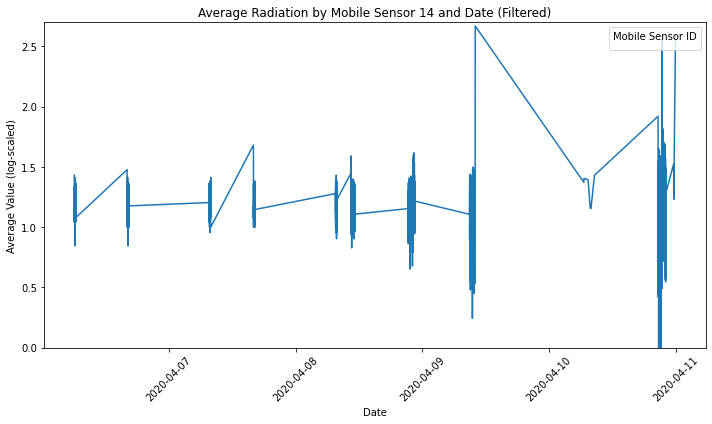

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


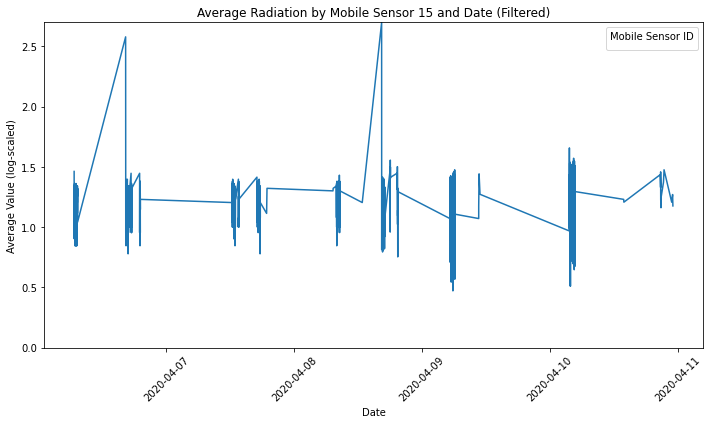

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


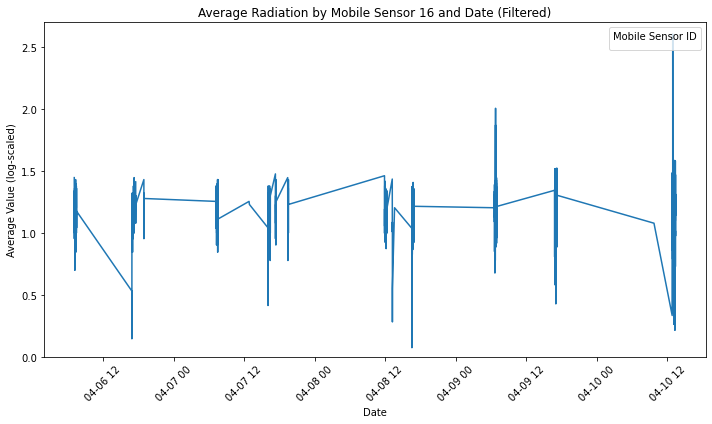

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


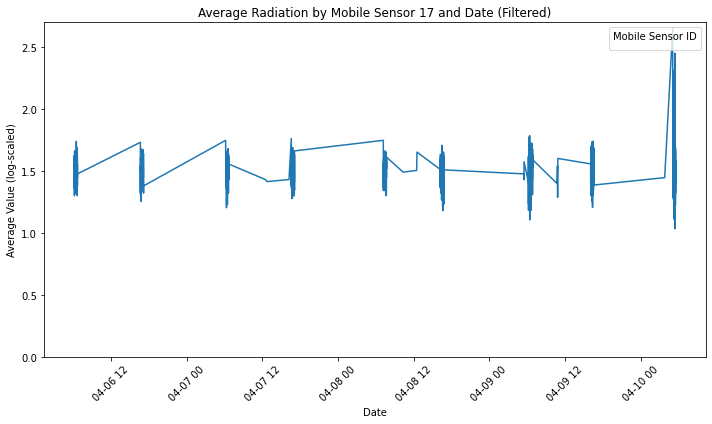

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


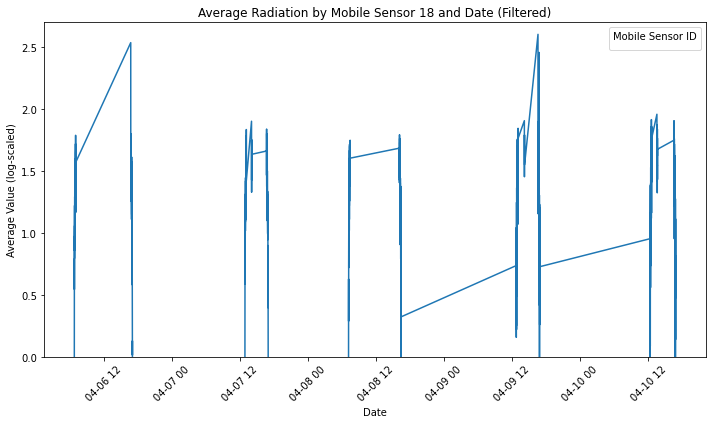

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


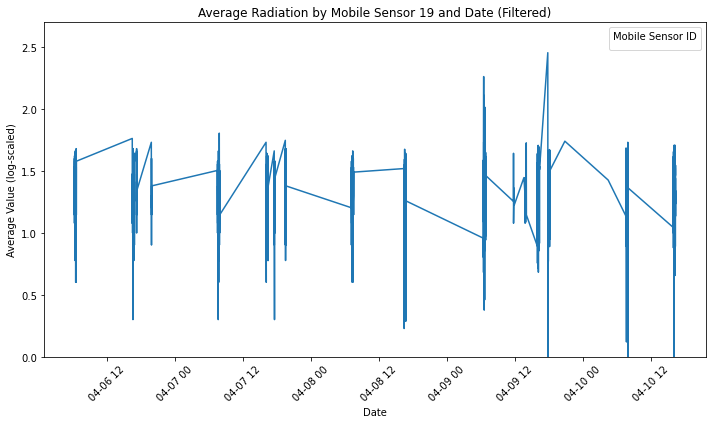

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


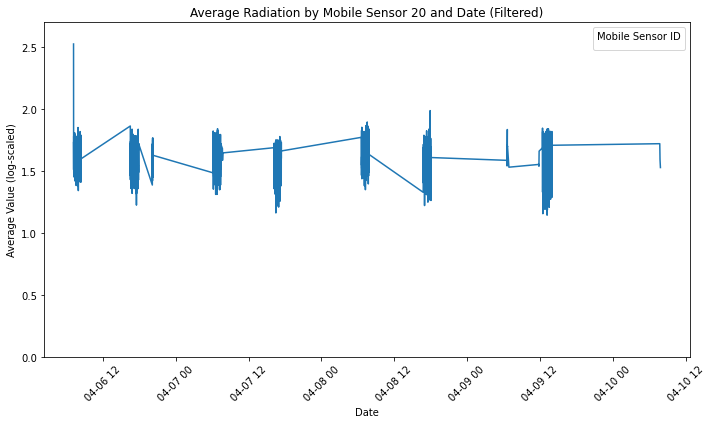

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


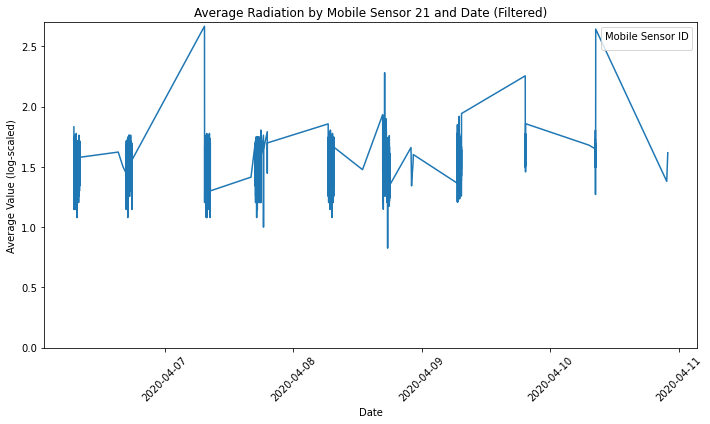

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


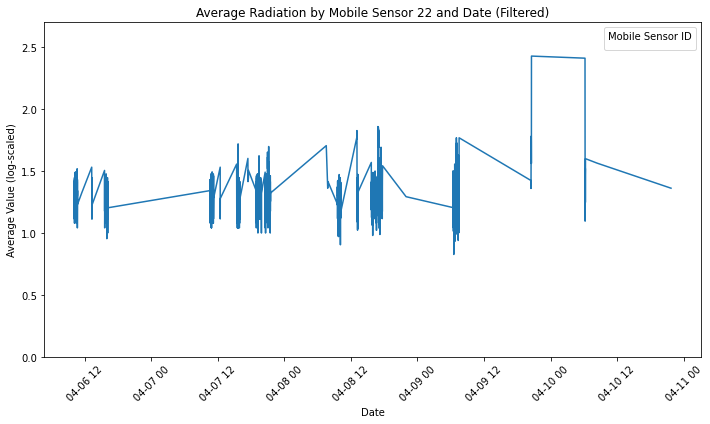

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


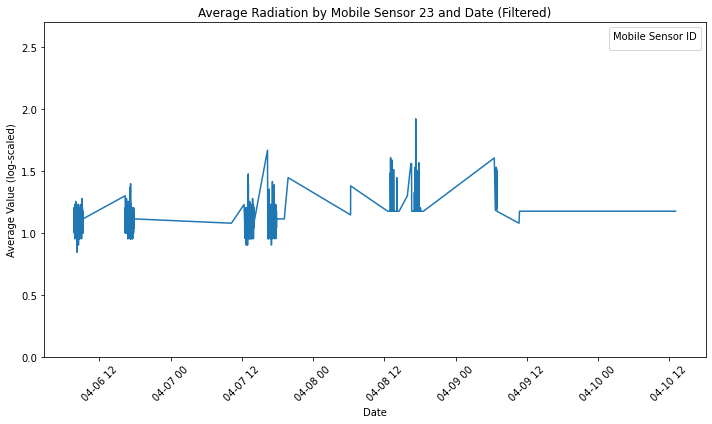

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


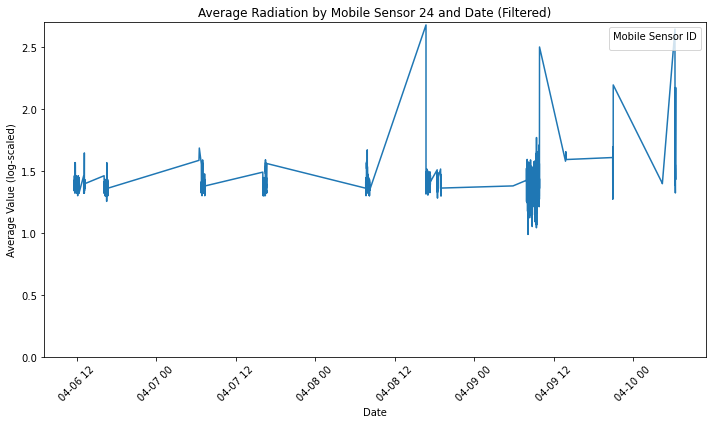

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


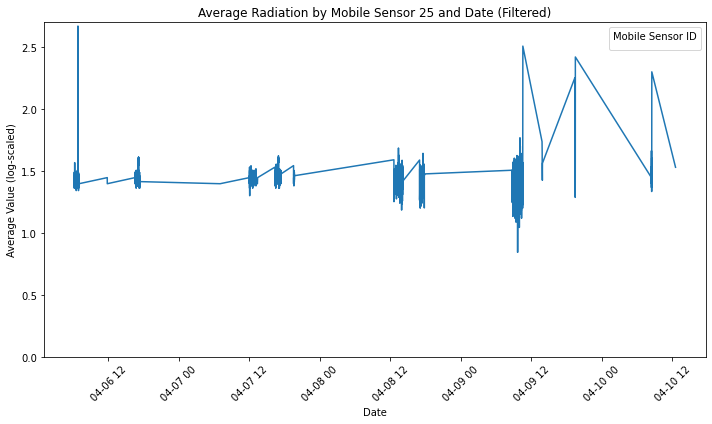

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


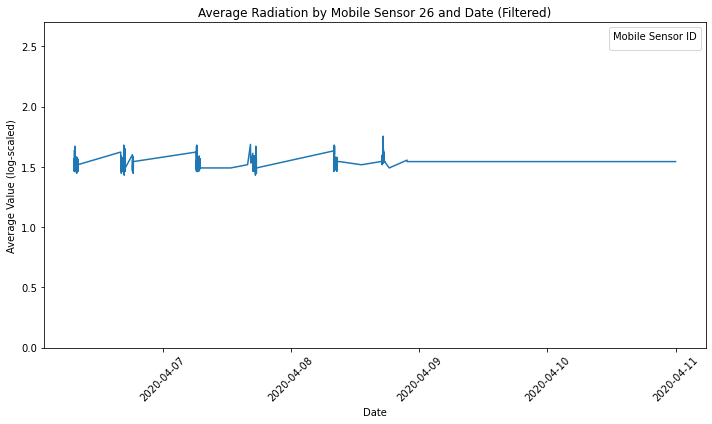

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


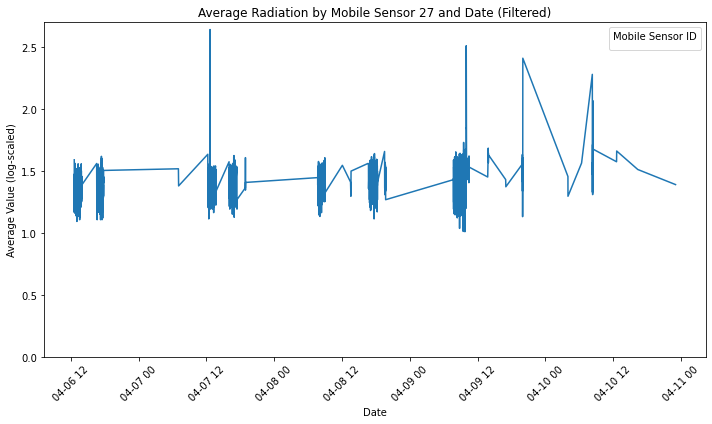

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


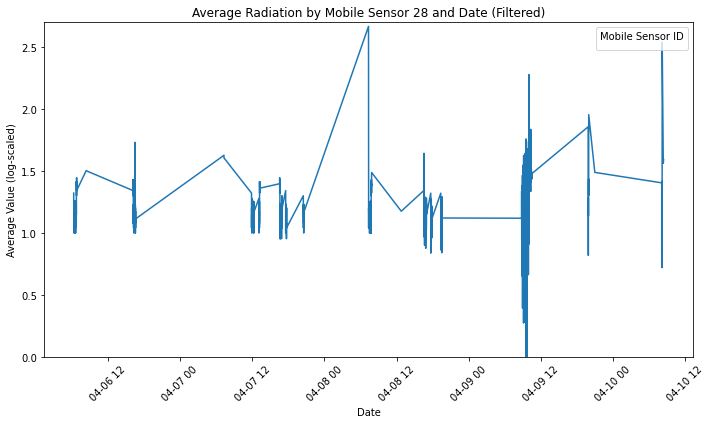

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


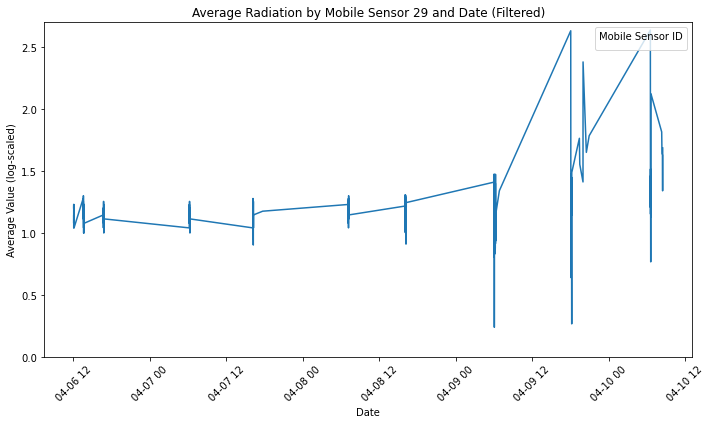

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


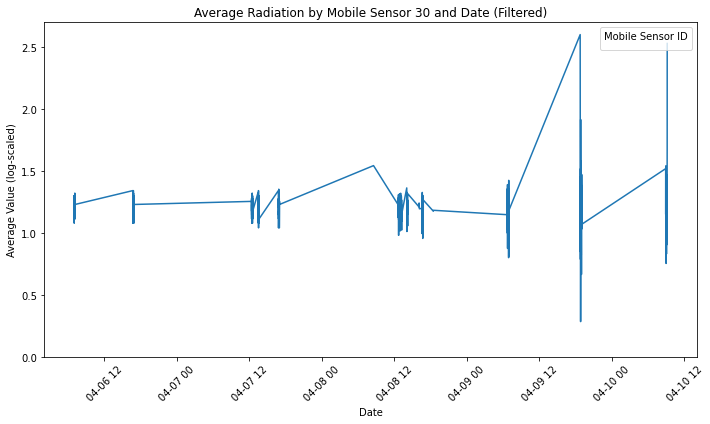

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


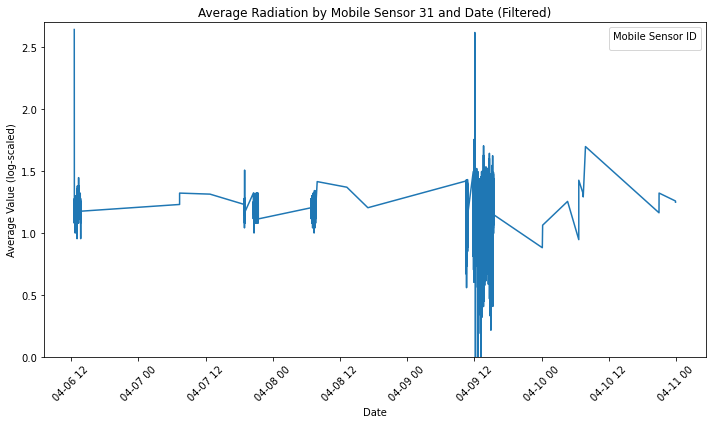

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


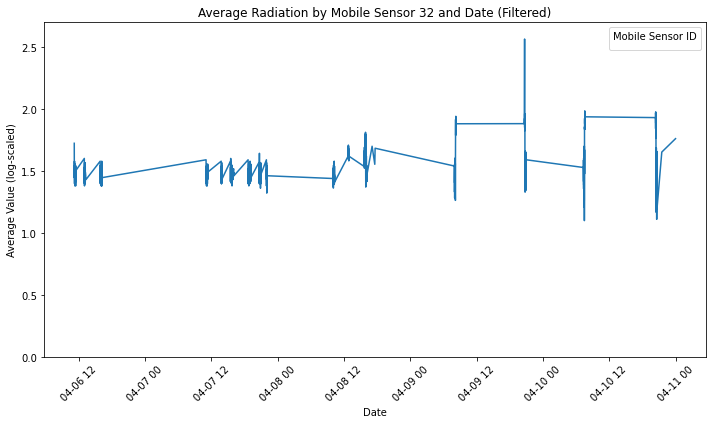

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


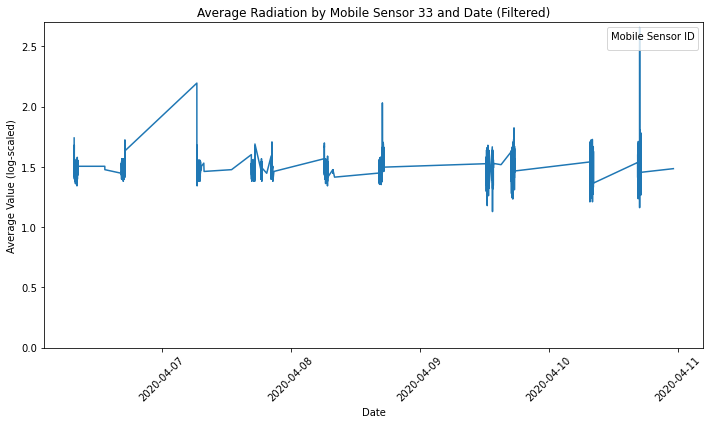

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


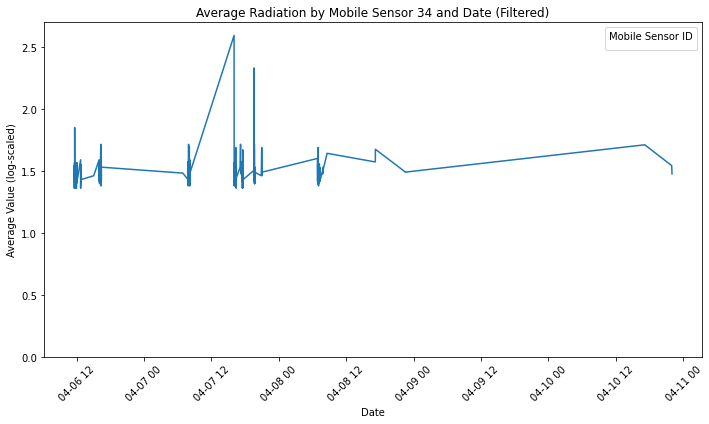

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


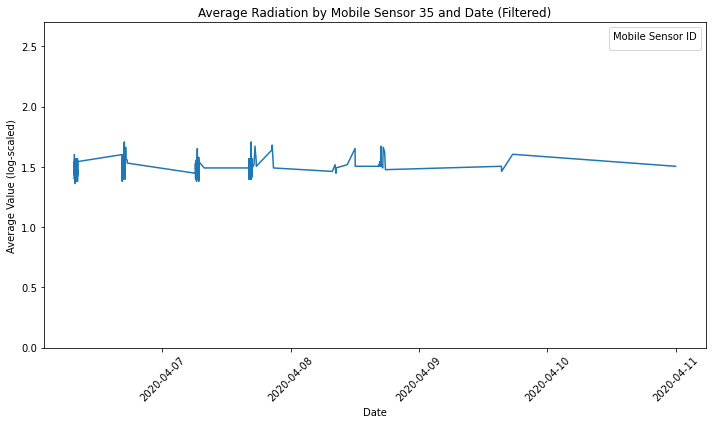

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


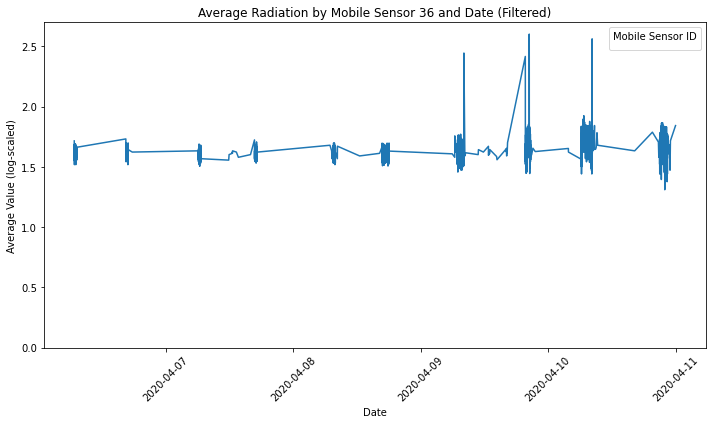

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


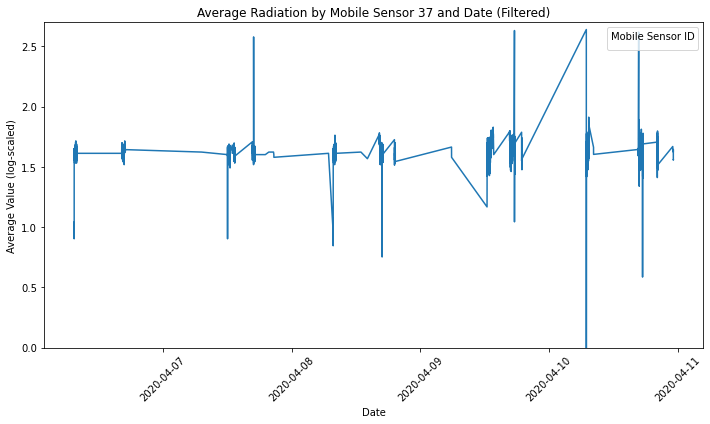

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


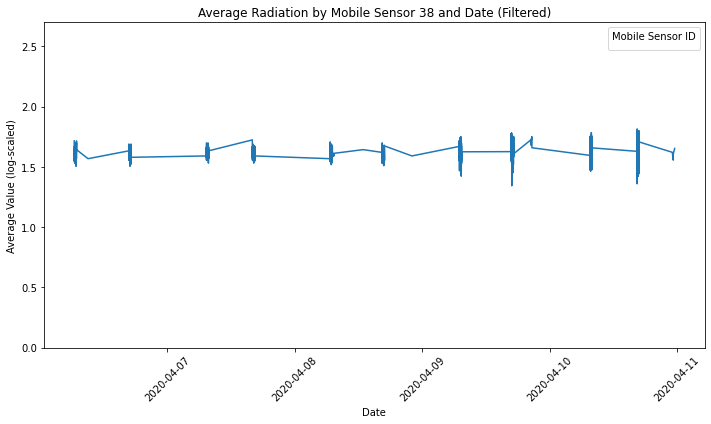

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


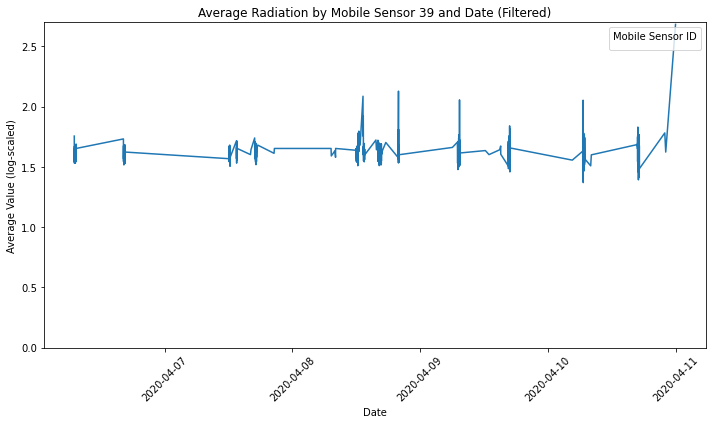

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


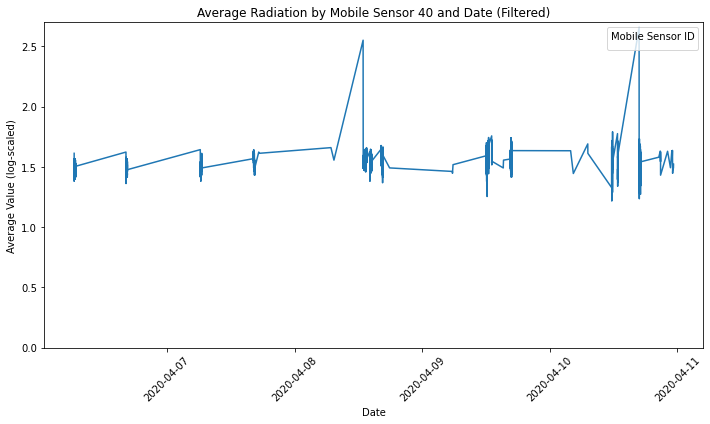

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


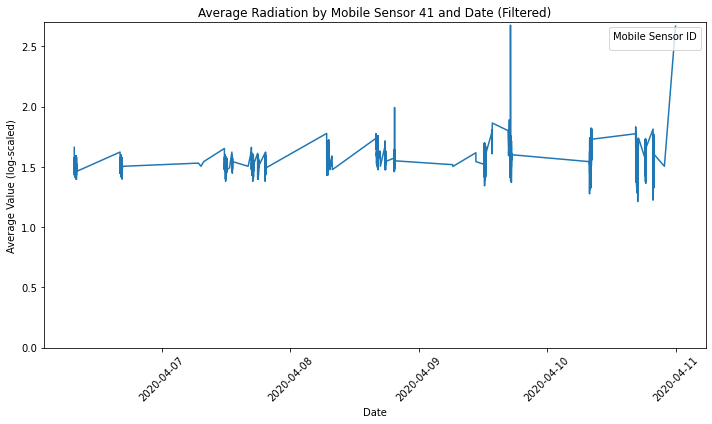

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


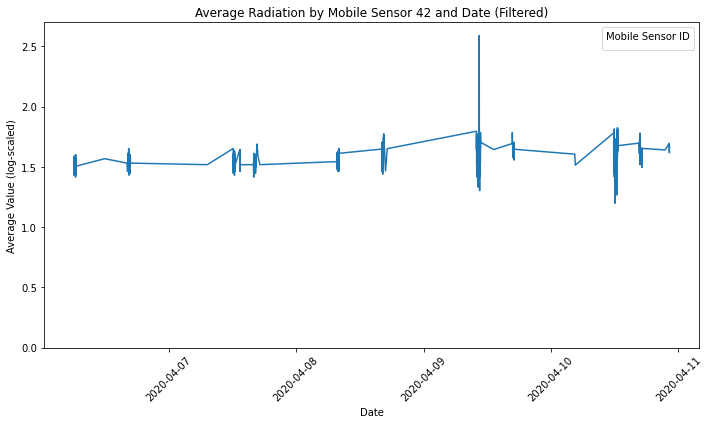

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


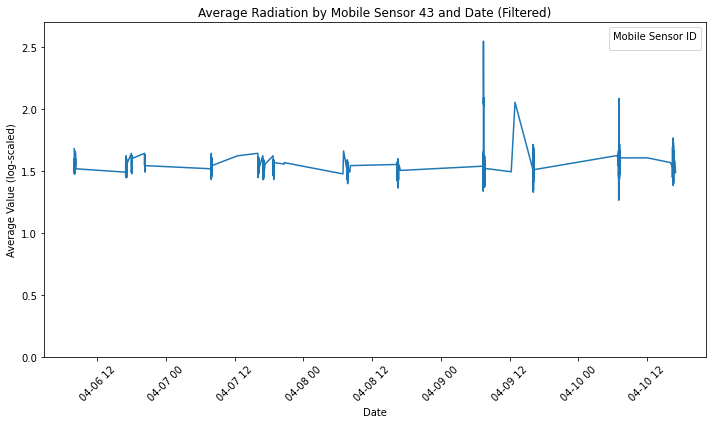

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


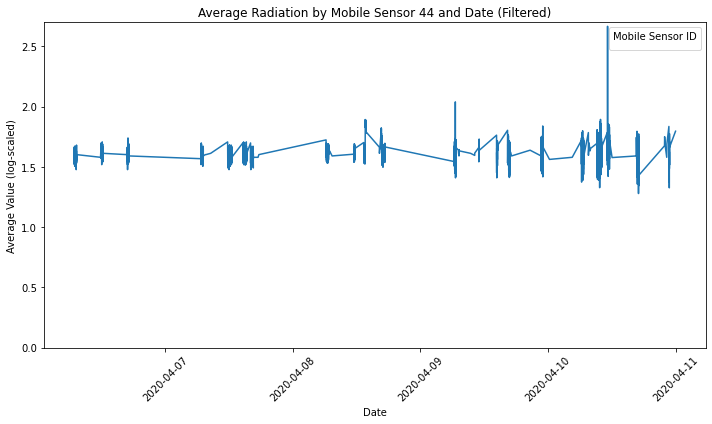

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


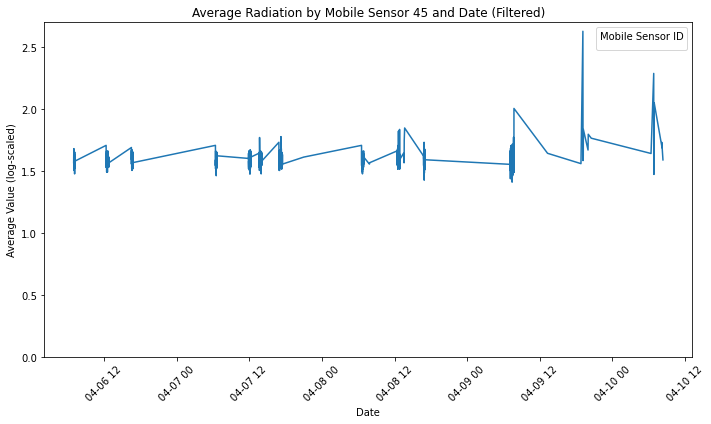

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


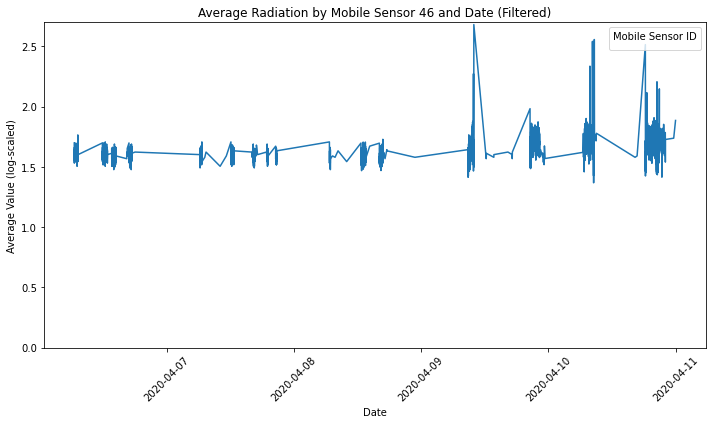

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


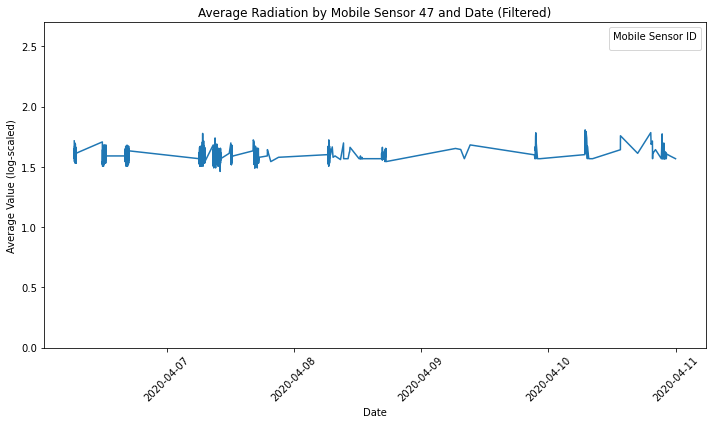

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


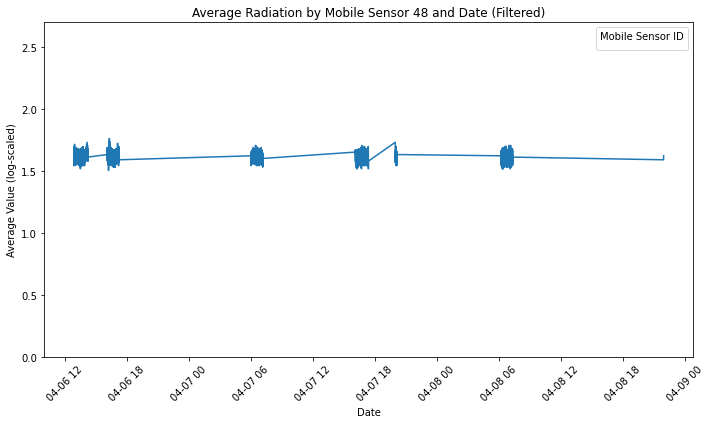

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


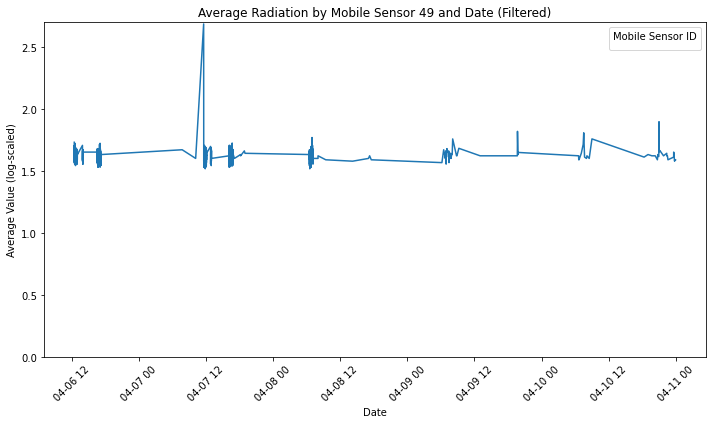

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


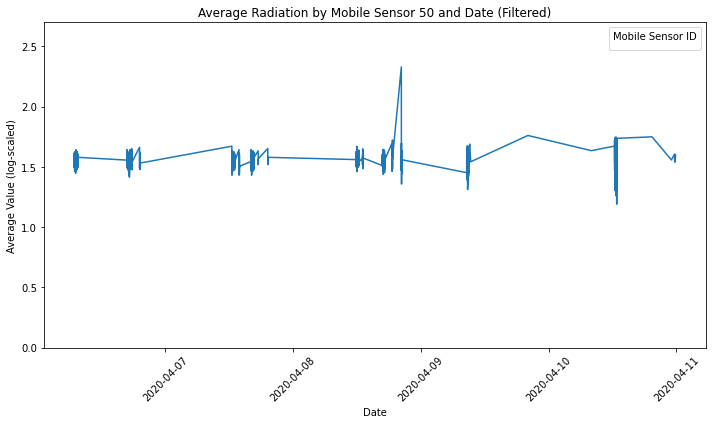

In [19]:
'''Office Hours Note(complete)
There appears to be a large spike in reading whenever the car turns back on 
(i.e. the sensor isn't collecting data unless the car is turned on) which creates the gaps between 
readings. 

You might want to remove these error readings caused by sensor warmup. 

Specifically, when first turned on the mobile sensors read much higher than it's actual 
environment

visit safecast.org to look at the values that inspired the values in this project
https://map.safecast.org/
'''
# Convert the 'Timestamp' column to a datetime type if it's not already
mobile_df['Timestamp'] = pd.to_datetime(mobile_df['Timestamp'])

# Calculate the number of hours since the start of the data collection
#mobile_df['Hours_since_start'] = (mobile_df['Timestamp'] - mobile_df['Timestamp'].min()).dt.total_seconds() / 3600

# Round the 'Hours_since_start' to the nearest hour
#mobile_df['Rounded_Hours'] = mobile_df['Hours_since_start'].round()

# Set the threshold value to identify spikes. In practice, this will remove those extremely high
#  readings as a result of the mobile sensor warming up.
threshold = 2.7  # find the lowest valued warmup spike

# Get unique mobile sensor IDs and sort them
unique_mobile_sensor_ids = sorted(mobile_df['Sensor-id'].unique())

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # filter out the data points that exceed the threshold
    filtered_data = sensor_data[sensor_data['Value'] <= threshold]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=filtered_data, x='Timestamp', y='Value', estimator='mean', ci=None)
    plt.xlabel('Date')
    plt.ylabel('Average Value (log-scaled)')
    plt.title(f'Average Radiation by Mobile Sensor {sensor_id} and Date (Filtered)')
    plt.xticks(rotation=45)  # rotate the x-axis labels for readability
    plt.ylim(0, 2.7)  # set y-axis limit to 2.7
    plt.tight_layout()
    plt.legend(title='Mobile Sensor ID', loc='upper right')
    plt.show()


### Combined plots (AVG by Sensor and Date)

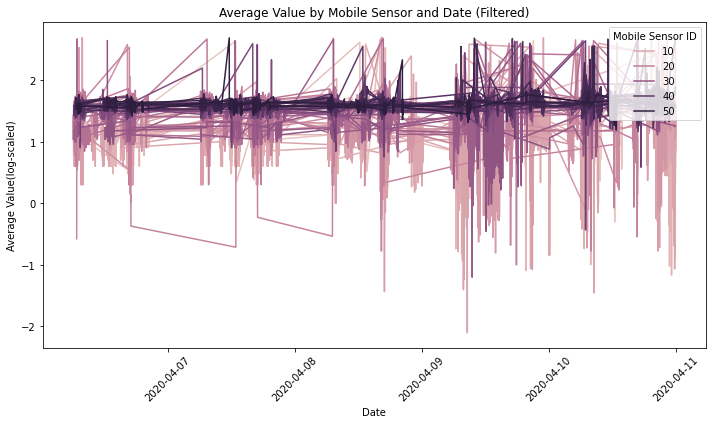

In [18]:
# Filter out the data points that exceed the threshold
filtered_mobile_df = mobile_df[mobile_df['Value'] <= threshold]

# Create a line plot using Seaborn for mobile sensors with filtered data
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_mobile_df, x='Timestamp', y='Value', hue='Sensor-id', estimator='mean', ci=None)
plt.xlabel('Date')
plt.ylabel('Average Value(log-scaled)')
plt.title('Average Value by Mobile Sensor and Date (Filtered)')
plt.xticks(rotation=45)  # rotate the x-axis labels for readability
plt.tight_layout()
plt.legend(title='Mobile Sensor ID', loc='upper right')
plt.show()


#  Mobile Sensors Timeseries Plot of DATE against MAXIMUM Radiation Values

#### We check max values to account for rises in radiation that don't drastically affect the average value

### Individual plots (MAX by Sensor and Date)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


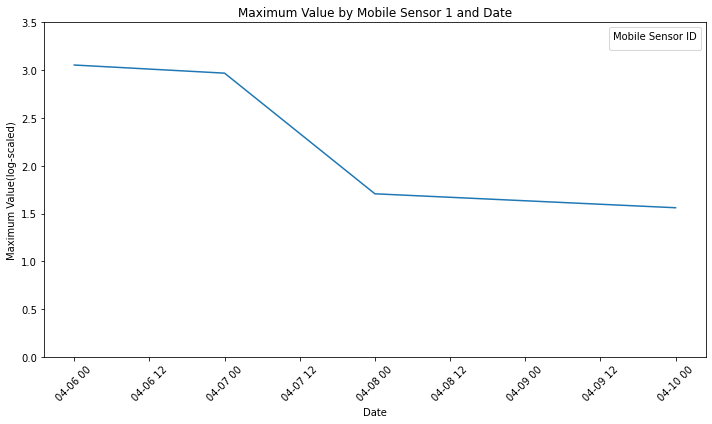

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


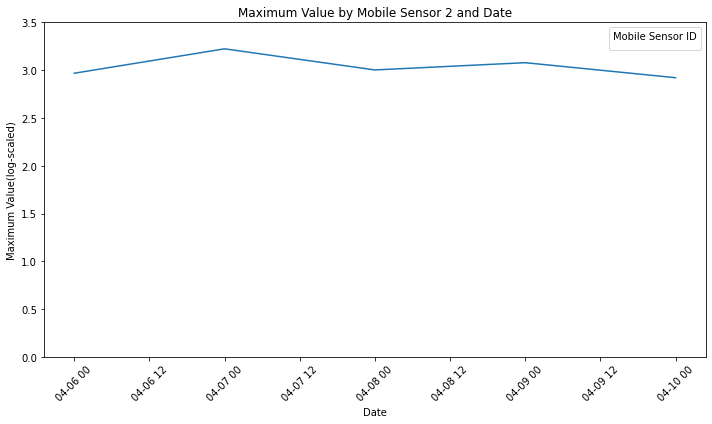

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


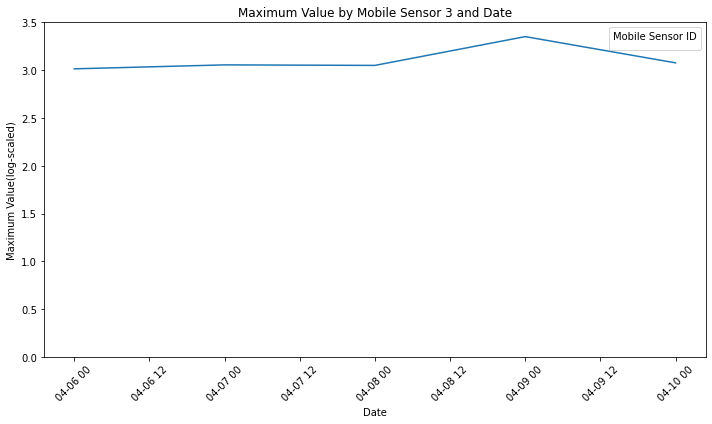

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


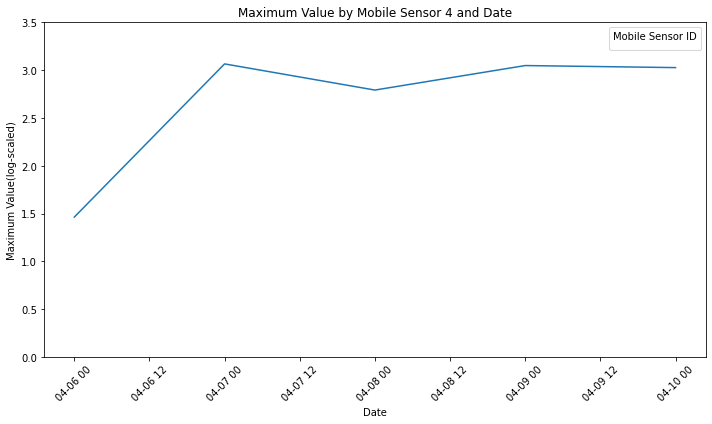

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


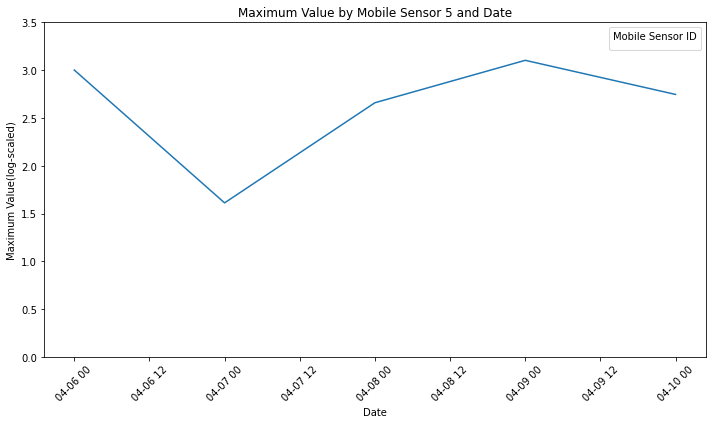

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


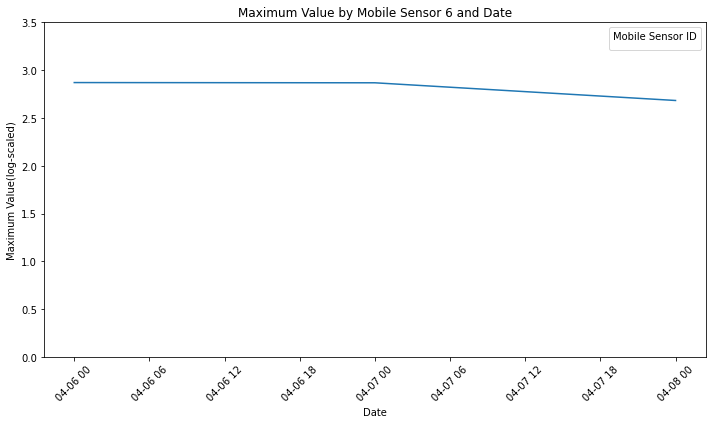

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


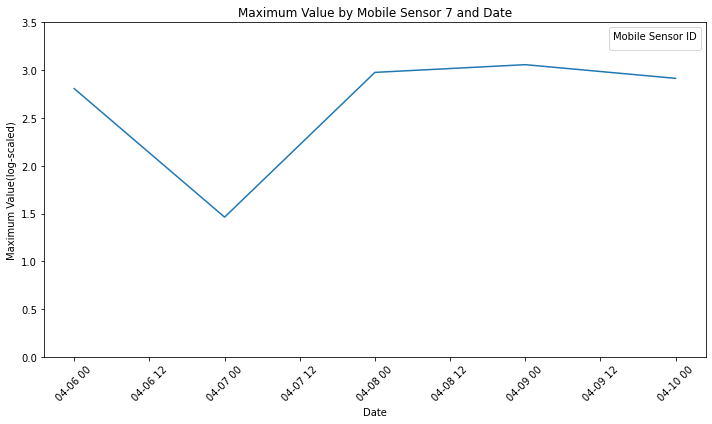

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


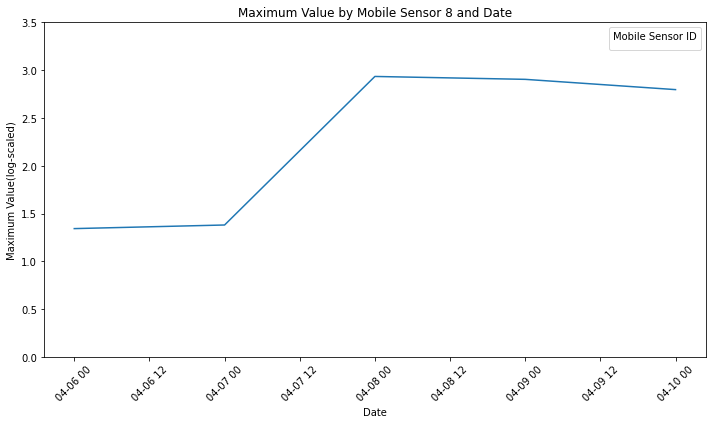

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


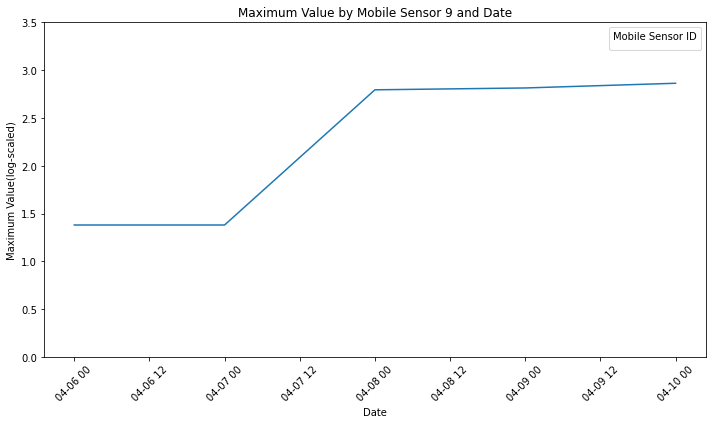

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


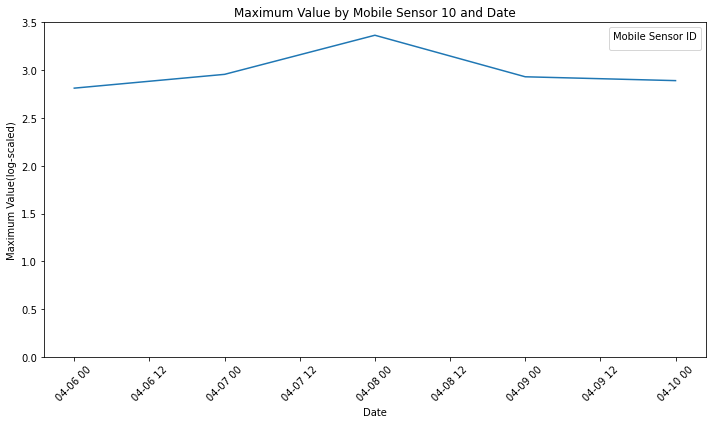

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


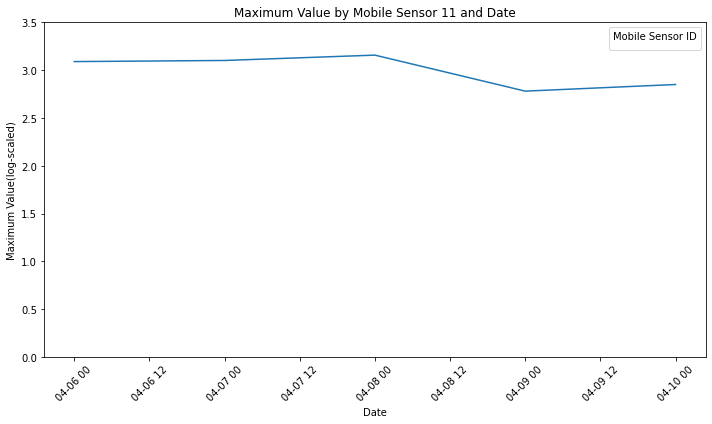

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


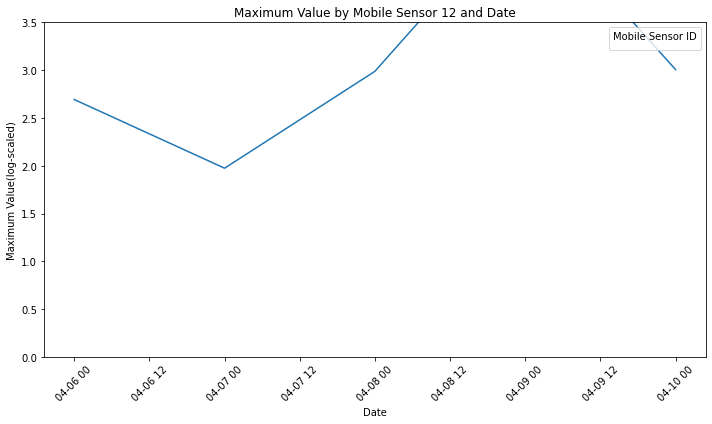

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


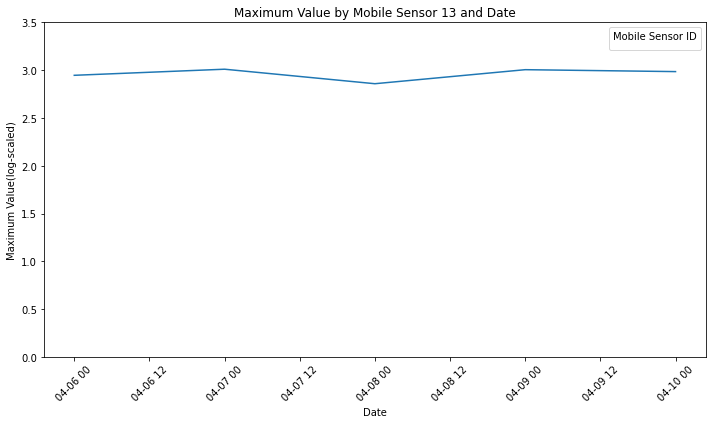

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


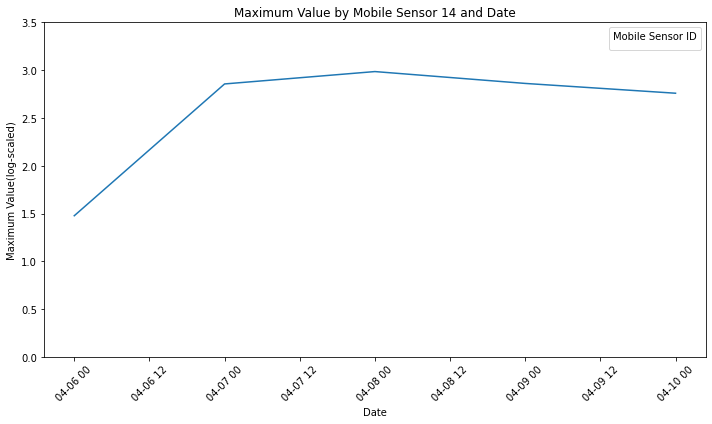

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


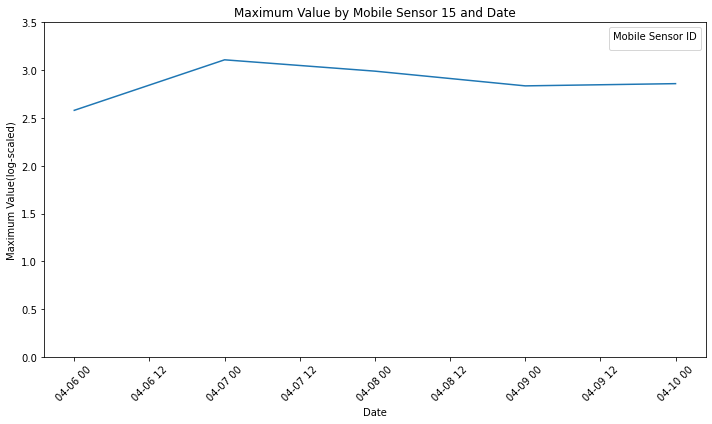

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


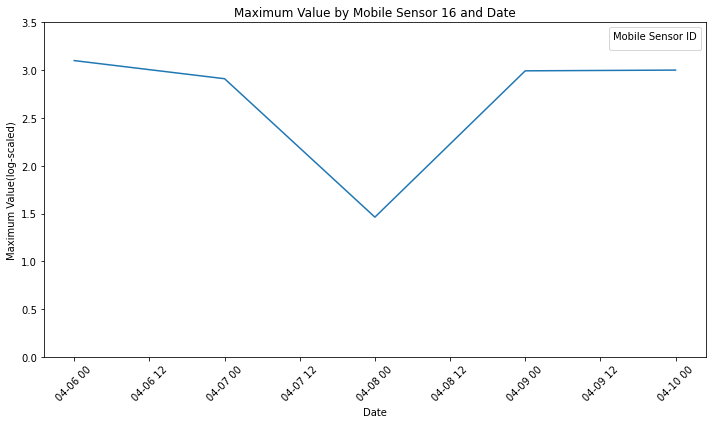

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


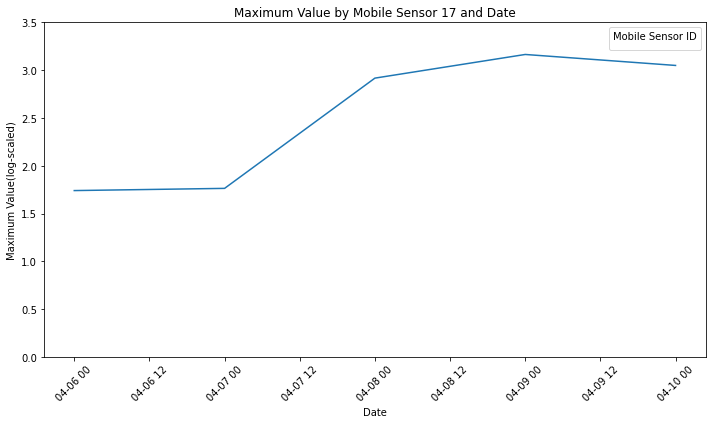

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


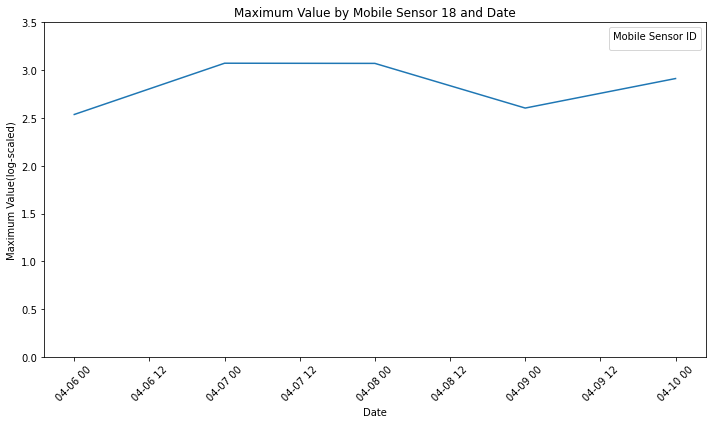

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


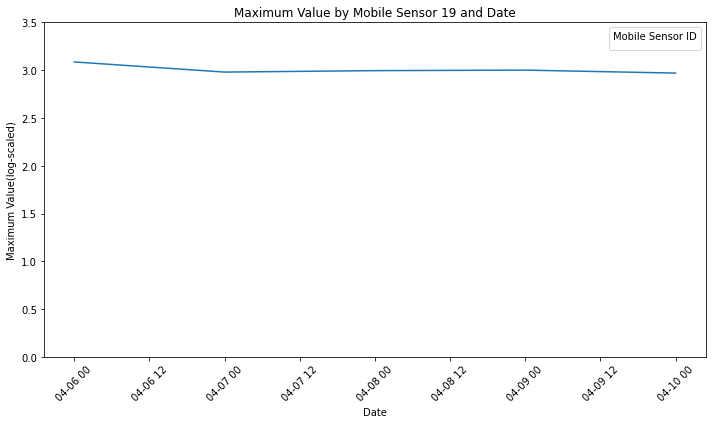

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


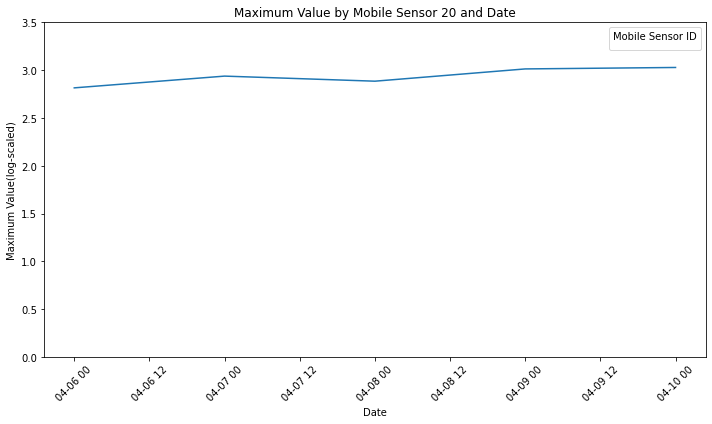

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


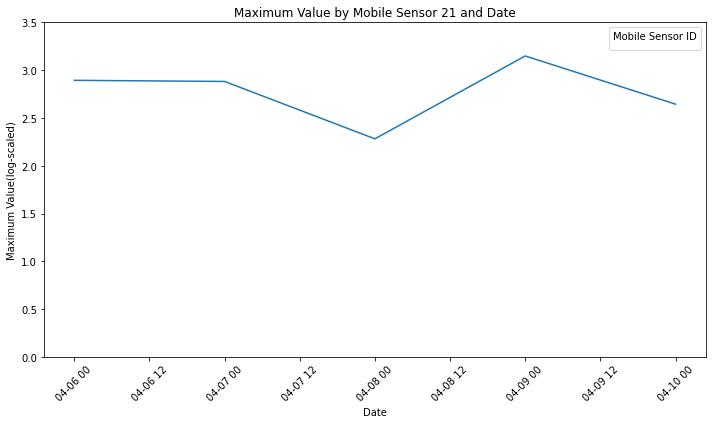

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


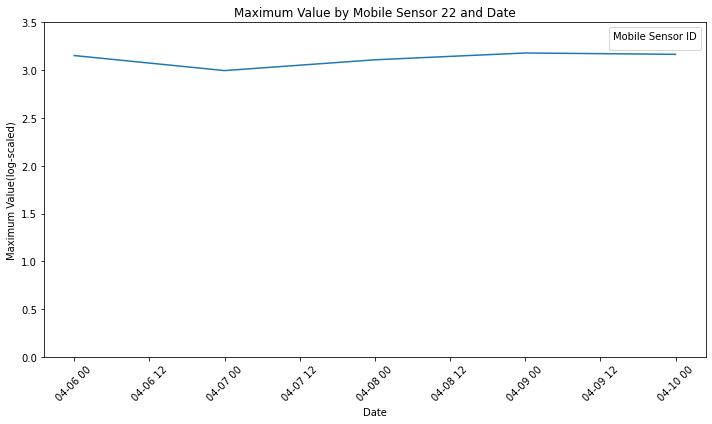

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


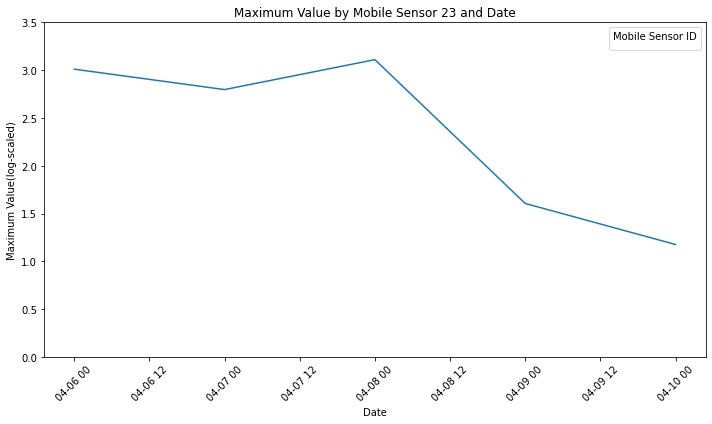

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


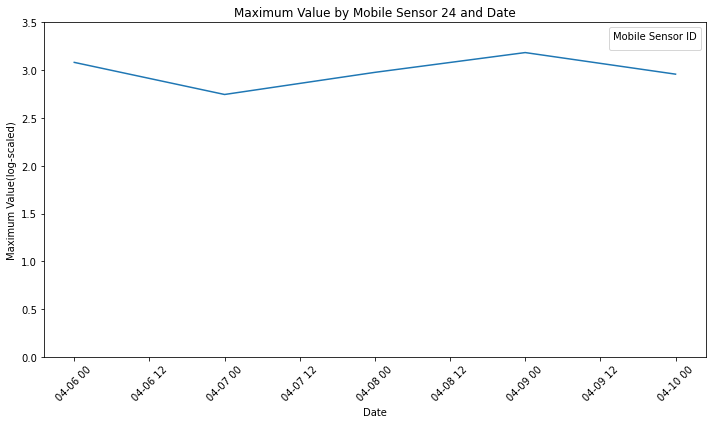

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


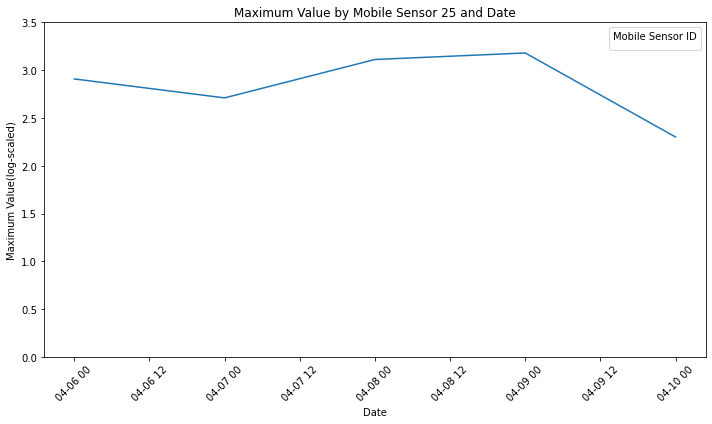

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


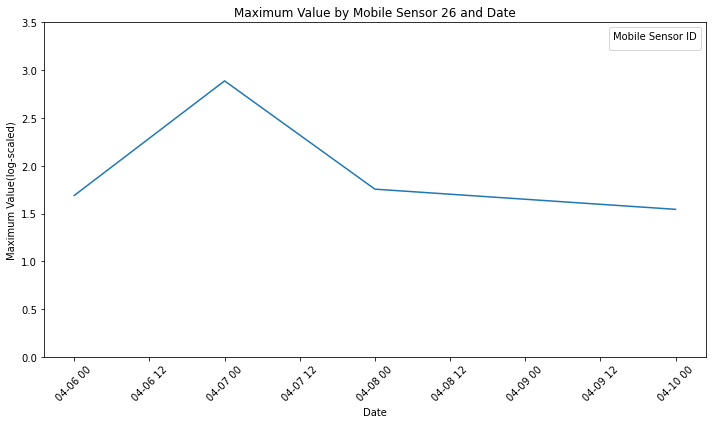

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


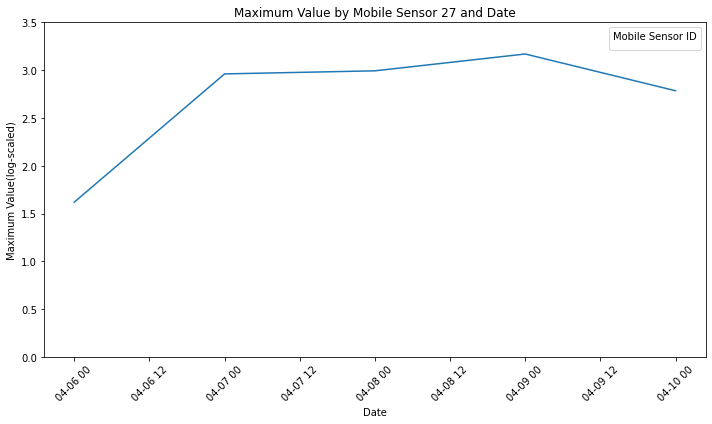

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


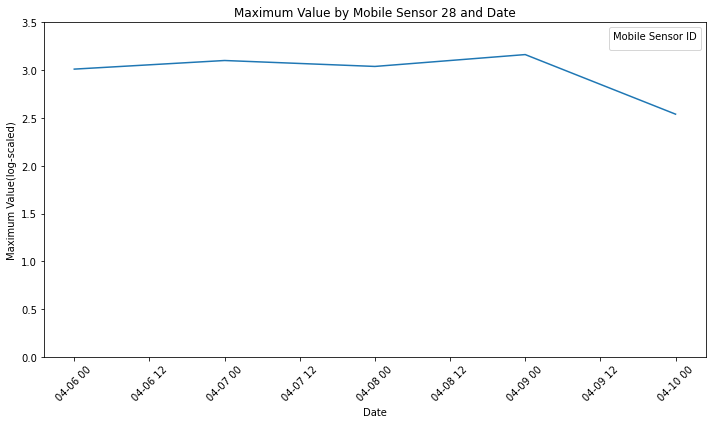

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


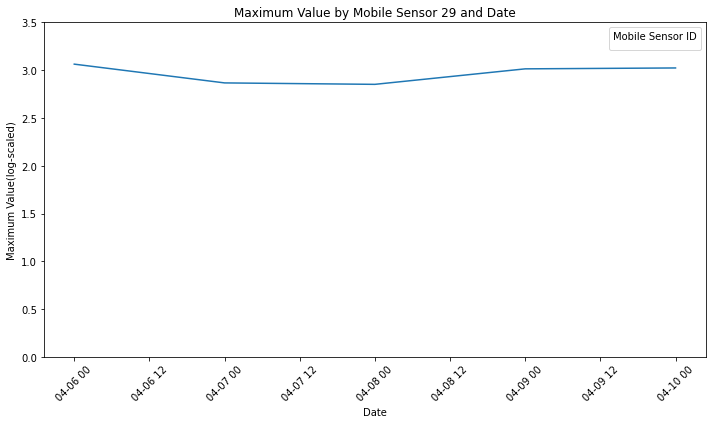

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


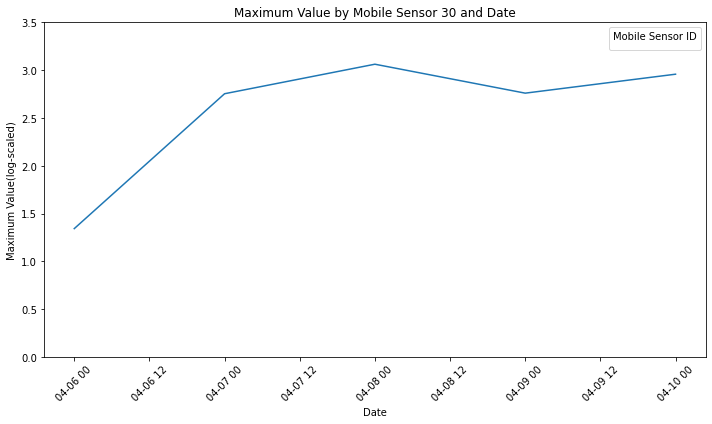

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


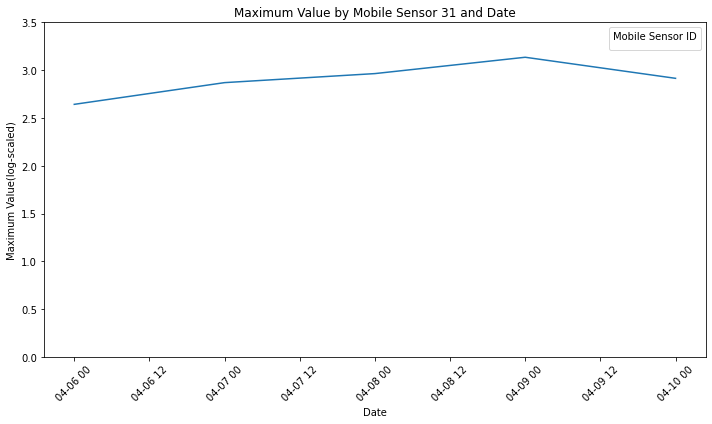

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


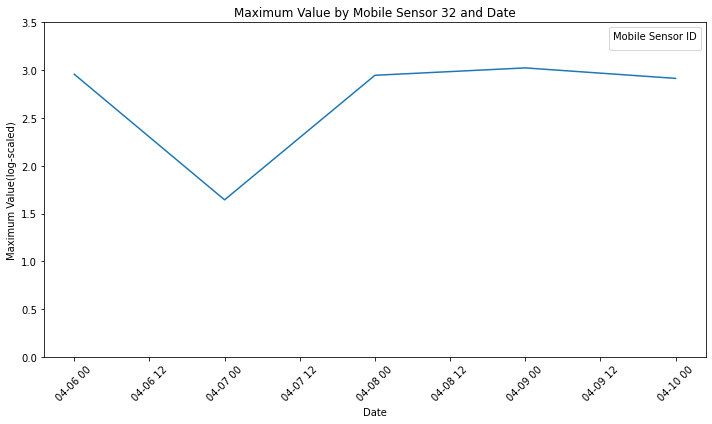

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


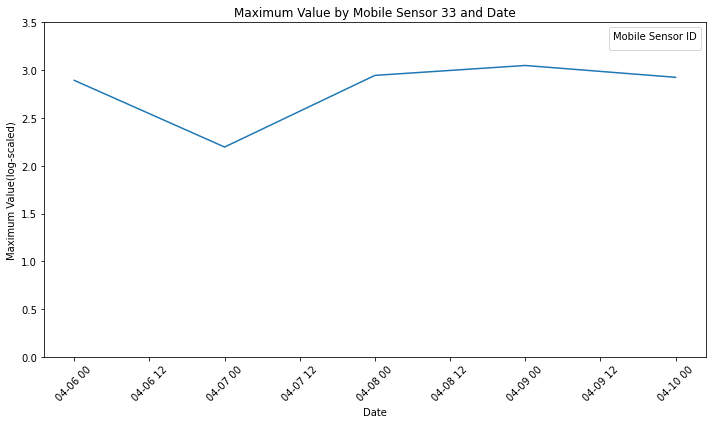

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


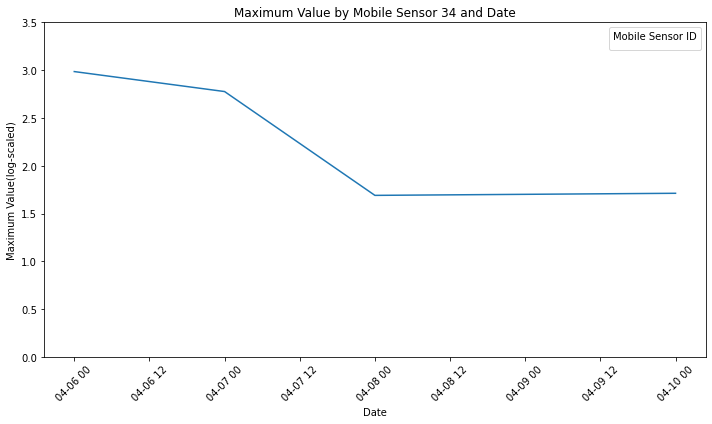

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


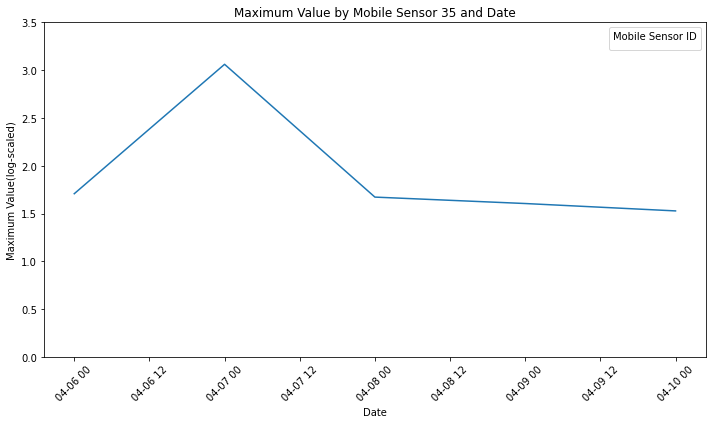

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


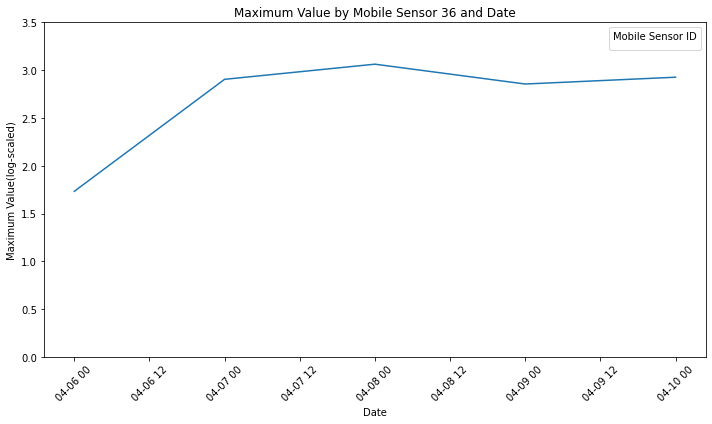

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


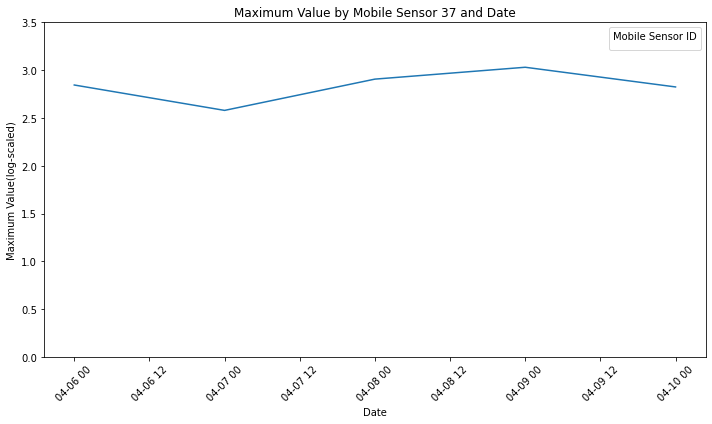

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


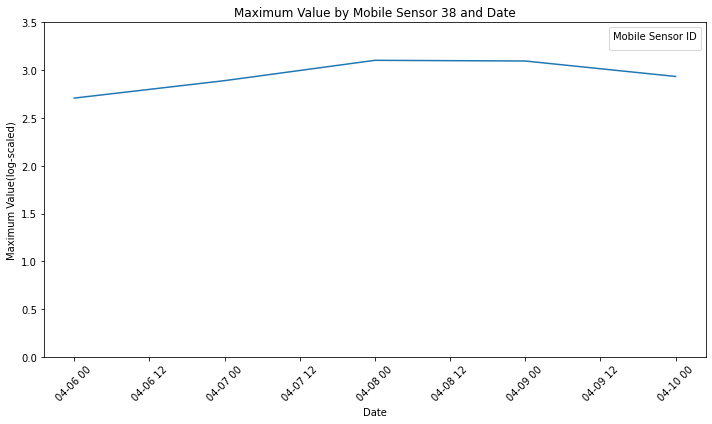

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


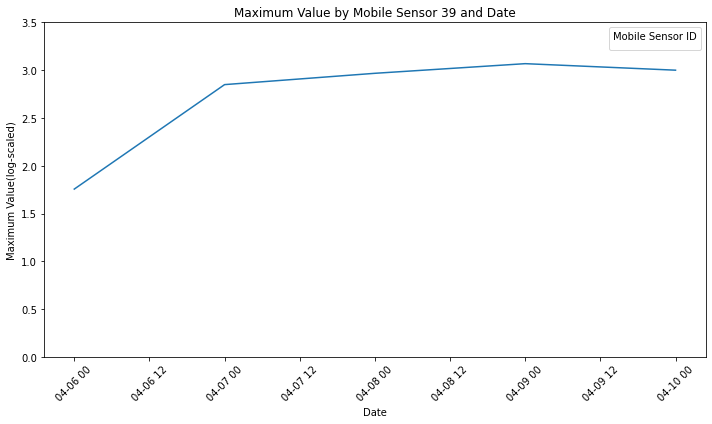

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


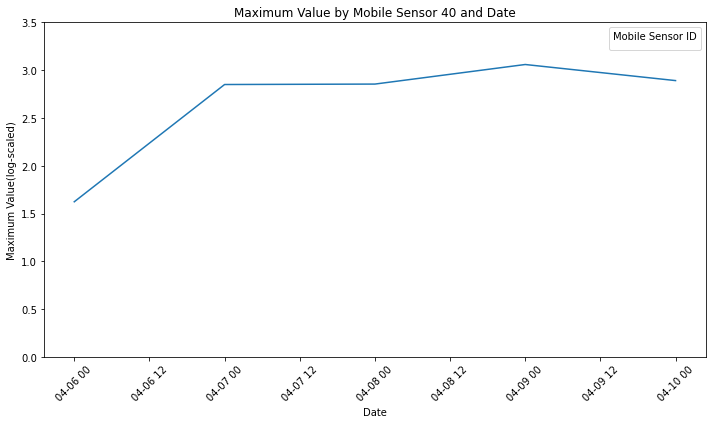

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


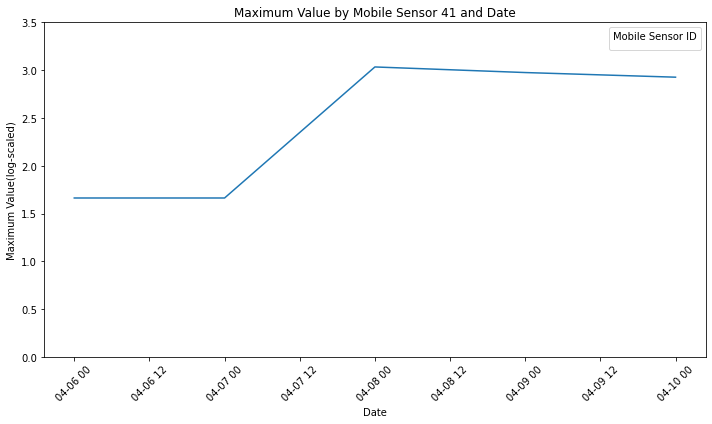

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


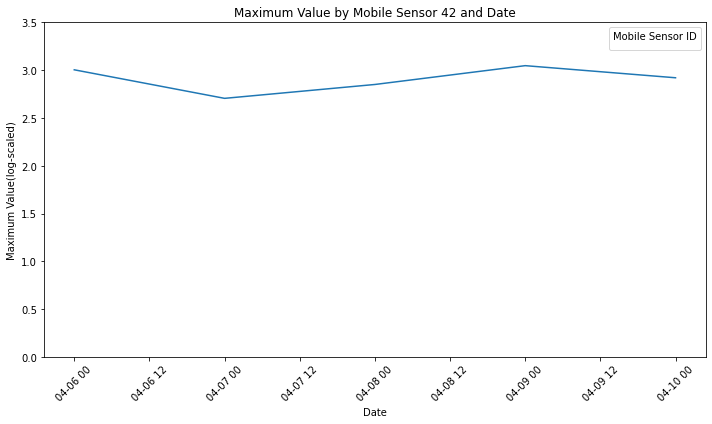

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


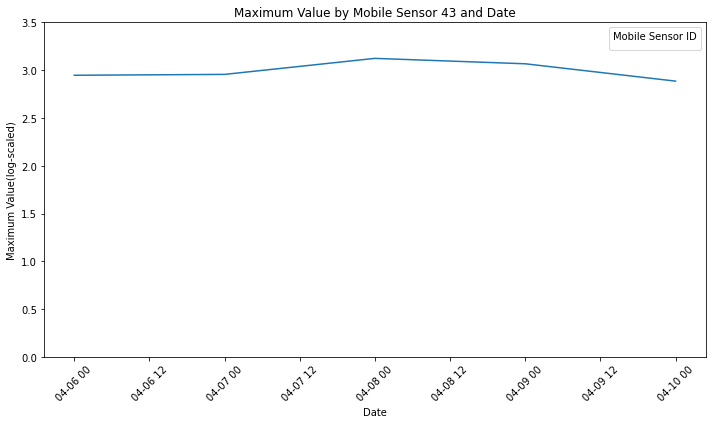

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


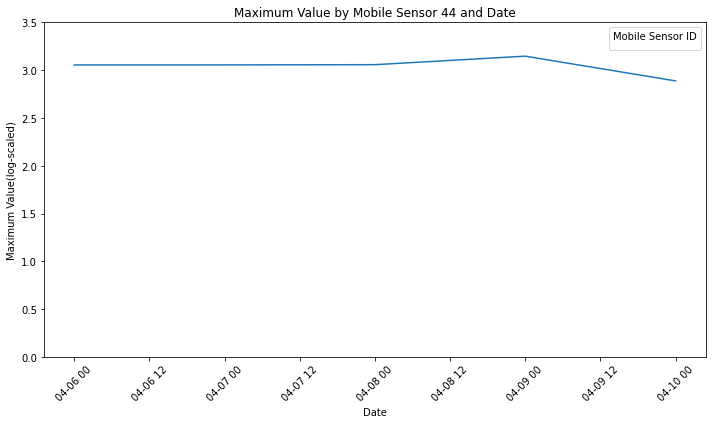

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


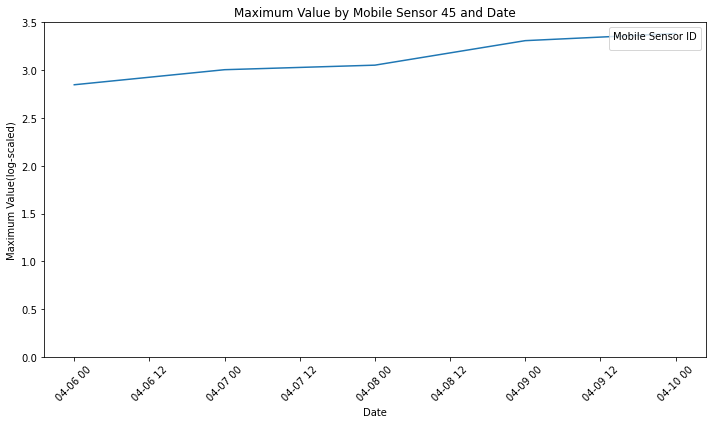

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


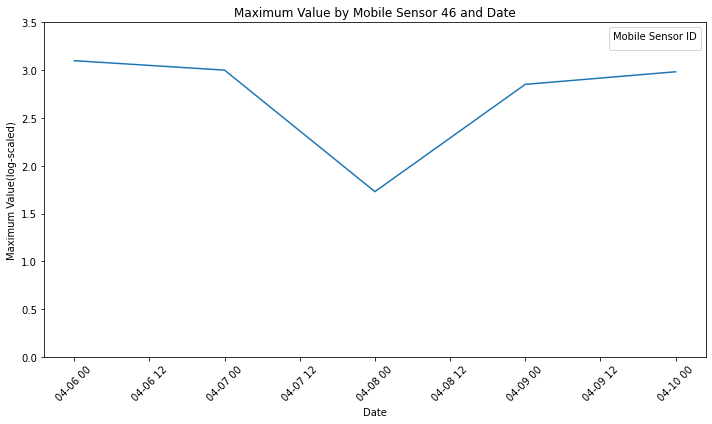

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


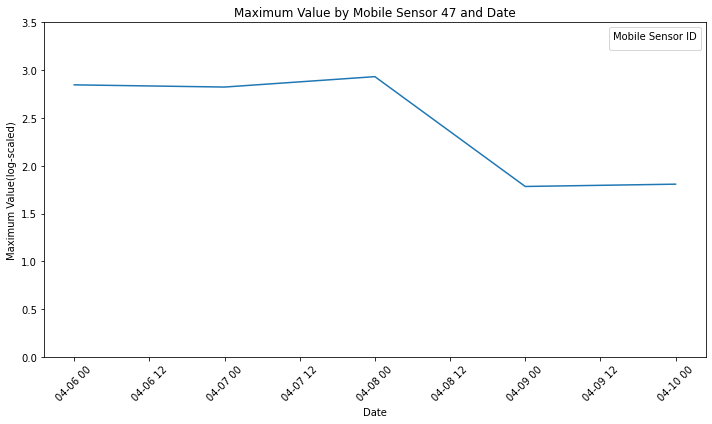

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


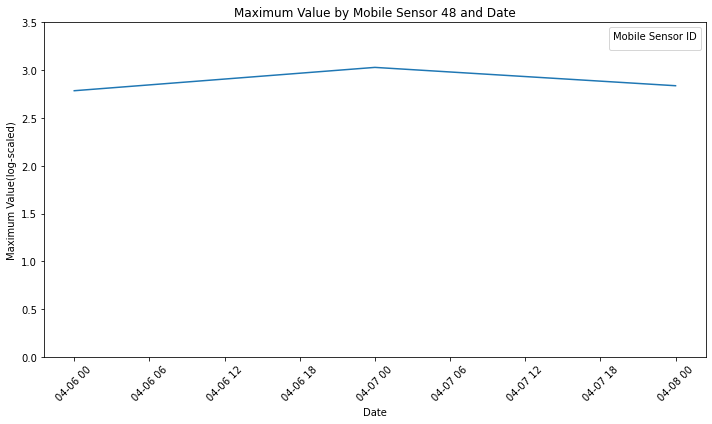

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


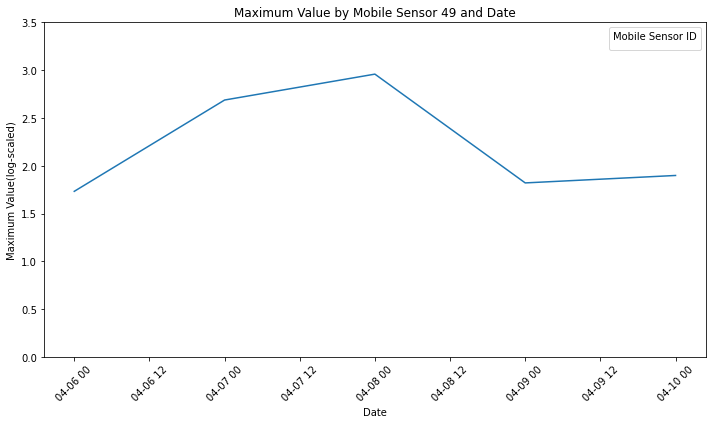

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


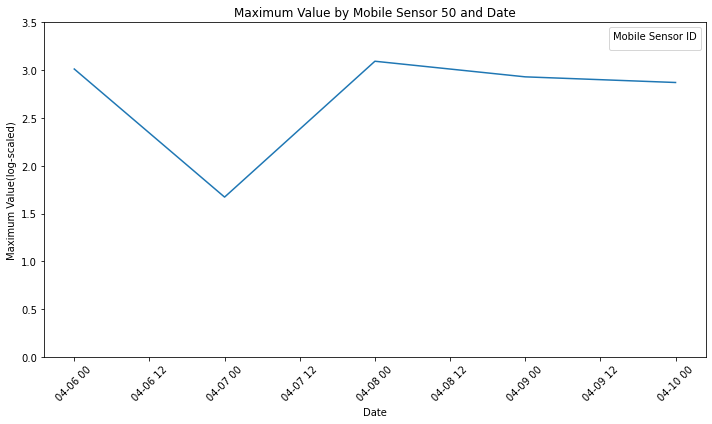

In [21]:
# Set the y-value threshold
y_threshold = 3.5

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # calculate the maximum value for each date
    max_values_by_date = sensor_data.groupby(sensor_data['Timestamp'].dt.date)['Value'].max()
    max_values_data = pd.DataFrame({'Date': max_values_by_date.index, 'Max_Value': max_values_by_date.values})
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=max_values_data, x='Date', y='Max_Value', ci=None)
    plt.xlabel('Date')
    plt.ylabel('Maximum Value(log-scaled)')
    plt.title(f'Maximum Value by Mobile Sensor {sensor_id} and Date')
    plt.xticks(rotation=45)
    plt.ylim(0, y_threshold)  # set y-axis limit to 3.5
    plt.tight_layout()
    plt.legend(title='Mobile Sensor ID', loc='upper right')
    plt.show()



### Combined plots (MAX by sensor and Date)

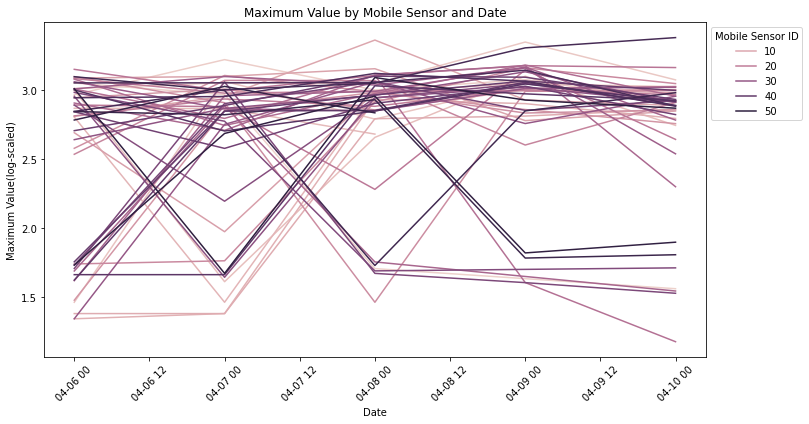

In [23]:
# Create a DataFrame to accumulate maximum value data for all sensors
max_values_accumulated = pd.DataFrame()

# Iterate through each mobile sensor ID and accumulate maximum value data
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # Calculate the maximum value for each date
    max_values_by_date = sensor_data.groupby(sensor_data['Timestamp'].dt.date)['Value'].max()
    max_values_data = pd.DataFrame({'Date': max_values_by_date.index, 'Max_Value': max_values_by_date.values})
    
    max_values_data['Sensor-id'] = sensor_id  # Add a column to identify the sensor
    
    max_values_accumulated = pd.concat([max_values_accumulated, max_values_data], ignore_index=True)

# Filter out the data points that exceed the threshold
max_values_accumulated = max_values_accumulated[max_values_accumulated['Max_Value'] <= 3.5]

# Create a single line plot using Seaborn for all mobile sensors
plt.figure(figsize=(10, 6))
sns.lineplot(data=max_values_accumulated, x='Date', y='Max_Value', hue='Sensor-id', ci=None)
plt.xlabel('Date')
plt.ylabel('Maximum Value(log-scaled)')
plt.title('Maximum Value by Mobile Sensor and Date')
plt.xticks(rotation=45)  # rotate the x-axis labels for readability
plt.tight_layout()

# Adjust the legend position
plt.legend(title='Mobile Sensor ID', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


In [78]:
# Calculate the number of data points for each sensor
#sensor_counts = max_values_accumulated['Sensor-id'].value_counts()

# Calculate the number of data points with values greater than 2.5 for each sensor
#sensor_high_value_counts = max_values_accumulated[max_values_accumulated['Max_Value'] > 2.5]['Sensor-id'].value_counts()

# Calculate the ratio of high value counts to total counts for each sensor
#sensor_high_value_ratio = sensor_high_value_counts / sensor_counts

# Filter out sensors with a majority of high value points
#sensors_with_majority_high_values = sensor_high_value_ratio[sensor_high_value_ratio > 0.5]

#print("Sensor IDs with a majority of points greater than 2.5:")
#print(sensors_with_majority_high_values.index.tolist())


Sensor IDs with a majority of points greater than 2.5:
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50]


#  Mobile Sensors Timeseries Plot of HOURS against AVERAGE Radiation Value

#### We choose hours to account for sudden changes in radiation value no observable when exploring radiation levels by day

### Individual plots (AVG by sensor and Hours)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


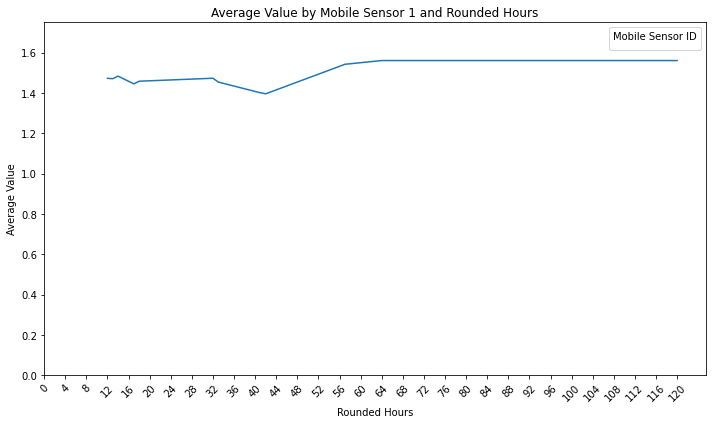

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


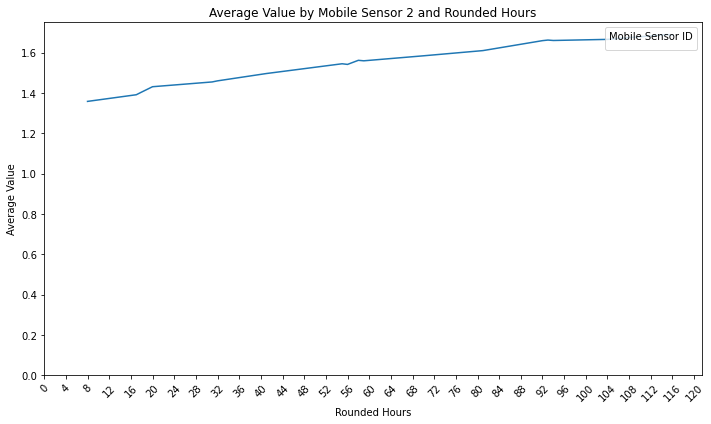

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


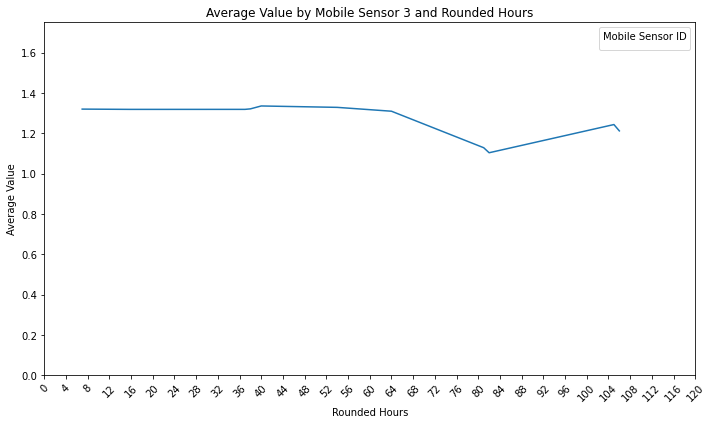

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


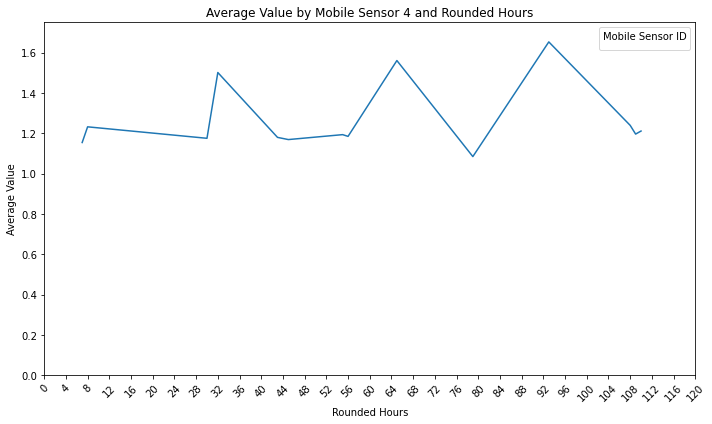

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


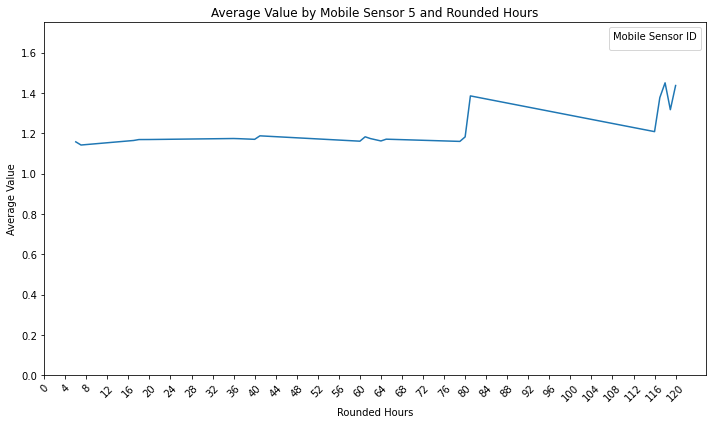

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


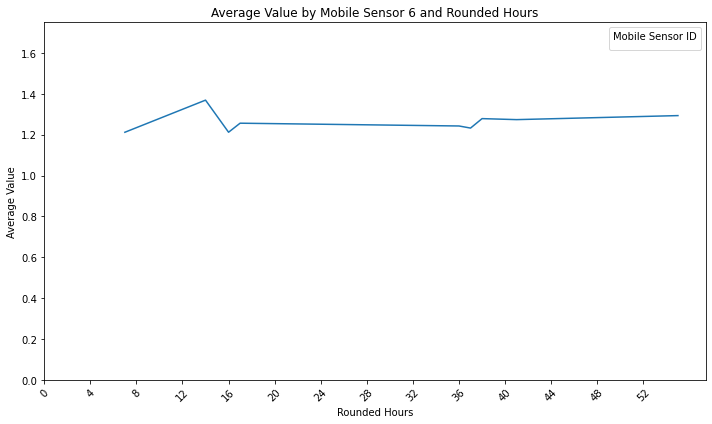

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


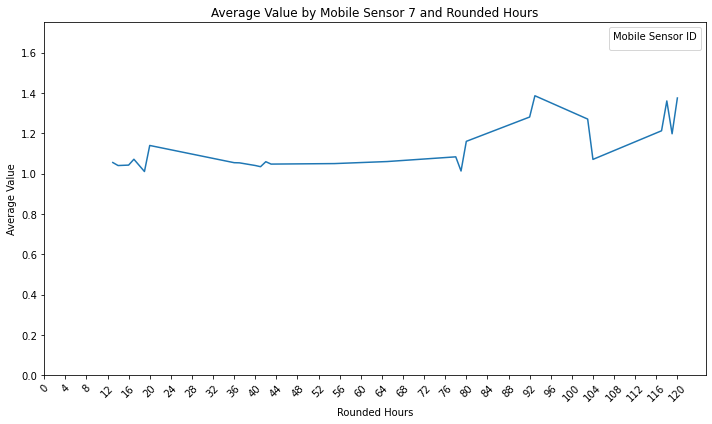

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


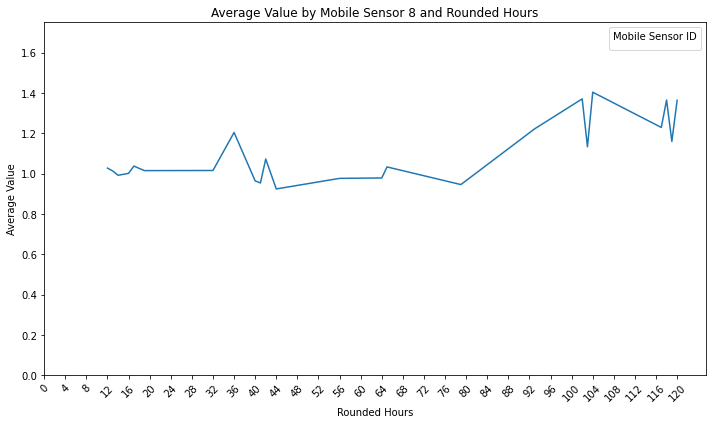

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


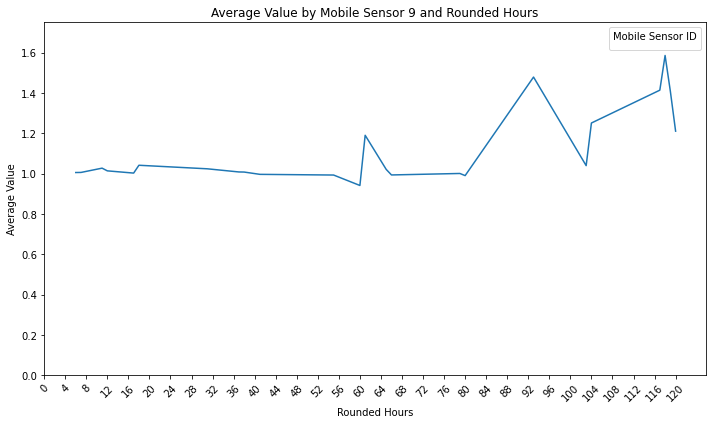

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


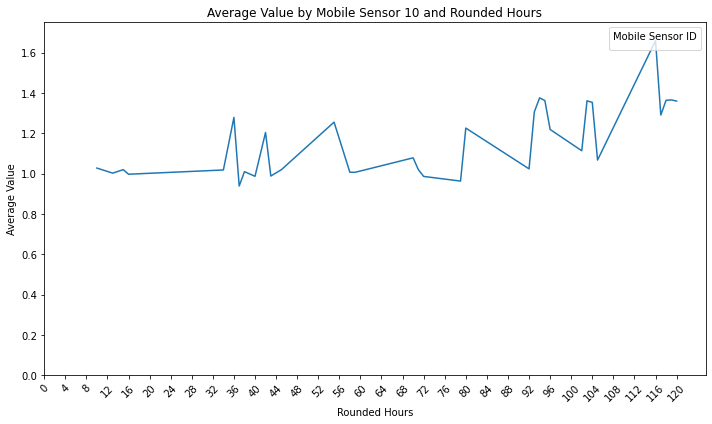

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


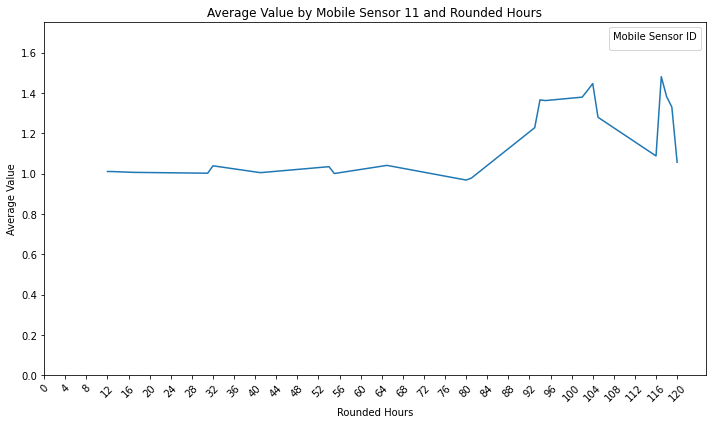

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


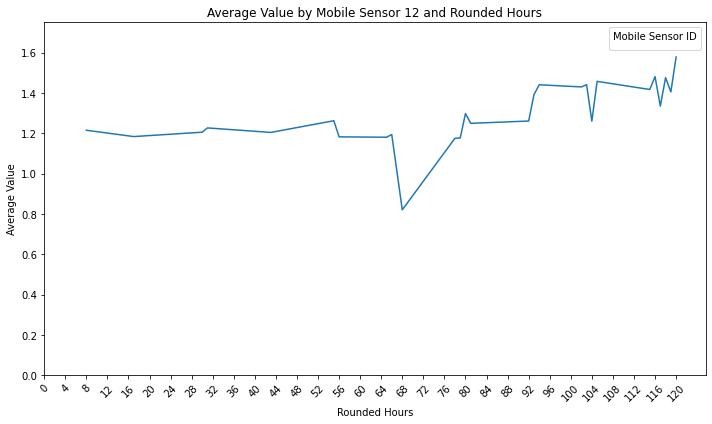

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


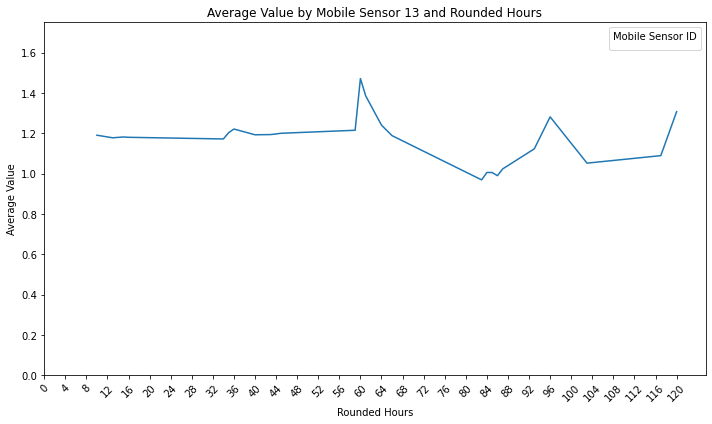

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


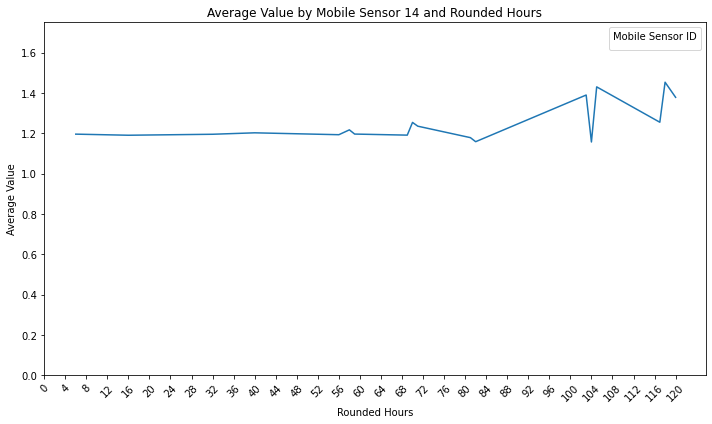

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


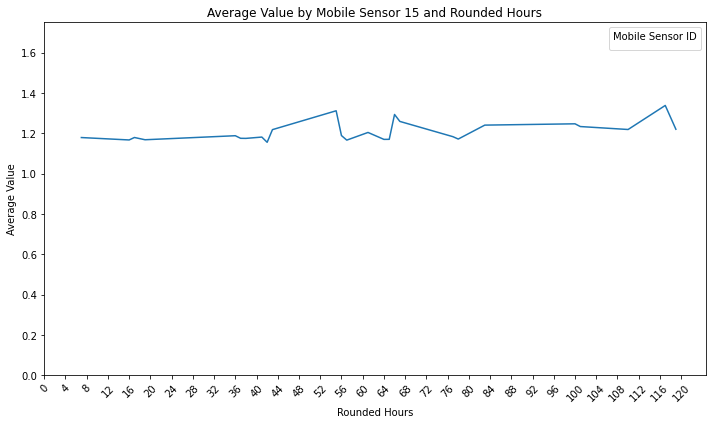

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


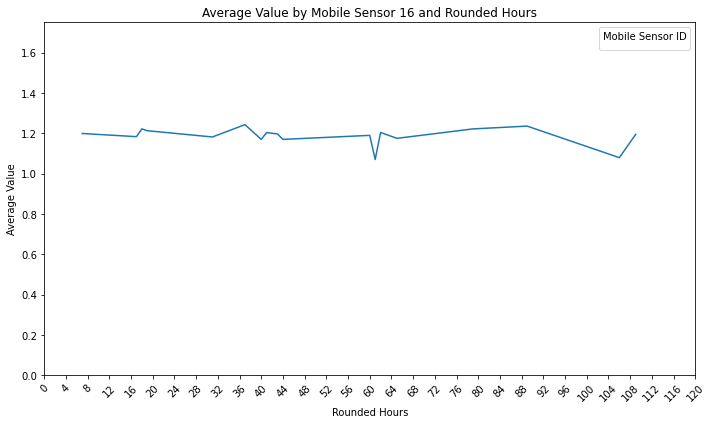

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


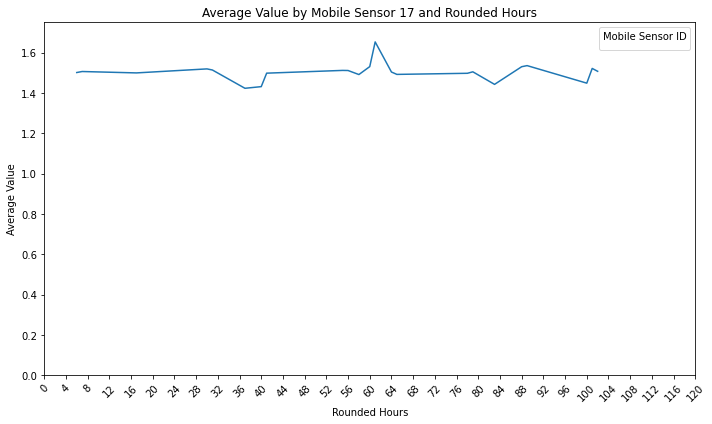

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


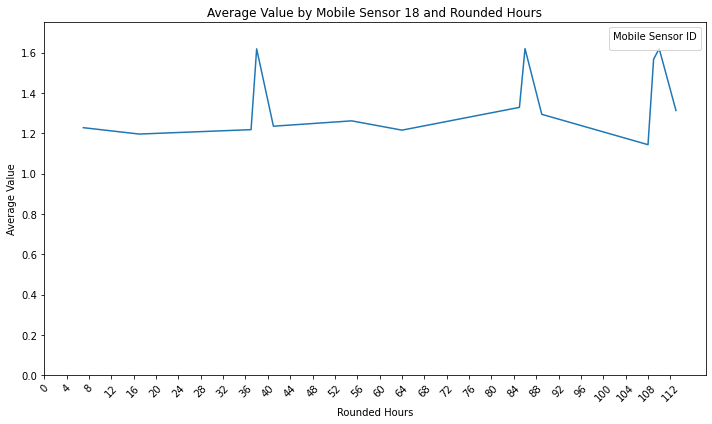

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


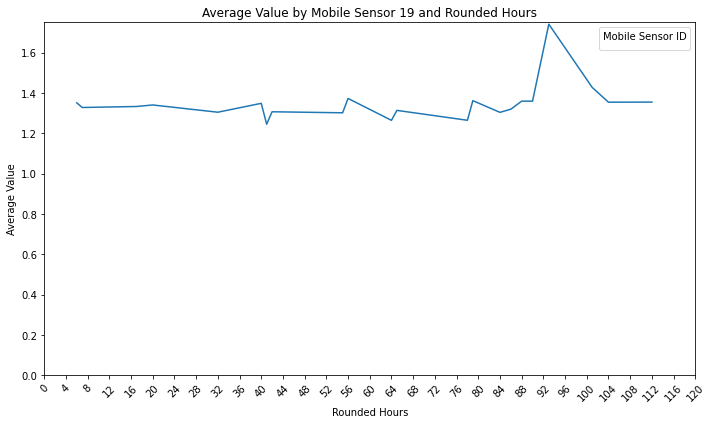

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


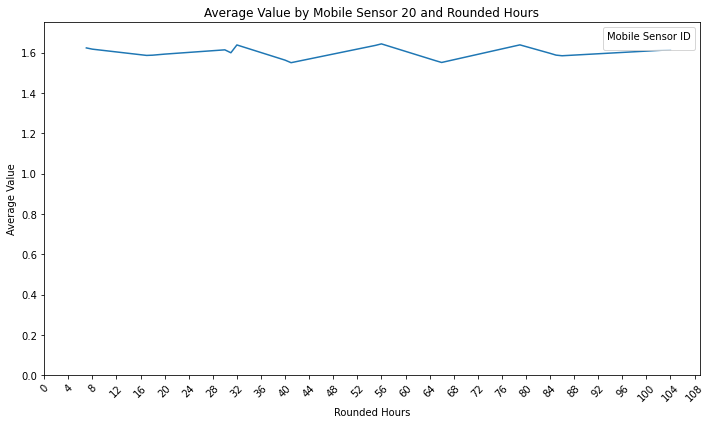

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


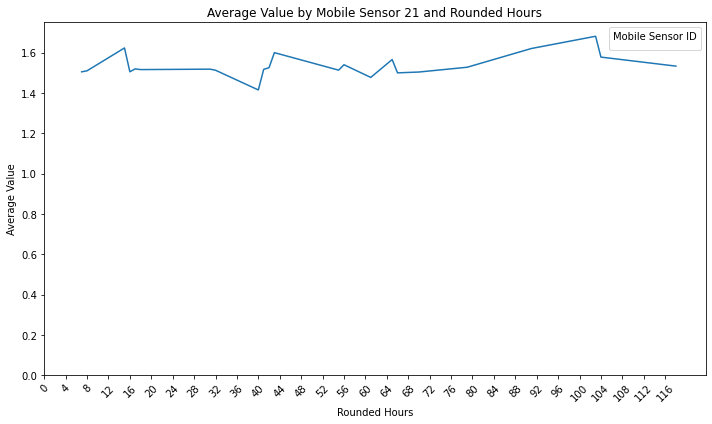

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


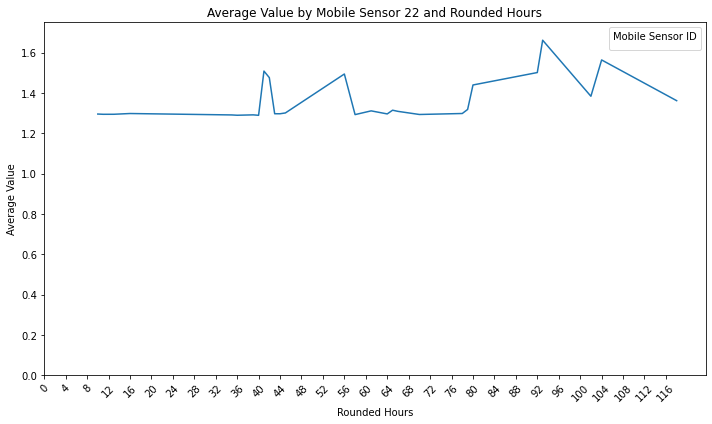

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


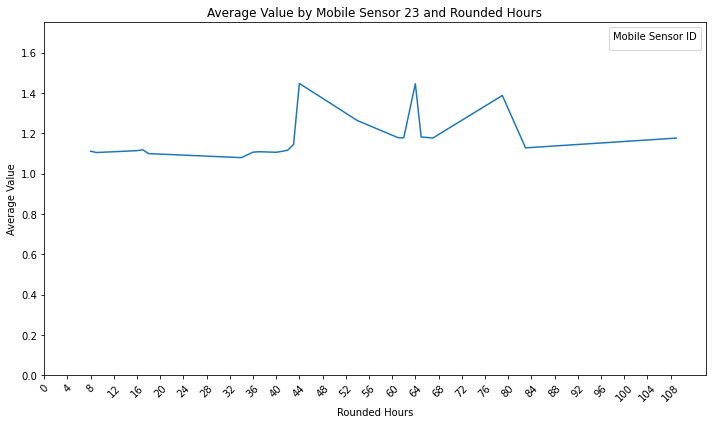

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


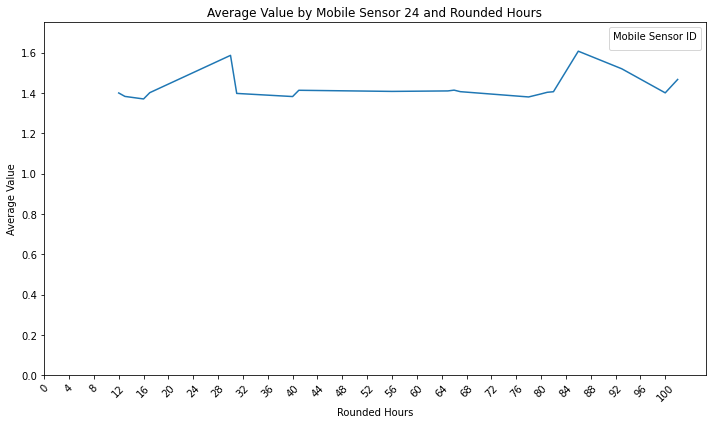

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


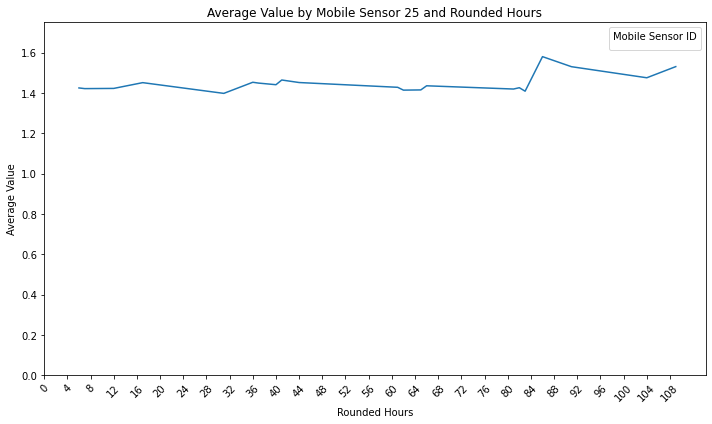

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


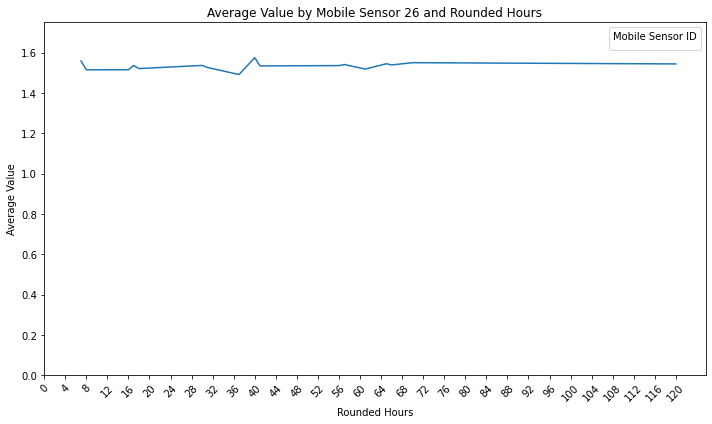

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


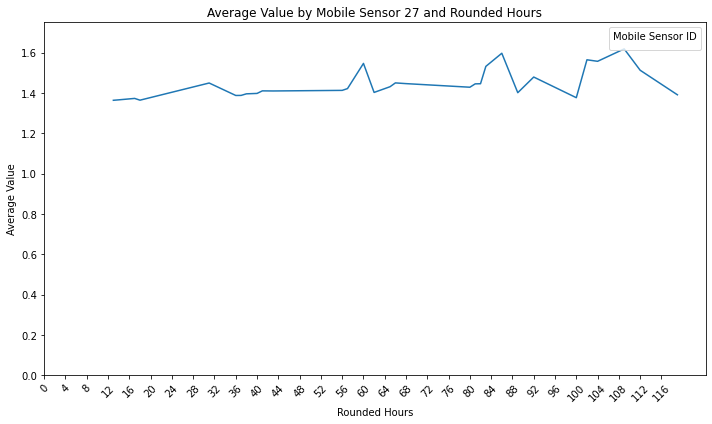

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


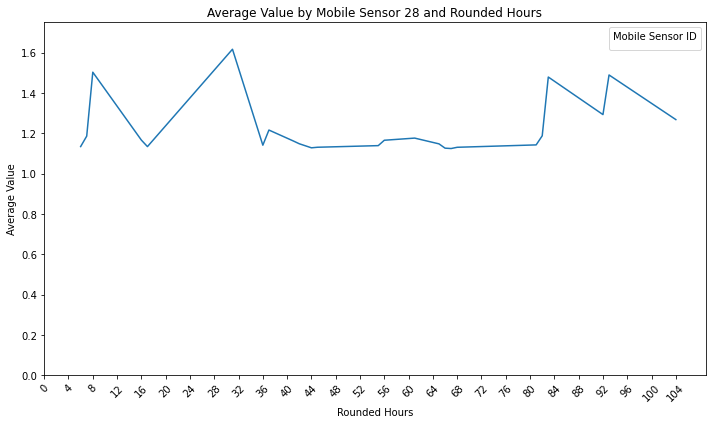

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


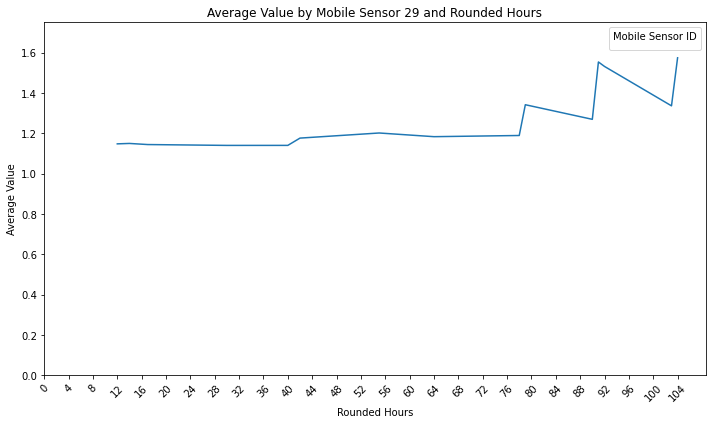

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


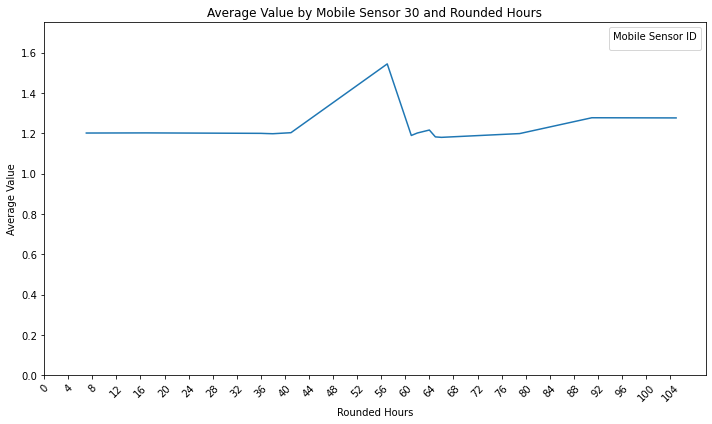

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


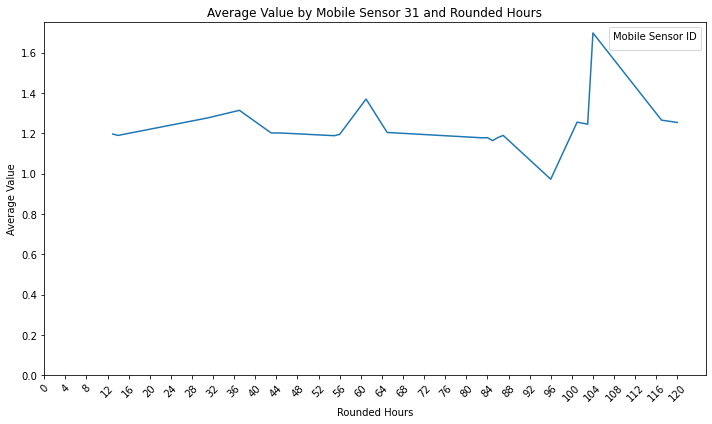

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


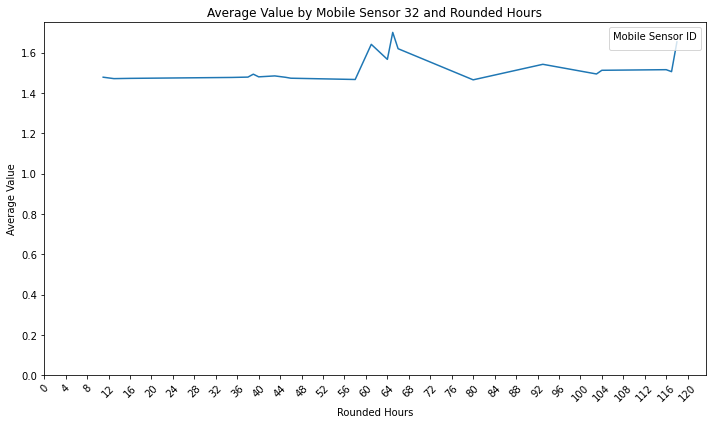

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


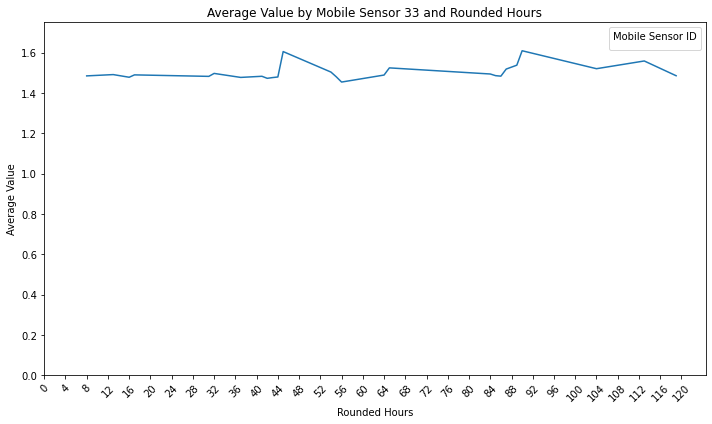

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


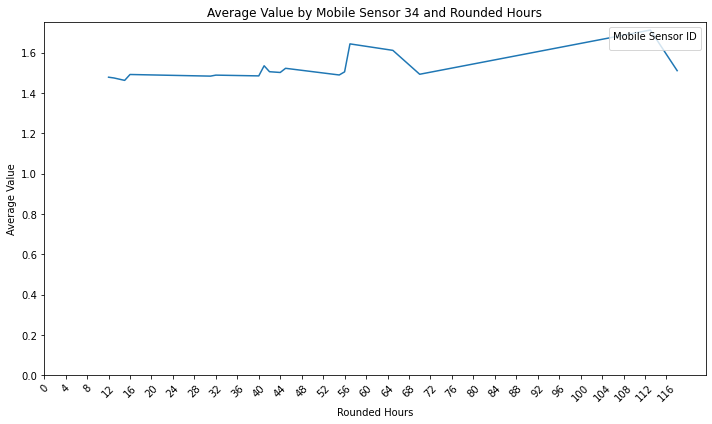

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


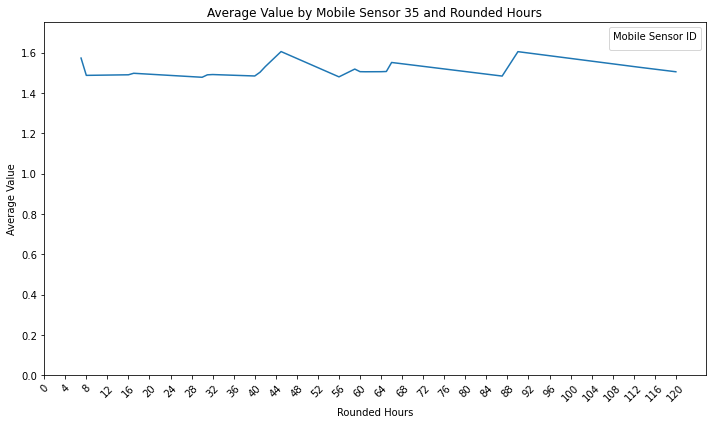

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


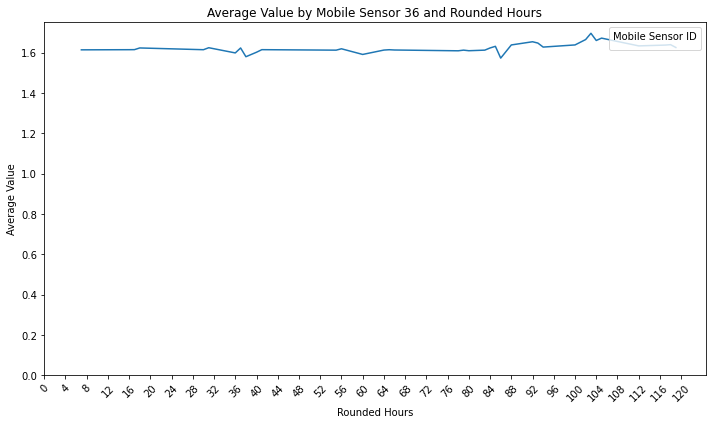

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


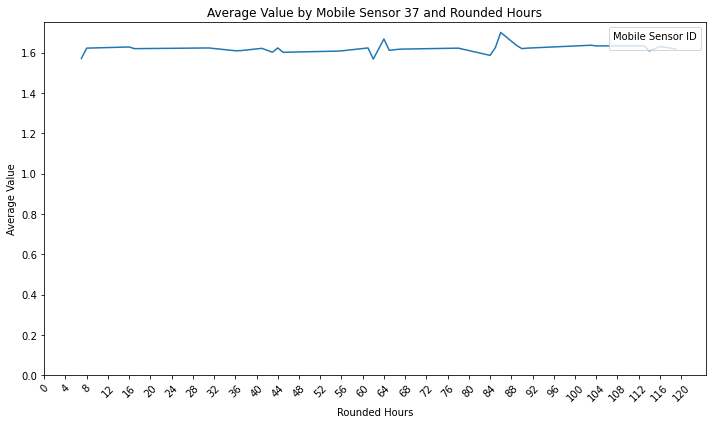

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


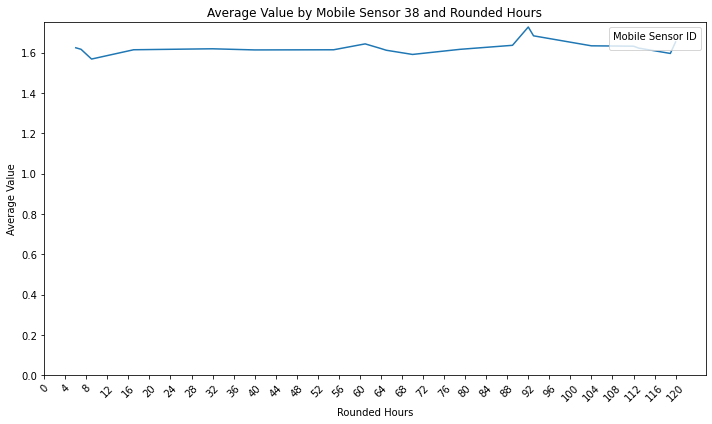

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


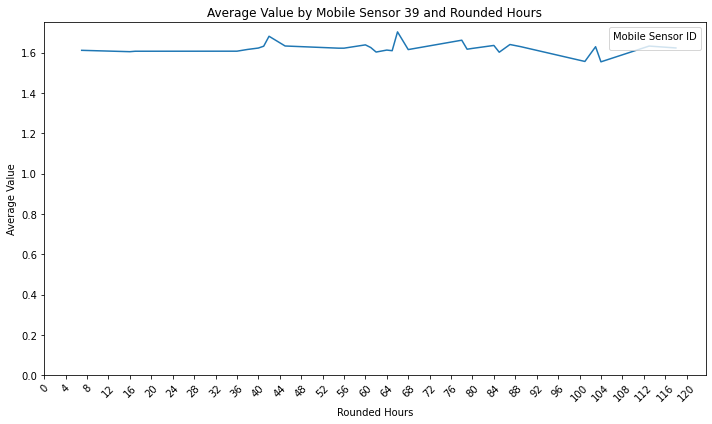

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


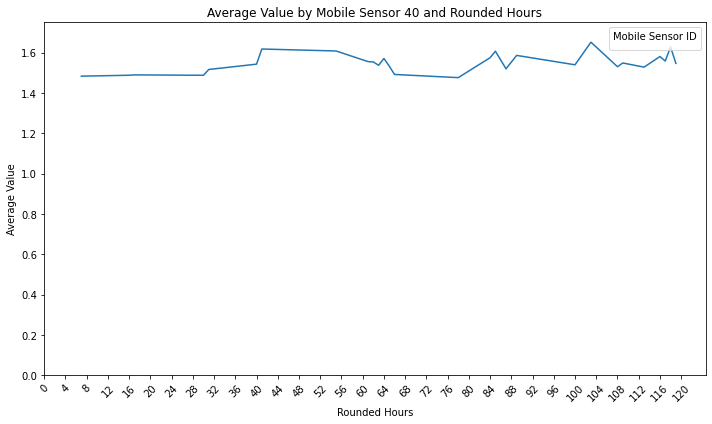

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


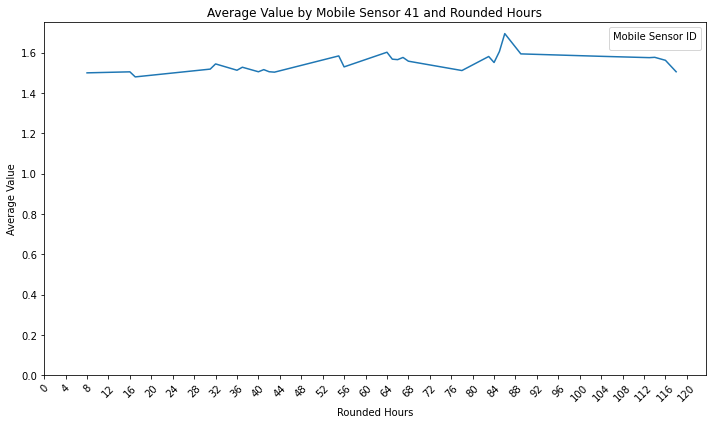

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


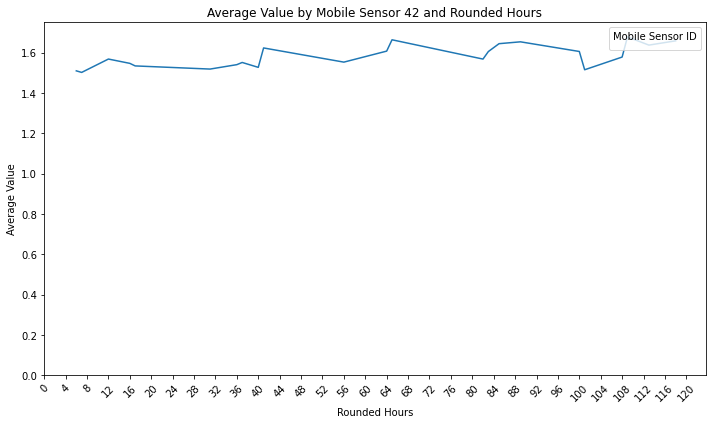

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


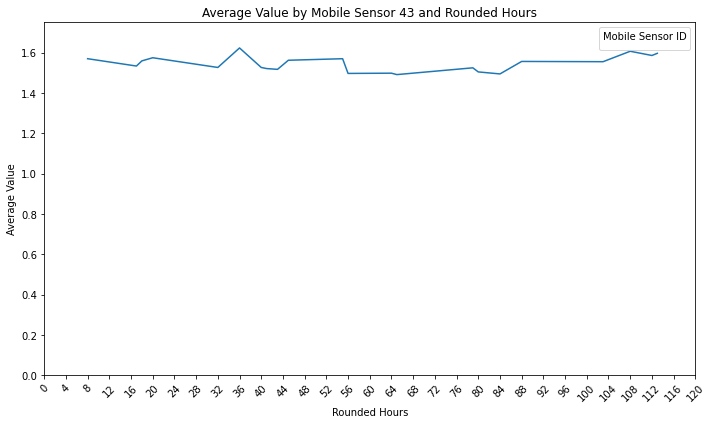

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


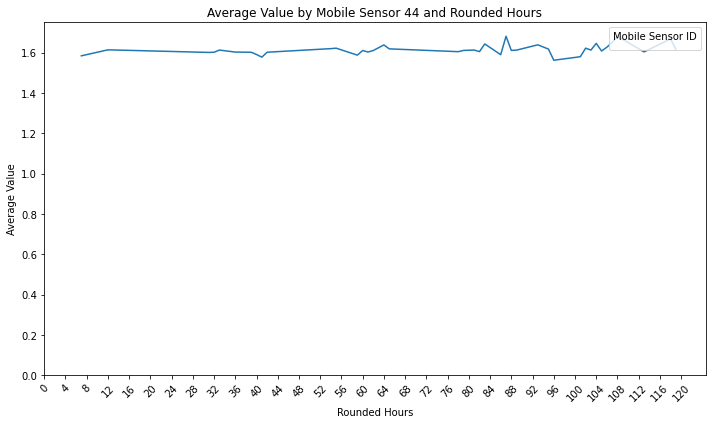

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


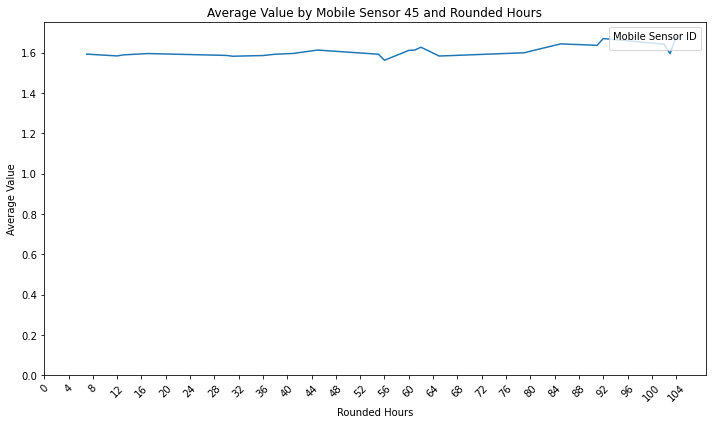

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


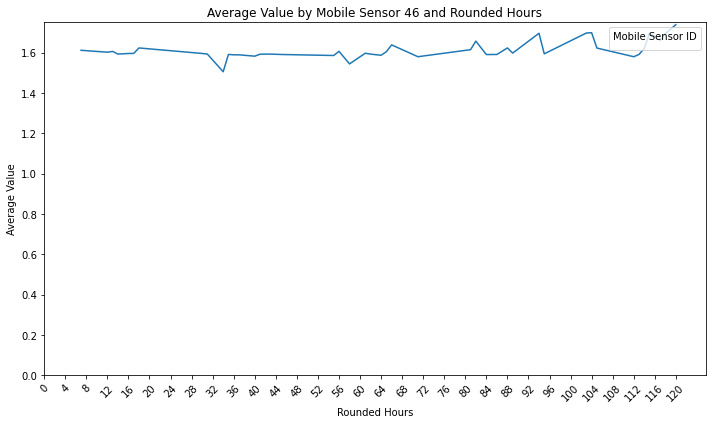

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


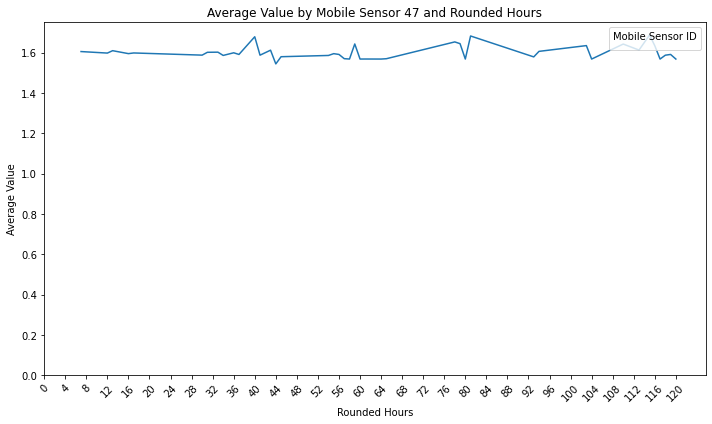

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


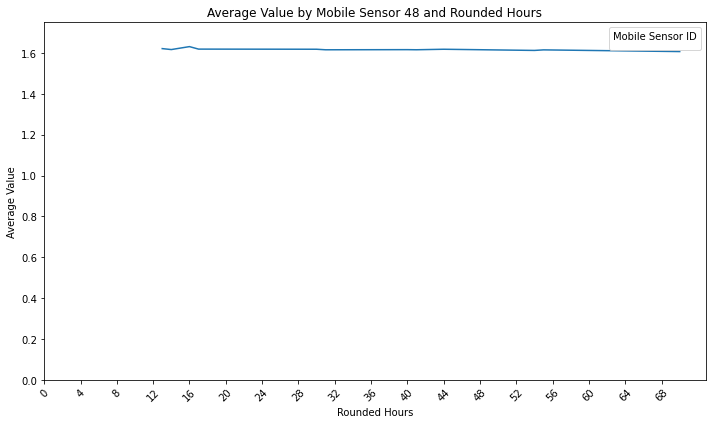

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


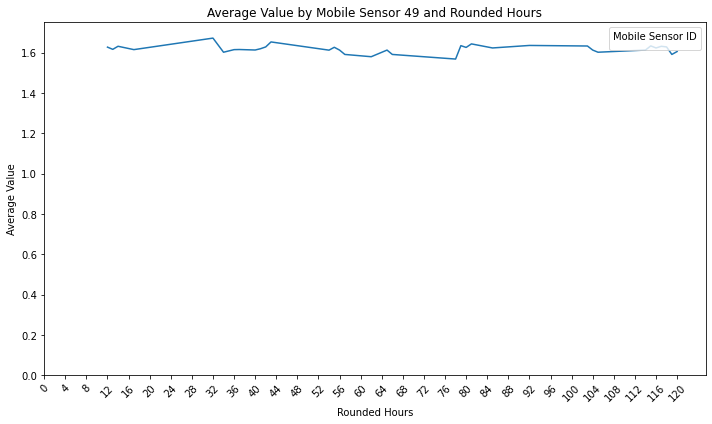

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


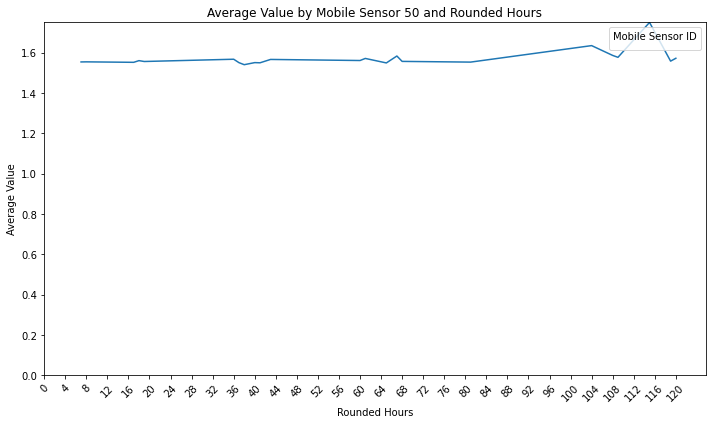

In [28]:
# Calculate the number of hours since the start of the data collection
mobile_df['Hours_since_start'] = (mobile_df['Timestamp'] - mobile_df['Timestamp'].min()).dt.total_seconds() / 3600

# Round the 'Hours_since_start' to the nearest hour
mobile_df['Rounded_Hours'] = mobile_df['Hours_since_start'].round()

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # apply the threshold filter on y-values
    threshold = 1.75
    filtered_data = sensor_data[sensor_data['Value'] <= threshold]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=filtered_data, x='Rounded_Hours', y='Value', estimator='mean', ci=None)
    plt.xlabel('Rounded Hours')
    plt.ylabel('Average Value')
    plt.title(f'Average Value by Mobile Sensor {sensor_id} and Rounded Hours')
    plt.ylim(0, 1.75)
    # adjust x-axis ticks for every 4 hours with rotation
    plt.xticks(np.arange(0, int(sensor_data['Rounded_Hours'].max()) + 1, step=4), rotation=45)  
    plt.tight_layout()
    plt.legend(title='Mobile Sensor ID', loc='upper right')
    plt.show()


### Combined plots (AVG by sensor and Hours)

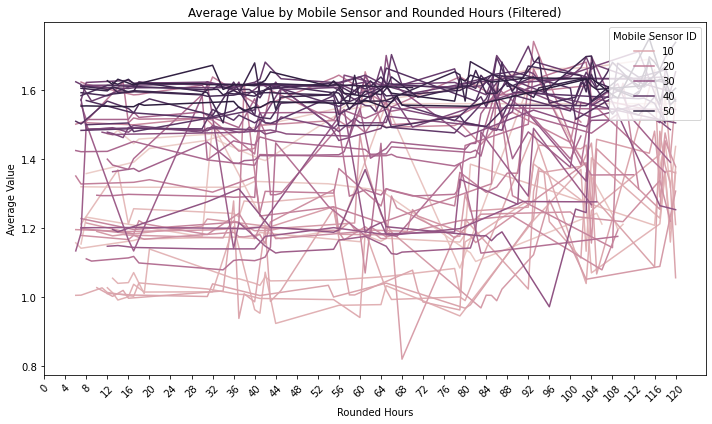

In [29]:
# Set the threshold value to identify spikes
threshold = 1.75  # adjust this threshold based on your data characteristics

# Filter out the data points that exceed the threshold
filtered_mobile_df = mobile_df[mobile_df['Value'] <= threshold]

# Create a line plot using Seaborn for mobile sensors with filtered data
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_mobile_df, x='Rounded_Hours', y='Value', hue='Sensor-id', estimator='mean', ci=None)
plt.xlabel('Rounded Hours')
plt.ylabel('Average Value')
plt.title('Average Value by Mobile Sensor and Rounded Hours (Filtered)')
# Adjust x-axis ticks for every 4 hours with rotation
plt.xticks(np.arange(0, int(filtered_mobile_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  
plt.tight_layout()
plt.legend(title='Mobile Sensor ID', loc='upper right')
plt.show()


#  Mobile Sensors Timeseries Plot of HOURS against MAXIMUM Radiation Value

### Individual plots (MAX by sensor and Hours)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


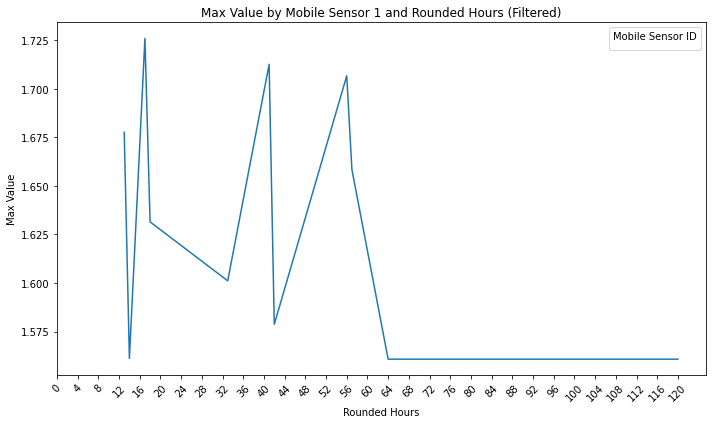

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


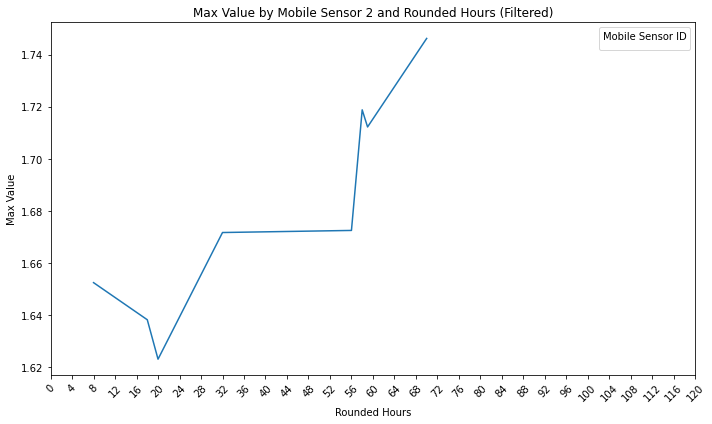

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


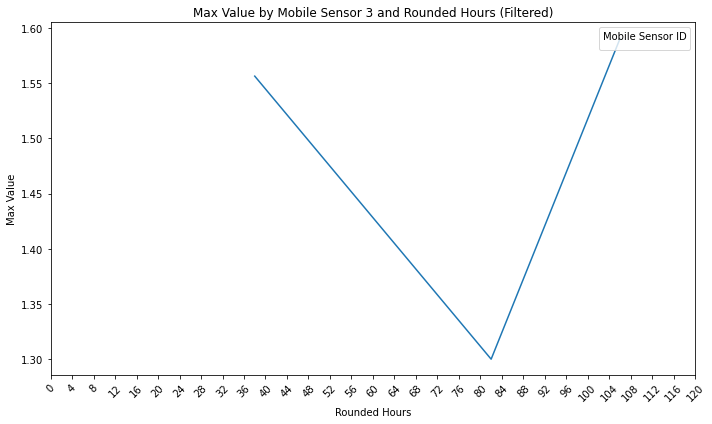

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


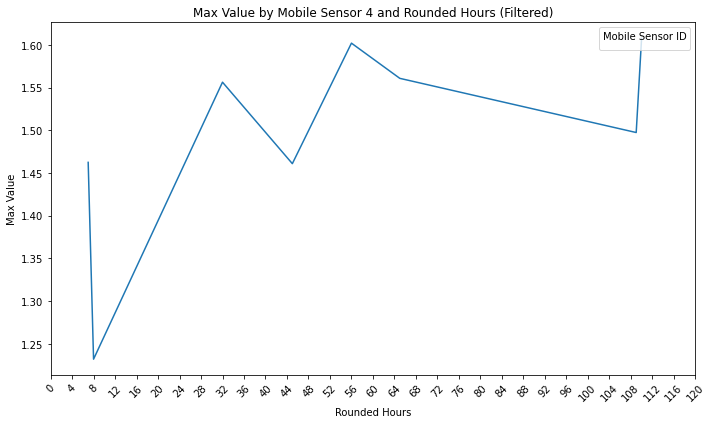

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


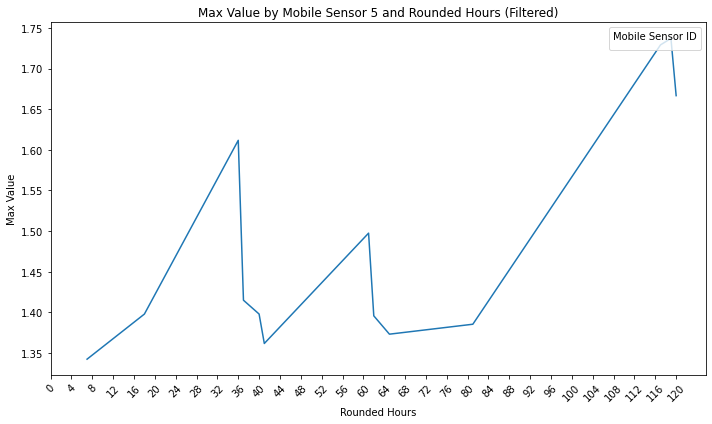

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


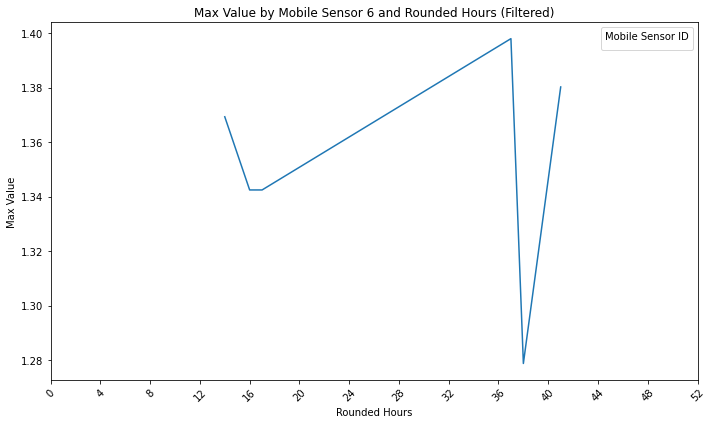

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


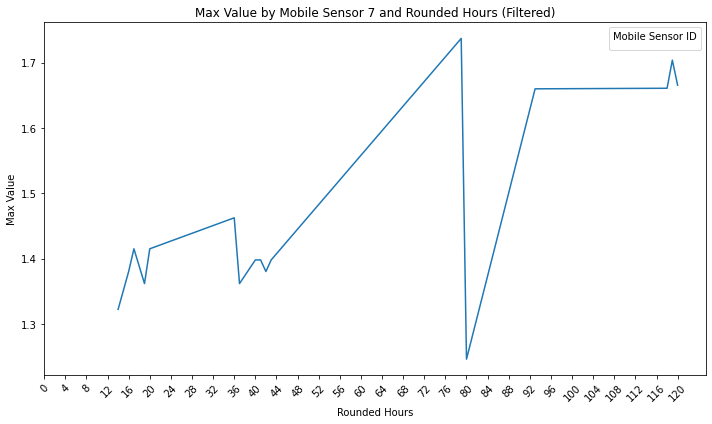

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


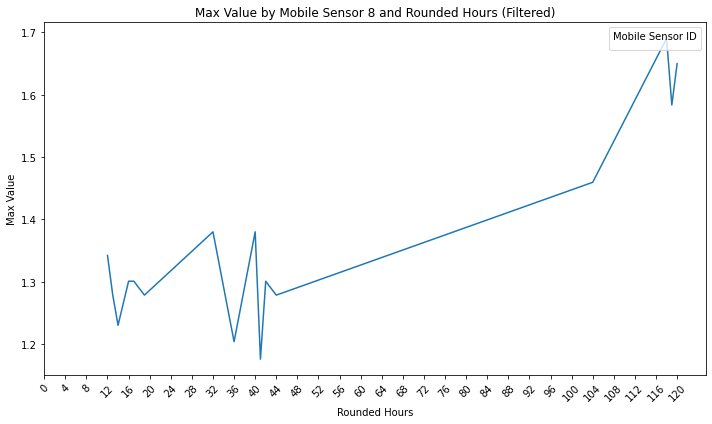

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


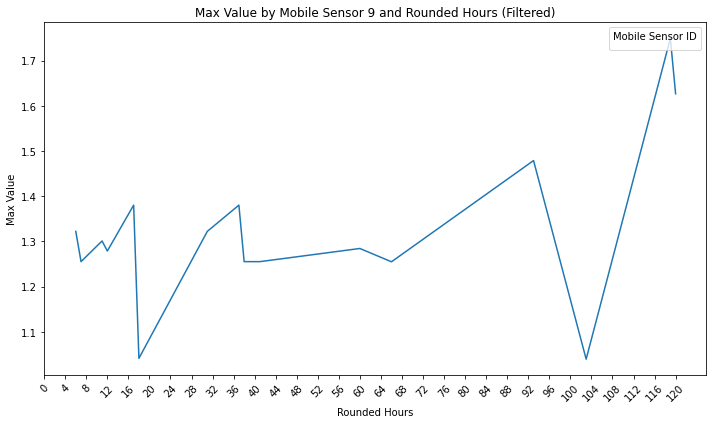

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


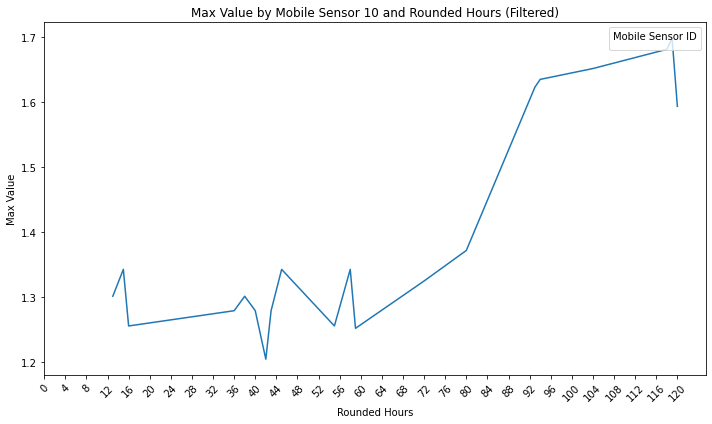

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


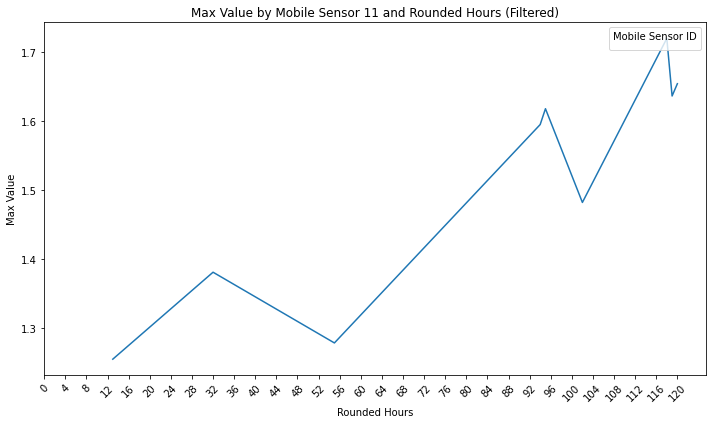

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


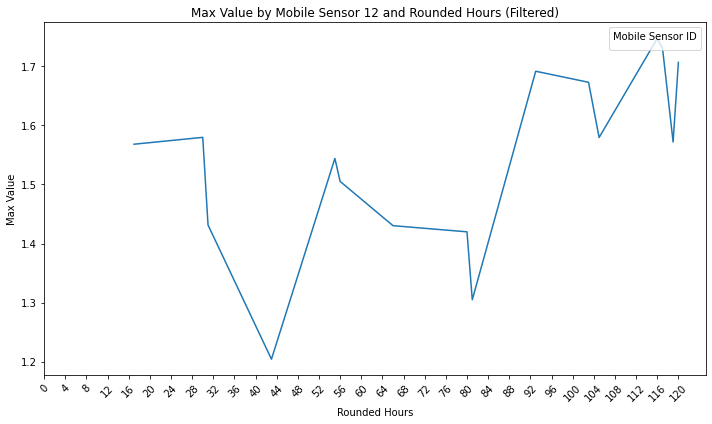

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


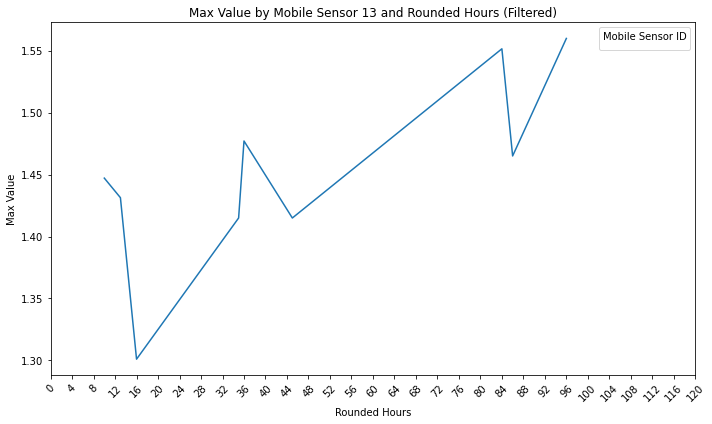

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


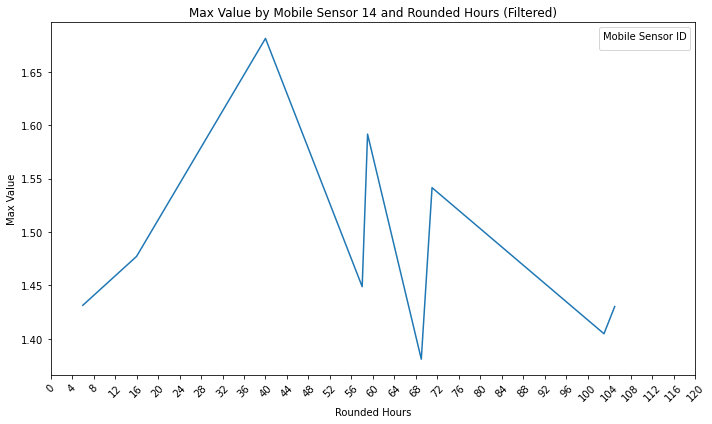

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


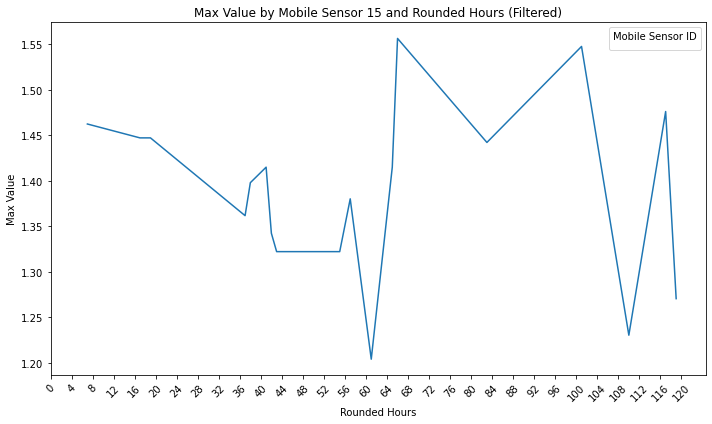

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


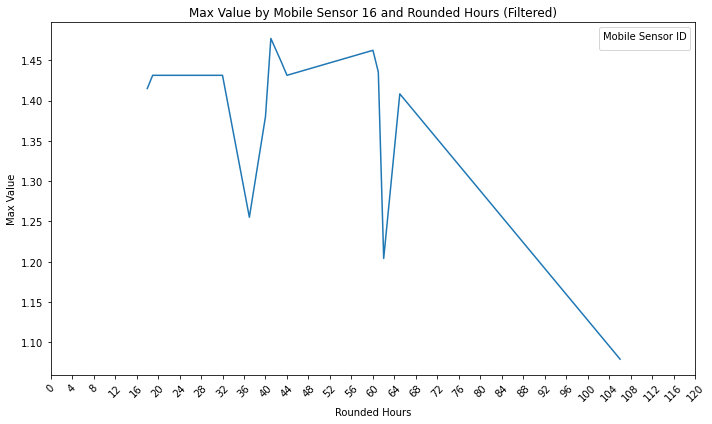

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


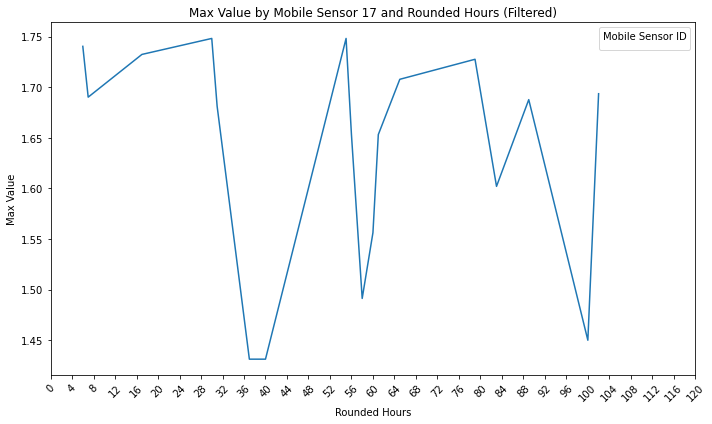

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


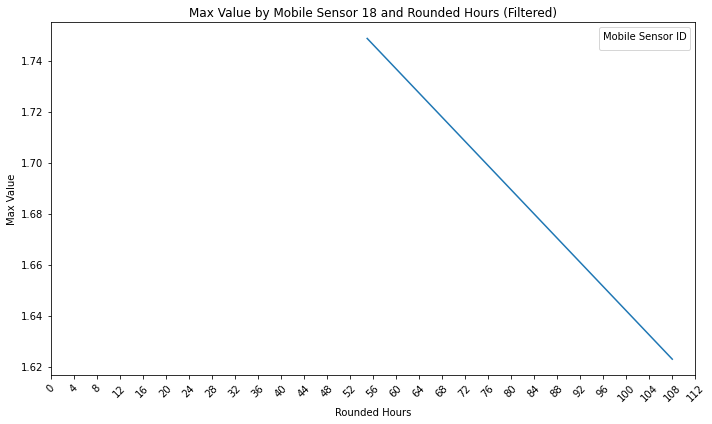

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


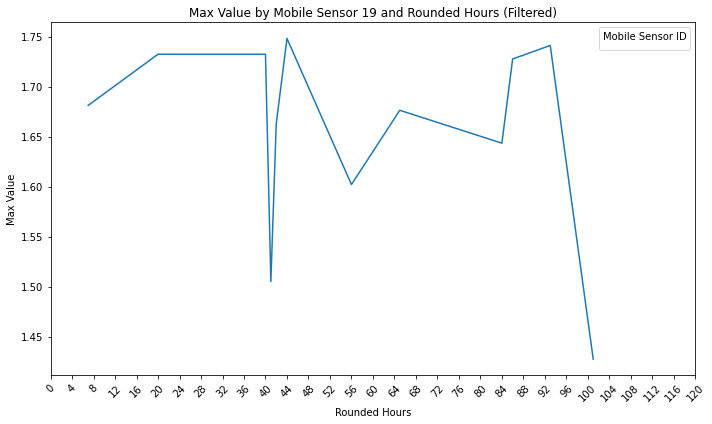

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


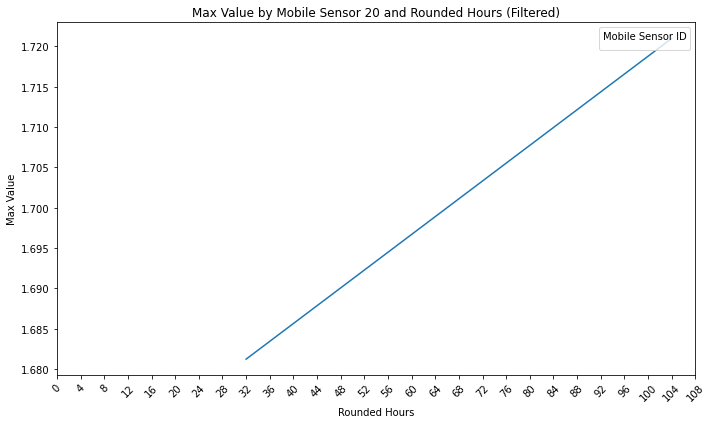

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


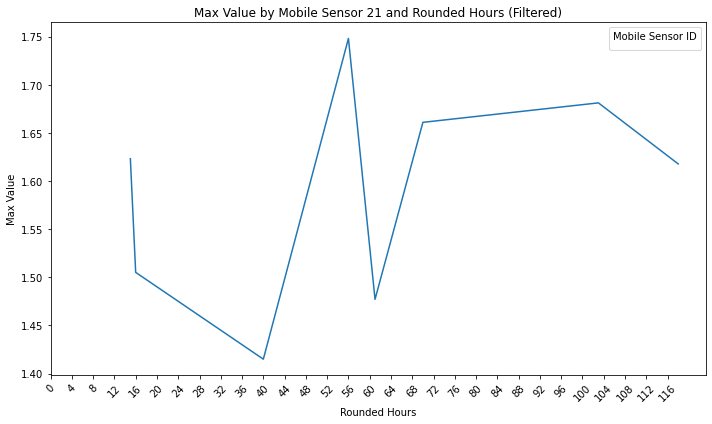

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


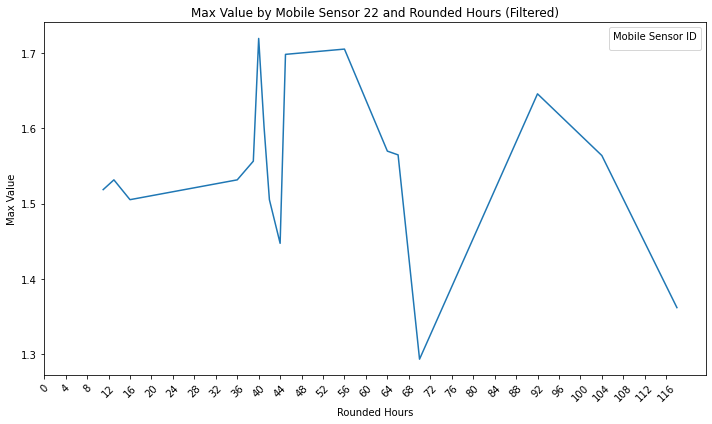

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


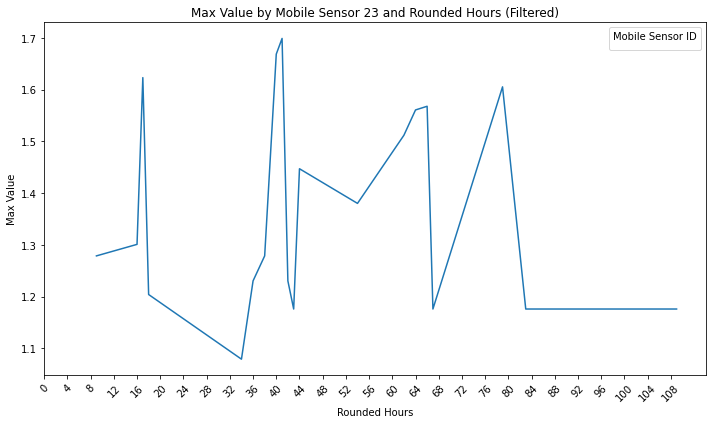

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


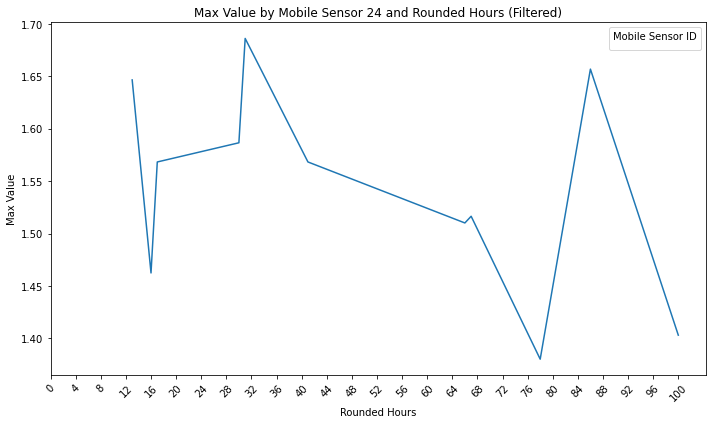

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


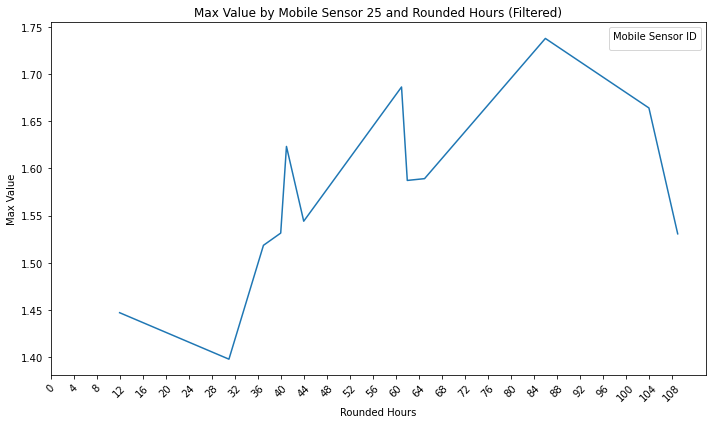

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


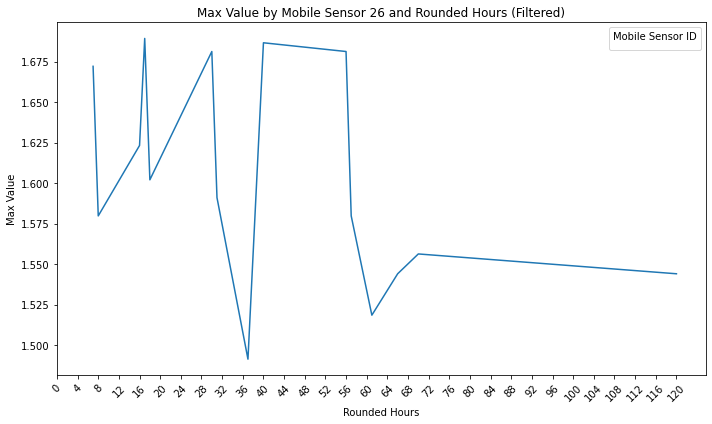

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


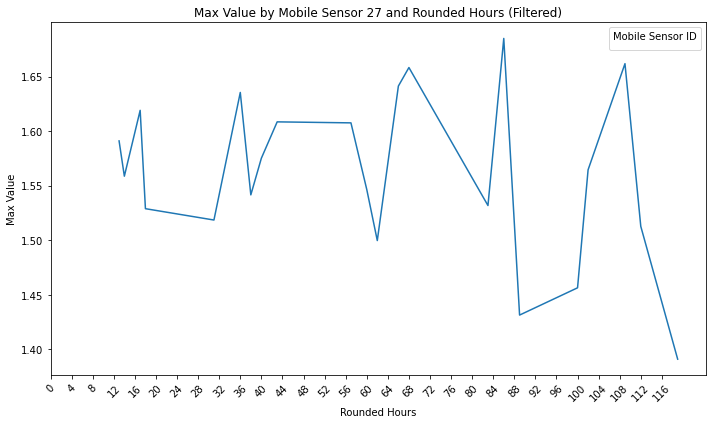

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


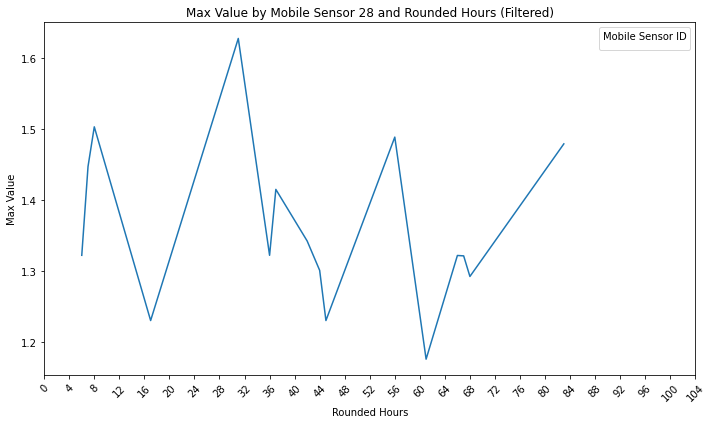

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


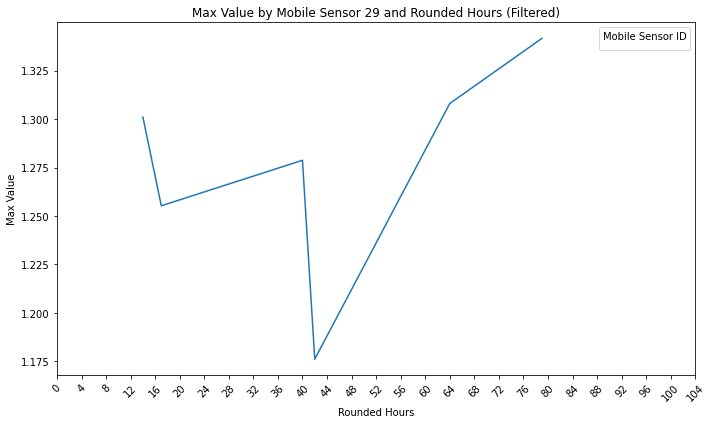

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


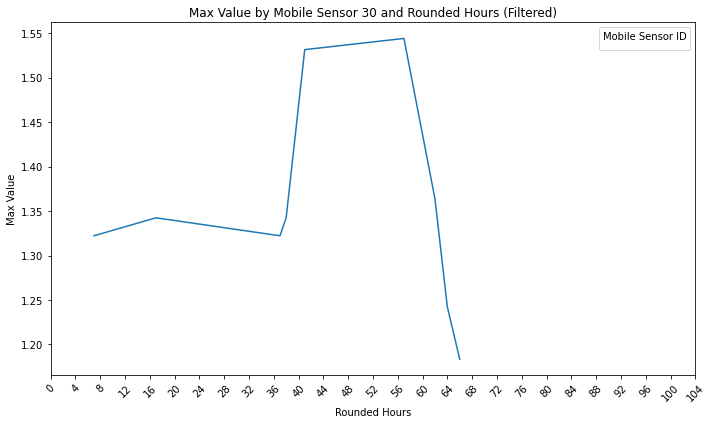

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


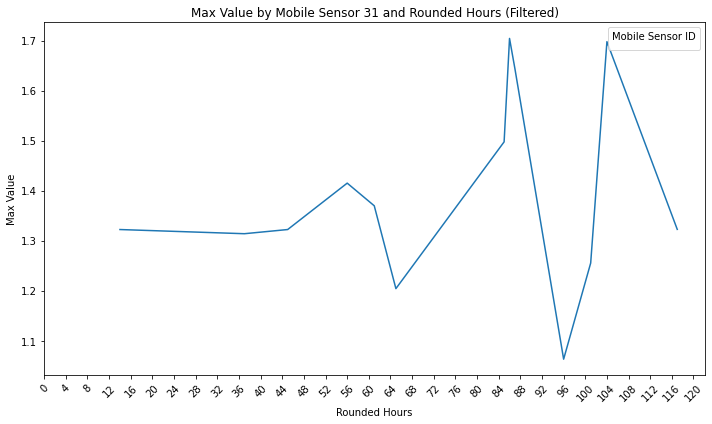

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


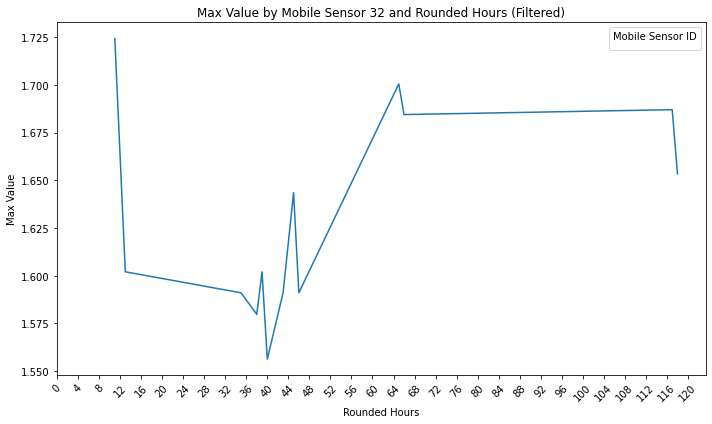

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


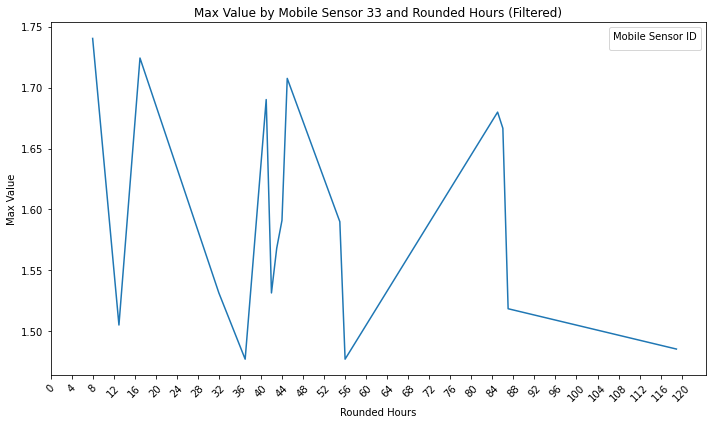

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


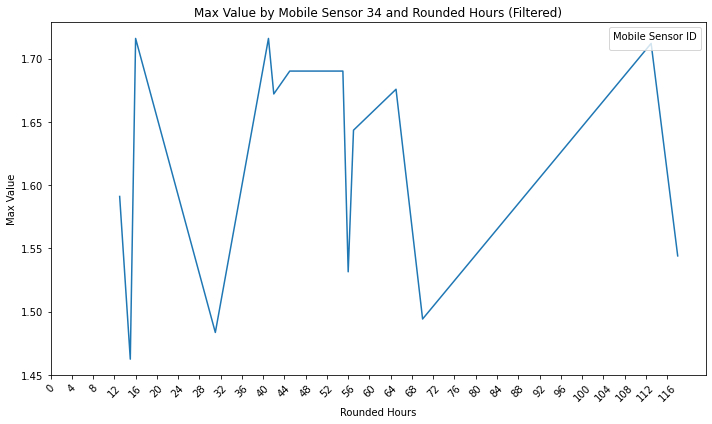

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


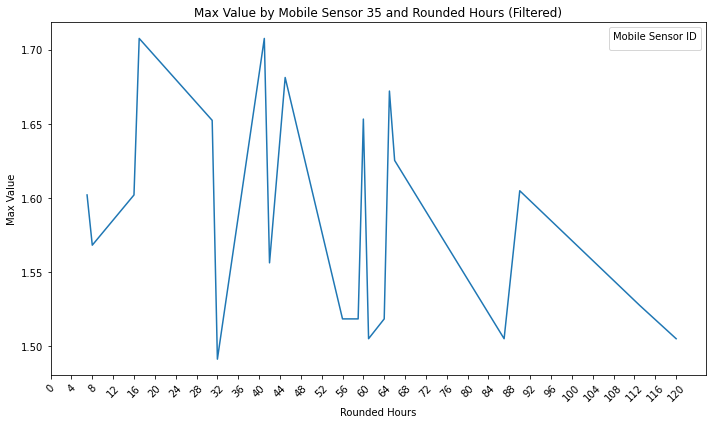

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


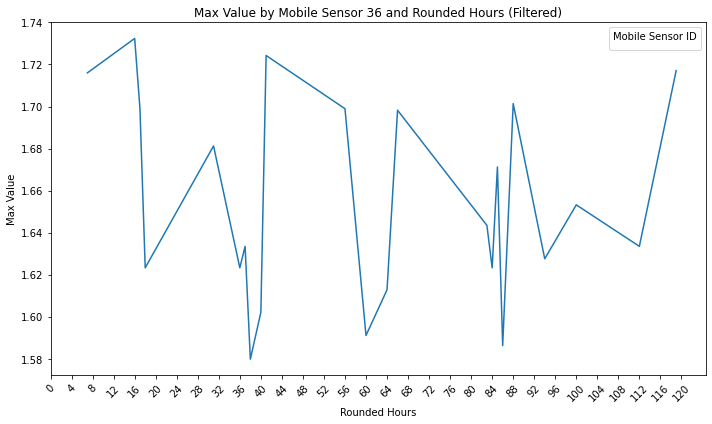

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


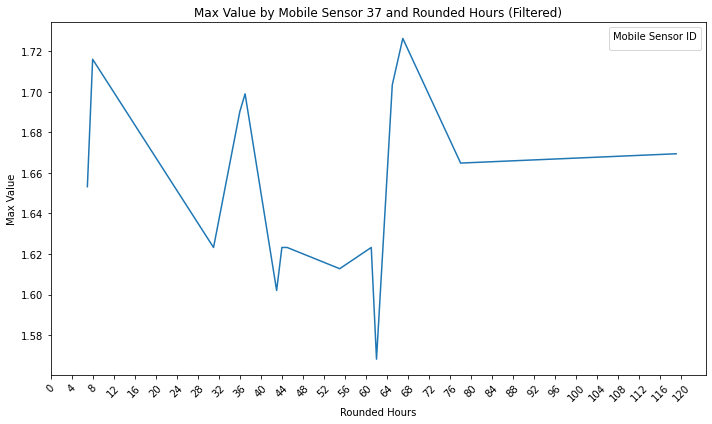

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


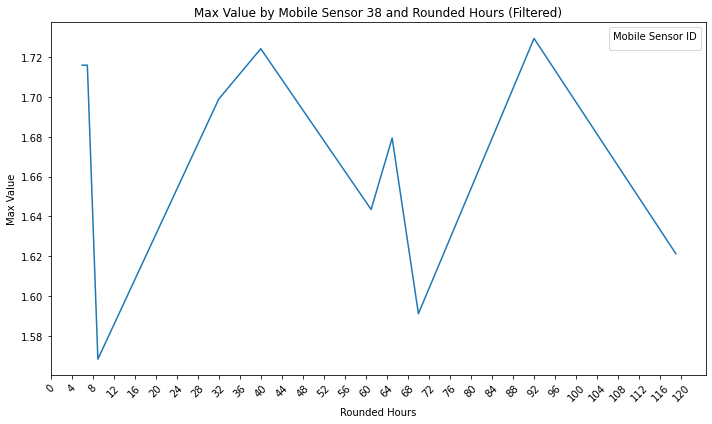

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


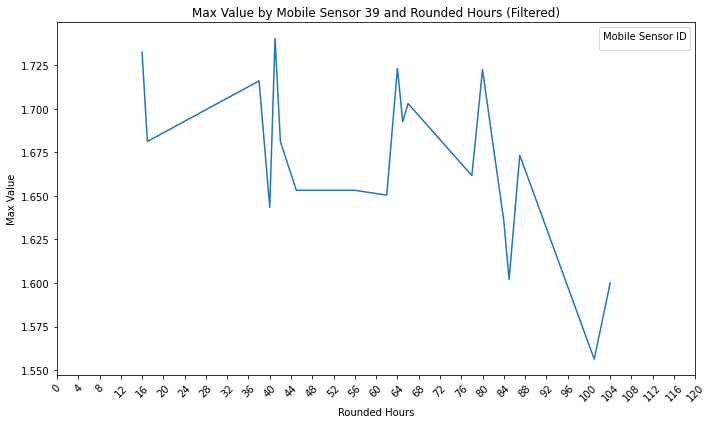

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


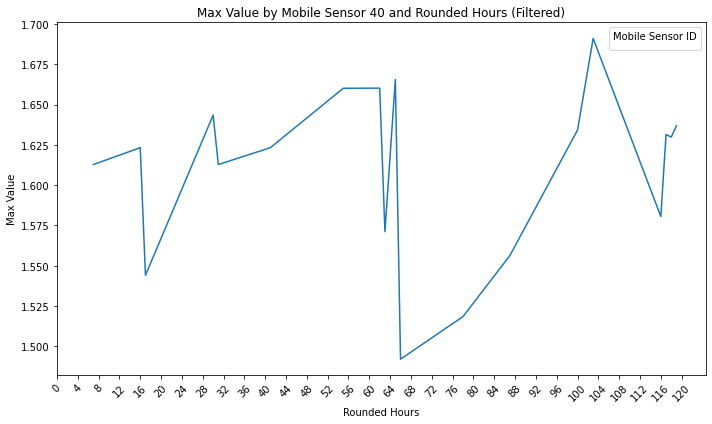

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


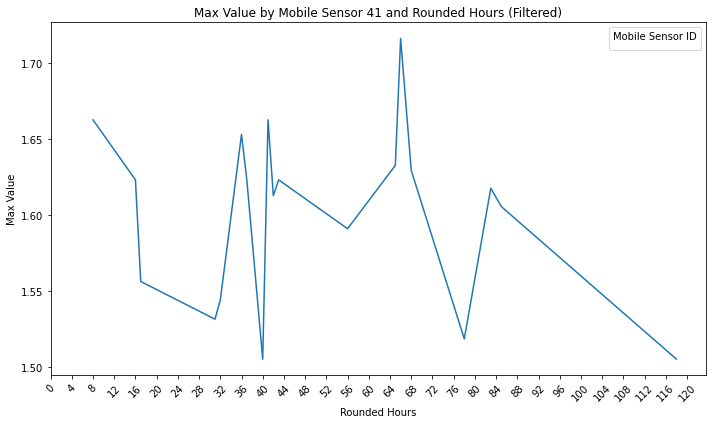

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


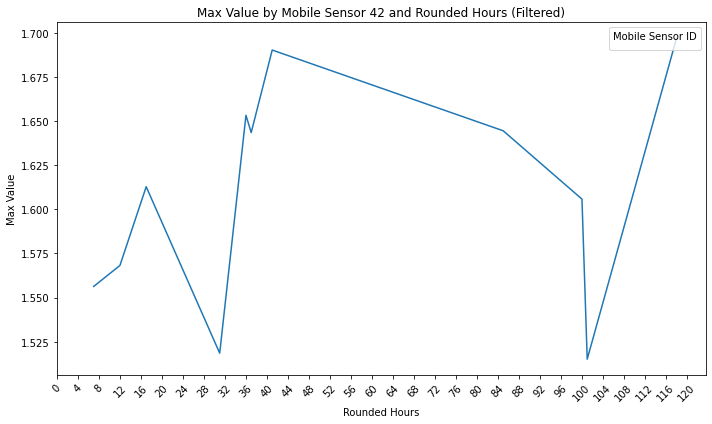

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


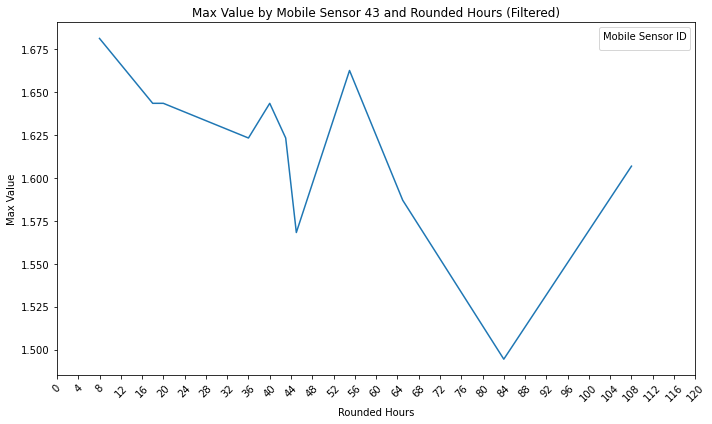

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


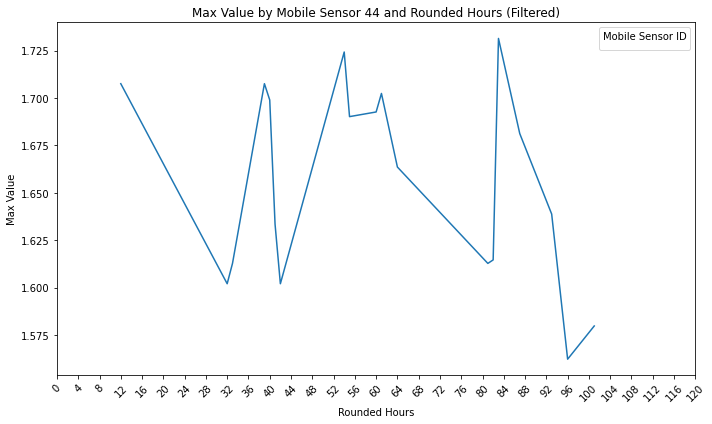

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


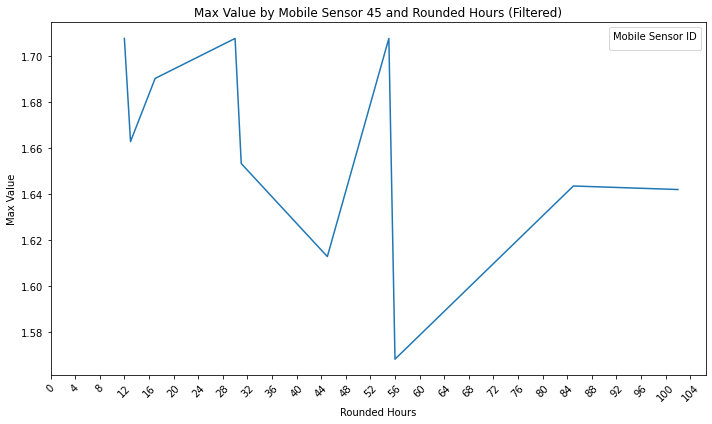

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


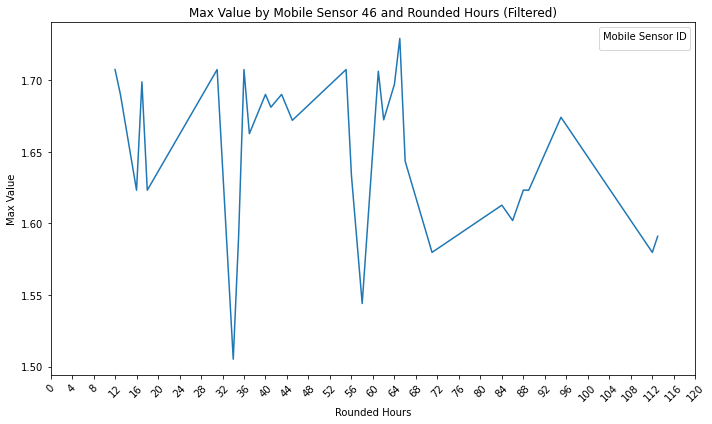

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


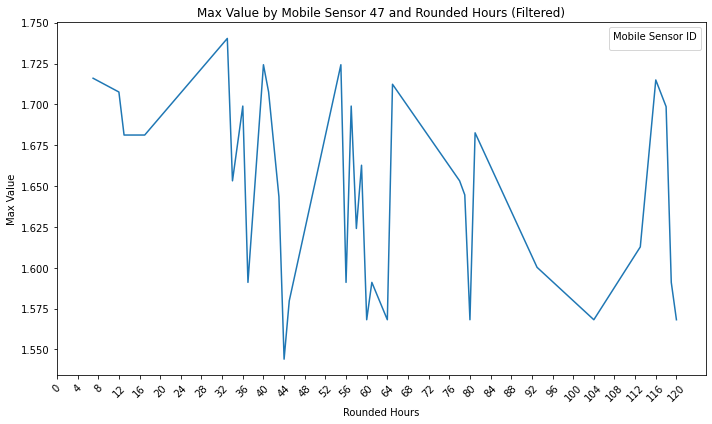

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


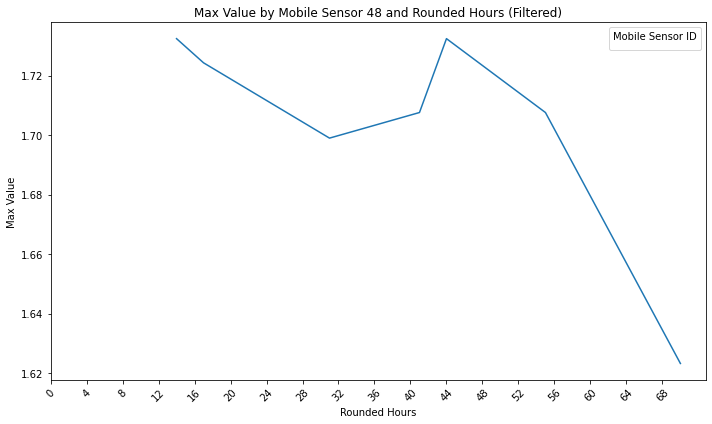

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


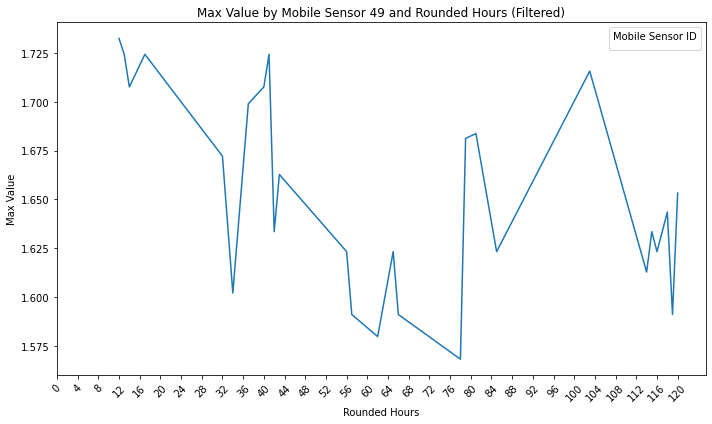

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


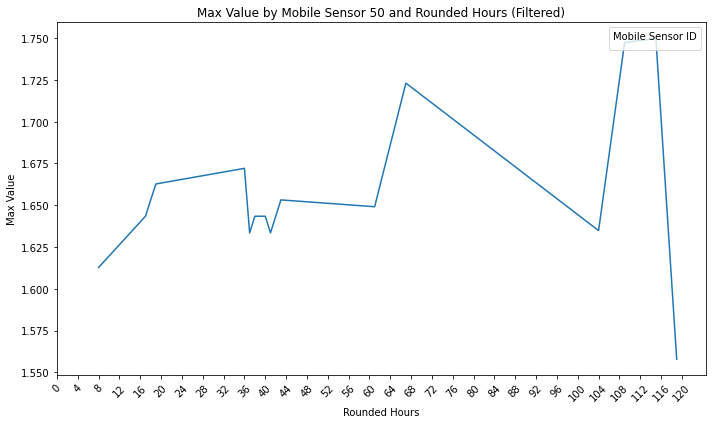

In [30]:
# Set the threshold value to identify spikes
threshold = 1.75  # adjust this threshold based on your data characteristics

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # calculate the maximum value for each rounded hour
    max_values_by_hour = sensor_data.groupby('Rounded_Hours')['Value'].max()
    max_values_data = pd.DataFrame({'Rounded_Hours': max_values_by_hour.index, 'Max_Value': max_values_by_hour.values})
    
    # filter out the data points that exceed the threshold
    filtered_max_values_data = max_values_data[max_values_data['Max_Value'] <= threshold]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=filtered_max_values_data, x='Rounded_Hours', y='Max_Value', ci=None)
    plt.xlabel('Rounded Hours')
    plt.ylabel('Max Value')
    plt.title(f'Max Value by Mobile Sensor {sensor_id} and Rounded Hours (Filtered)')
    # adjust x-axis ticks for every 4 hours with rotation
    plt.xticks(np.arange(0, int(sensor_data['Rounded_Hours'].max()) + 1, step=4), rotation=45) 
    plt.tight_layout()
    plt.legend(title='Mobile Sensor ID', loc='upper right')
    plt.show()


### Combined plots (MAX by sensor and Hours)

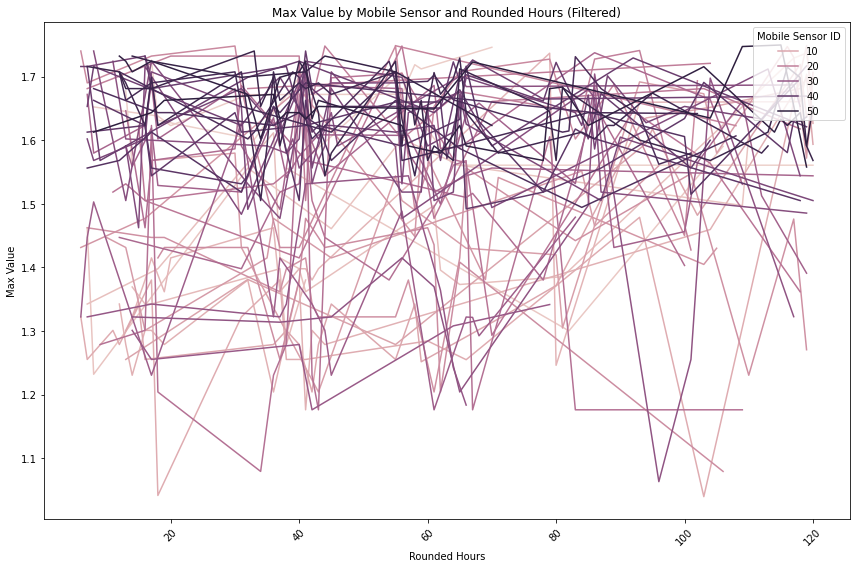

In [31]:
# Create a single figure for all plots
plt.figure(figsize=(12, 8))

# Create an empty list to store the data for all sensors
combined_data = []

# Iterate through each mobile sensor ID and add data to the combined list
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # calculate the maximum value for each rounded hour
    max_values_by_hour = sensor_data.groupby('Rounded_Hours')['Value'].max()
    max_values_data = pd.DataFrame({'Rounded_Hours': max_values_by_hour.index, 'Max_Value': max_values_by_hour.values})
    
    # filter out the data points that exceed the threshold
    filtered_max_values_data = max_values_data[max_values_data['Max_Value'] <= threshold]
    
    # add sensor data to the combined list
    filtered_max_values_data['Sensor ID'] = sensor_id
    combined_data.append(filtered_max_values_data)

# Concatenate the data in the list to create a combined DataFrame
combined_data_df = pd.concat(combined_data, ignore_index=True)

# Plot all the lines using sns.lineplot
sns.lineplot(data=combined_data_df, x='Rounded_Hours', y='Max_Value', hue='Sensor ID', ci=None)

# Set labels and title
plt.xlabel('Rounded Hours')
plt.ylabel('Max Value')
plt.title('Max Value by Mobile Sensor and Rounded Hours (Filtered)')

# Adjust x-axis ticks for readability
plt.xticks(rotation=45)

# Add legend
plt.legend(title='Mobile Sensor ID', loc='upper right')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


#  Static Sensor Visuals

#  Static Sensors Timeseries Plot of DATE against Average Radiation Value (unscaled)

### Individual Plots

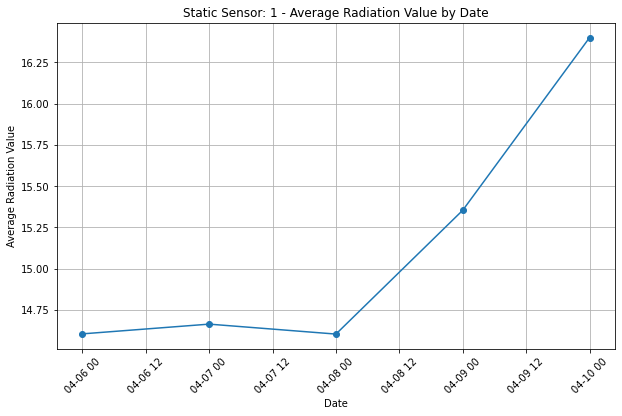

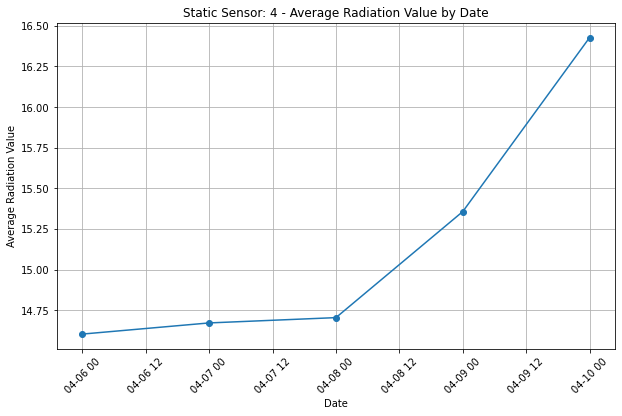

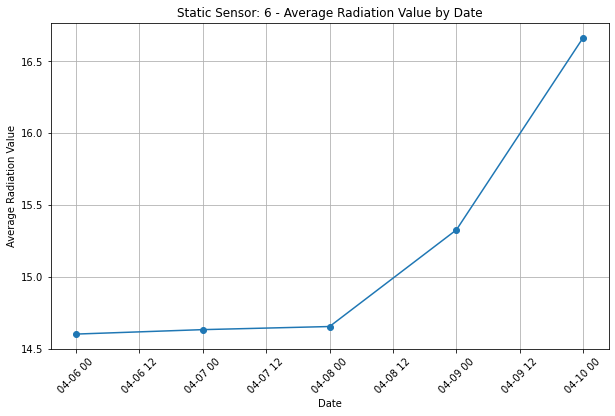

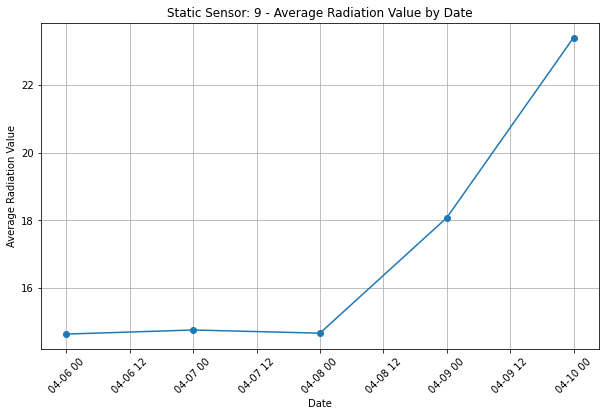

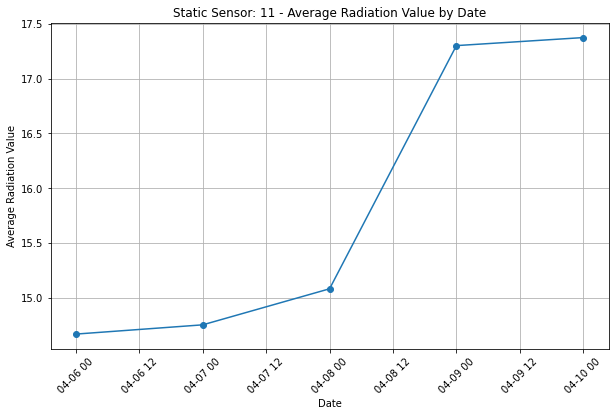

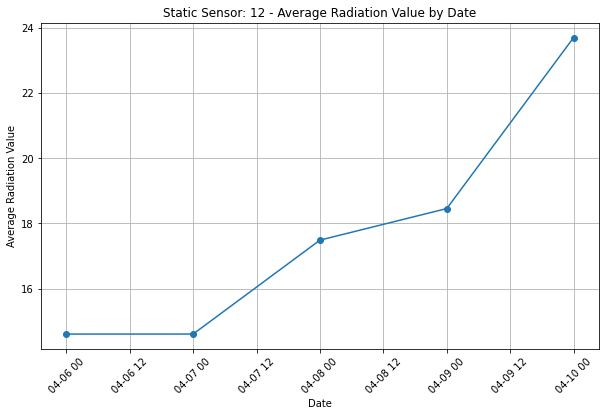

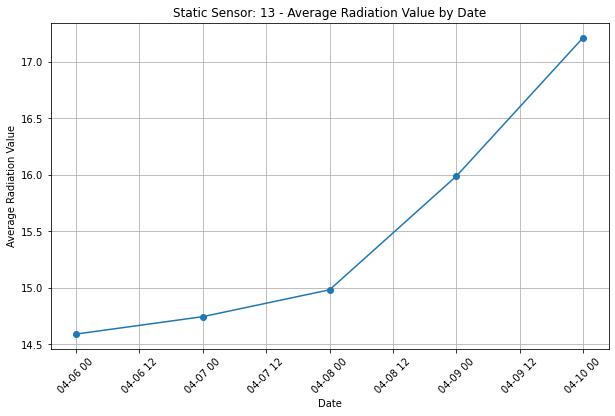

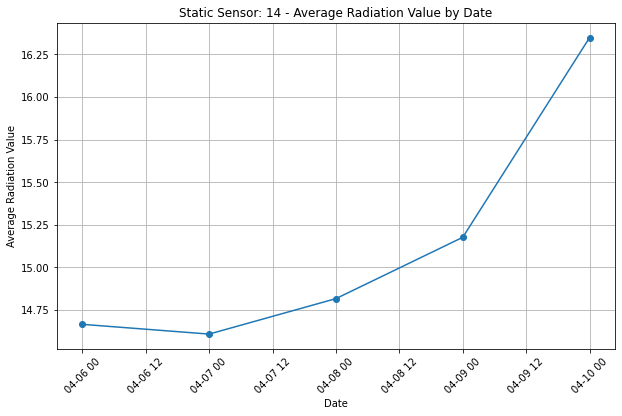

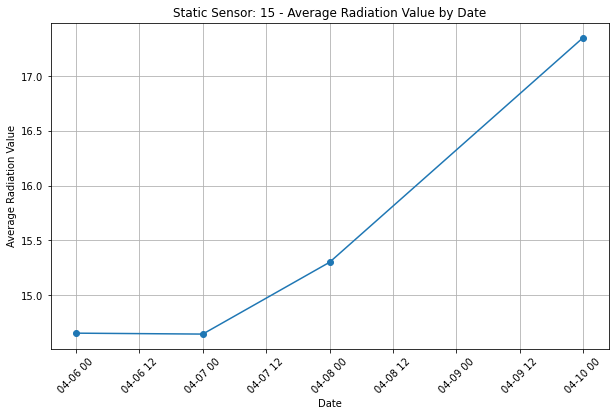

In [35]:
static_df = stationary_sensor_data.copy()

# Convert the 'Timestamp' column to a datetime type if it's not already
static_df['Timestamp'] = pd.to_datetime(static_df['Timestamp'])

# Extract the date from the 'Timestamp' and create a new column for it
static_df['Date'] = static_df['Timestamp'].dt.date

# Define a custom aggregation function to get both the average 'Value' and the original dates
def custom_agg(group):
    return pd.Series({
        'Average_Value': group['Value'].mean(),
        'Original_Dates': group['Date'].unique()  # timestamp converted to dates
    })

# Group by 'Sensor-id' and 'Date' and apply the custom_agg function to get the desired result
average_value_and_dates = static_df.groupby(['Sensor-id', 'Date']).apply(custom_agg)

# Reset the MultiIndex to have a cleaner DataFrame
average_value_and_dates.reset_index(inplace=True)

# Plot the time series for each sensor
for sensor_id, sensor_group in average_value_and_dates.groupby('Sensor-id'):
    plt.figure(figsize=(10, 6))  # adjust the figure size as per needed
    plt.plot(sensor_group['Date'], sensor_group['Average_Value'], marker='o')
    plt.xlabel('Date')
    plt.ylabel('Average Radiation Value')
    plt.title(f'Static Sensor: {sensor_id} - Average Radiation Value by Date')
    plt.grid(True)
    plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
    plt.show()



### Combined Plots

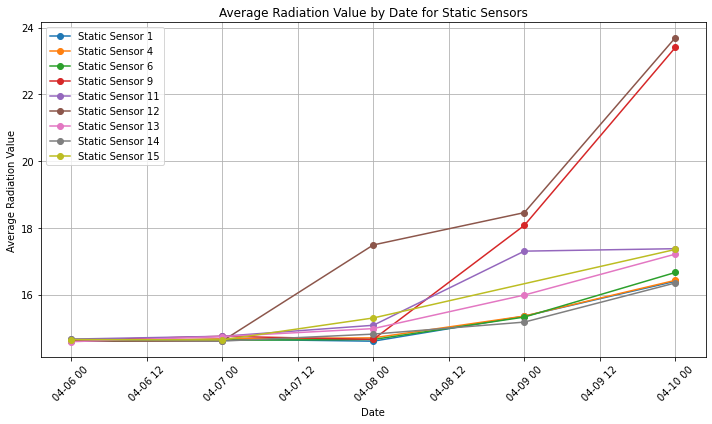

In [36]:
# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each sensor on the same plot
for sensor_id, sensor_group in average_value_and_dates_df.groupby('Sensor-id'):
    plt.plot(sensor_group['Date'], sensor_group['Average_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.xlabel('Date')
plt.ylabel('Average Radiation Value')
plt.title('Average Radiation Value by Date for Static Sensors')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.legend()  # Show legend with labels for each sensor
plt.tight_layout()
plt.show()

#Observation(s):
# Main earthquake appears to be the 8th and the aftershock might of happend on 
#  the 9th

In [67]:
# Group by 'Sensor-id' and 'Date' to calculate the average radiation levels on each day for each static sensor
average_daily_values_static = average_value_and_dates.groupby(['Sensor-id', 'Date'])['Average_Value'].mean()

# Get unique static sensor IDs
unique_static_sensor_ids = average_value_and_dates['Sensor-id'].unique()

# Iterate through each static sensor ID and print out the average radiation levels on each day
for sensor_id in unique_static_sensor_ids:
    sensor_average_data_static = average_daily_values_static[sensor_id]
    print(f"Static Sensor {sensor_id} Average Daily Radiation Levels:")
    print(sensor_average_data_static)
    print("\n")


Static Sensor 1 Average Daily Radiation Levels:
Date
2020-04-06    14.605595
2020-04-07    14.664591
2020-04-08    14.604334
2020-04-09    15.354096
2020-04-10    16.399281
Name: Average_Value, dtype: float64


Static Sensor 4 Average Daily Radiation Levels:
Date
2020-04-06    14.603050
2020-04-07    14.671697
2020-04-08    14.704356
2020-04-09    15.357012
2020-04-10    16.427906
Name: Average_Value, dtype: float64


Static Sensor 6 Average Daily Radiation Levels:
Date
2020-04-06    14.602558
2020-04-07    14.633474
2020-04-08    14.655073
2020-04-09    15.326860
2020-04-10    16.663312
Name: Average_Value, dtype: float64


Static Sensor 9 Average Daily Radiation Levels:
Date
2020-04-06    14.630230
2020-04-07    14.751207
2020-04-08    14.657587
2020-04-09    18.073552
2020-04-10    23.404537
Name: Average_Value, dtype: float64


Static Sensor 11 Average Daily Radiation Levels:
Date
2020-04-06    14.666930
2020-04-07    14.751443
2020-04-08    15.080614
2020-04-09    17.301630
2020-0

#  Static Sensors Timeseries Plot of DATE against MAXIMUM Radiation Value (unscaled)

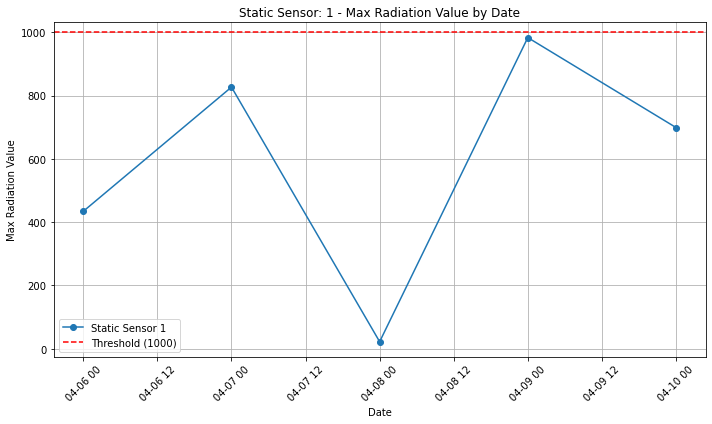

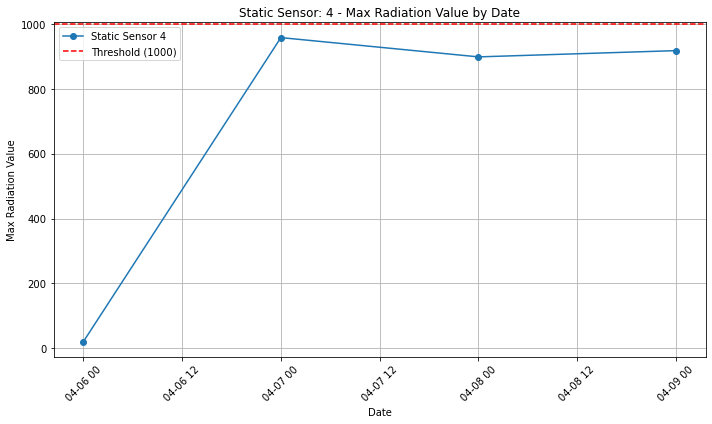

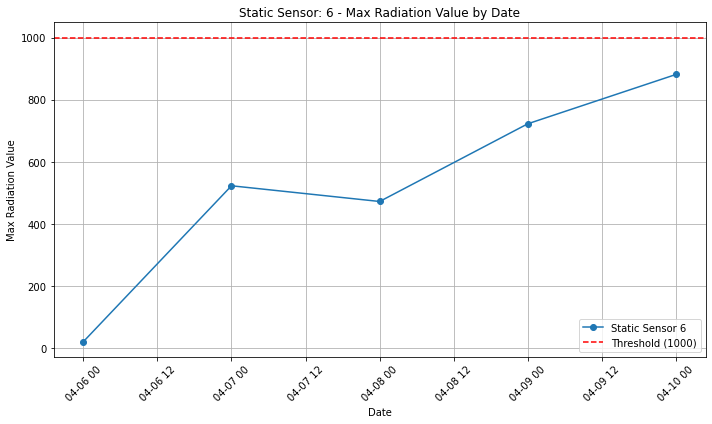

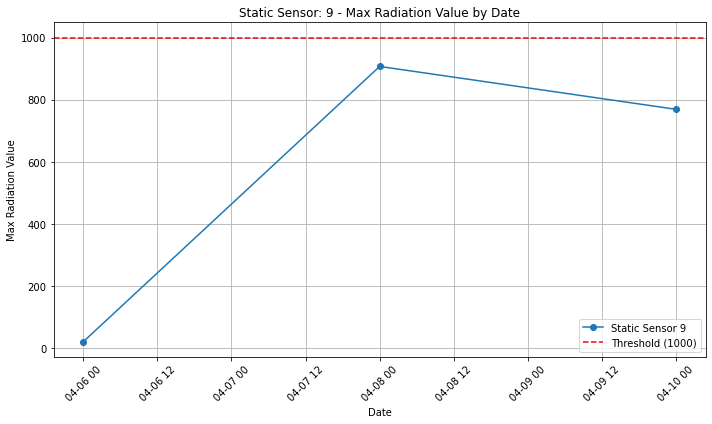

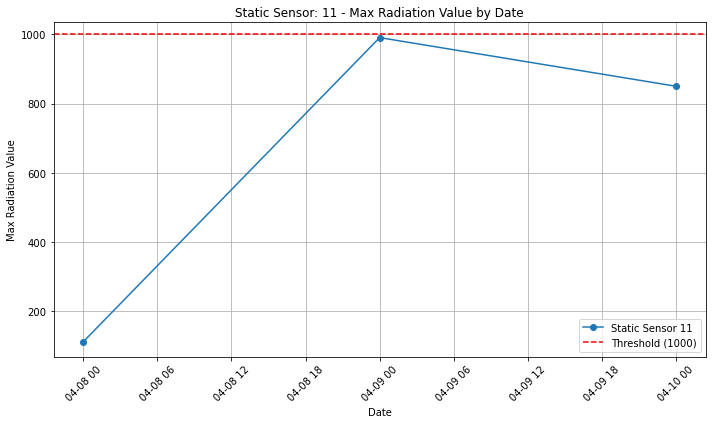

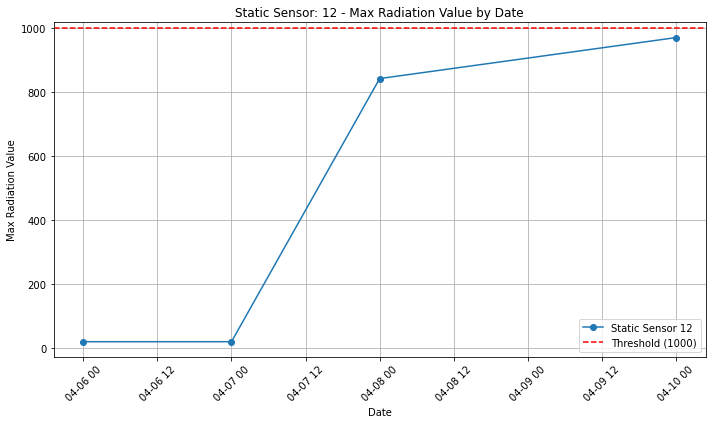

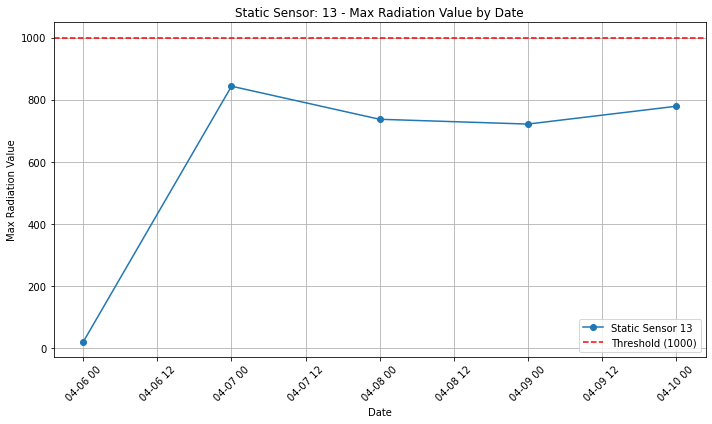

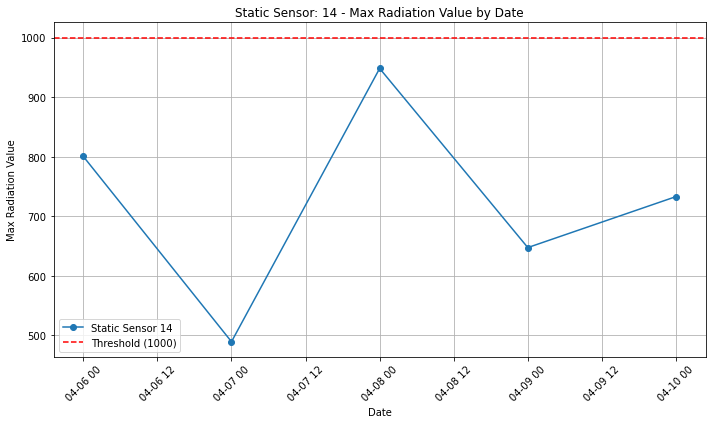

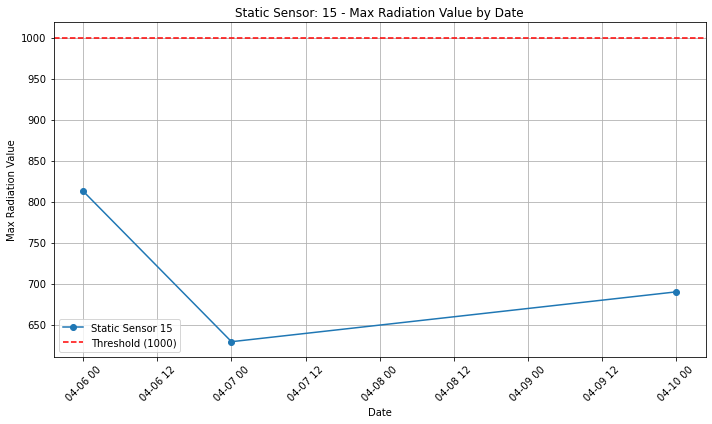

In [39]:
# Define a custom aggregation function to get both the maximum 'Value' and the original dates
def custom_agg_max(group):
    return pd.Series({
        'Max_Value': group['Value'].max(),
        'Original_Dates': group['Date'].unique()  # timestamp converted to dates
    })

# Group by 'Sensor-id' and 'Date' and apply the custom_agg_max function to get the desired result
max_value_and_dates_df = static_df.groupby(['Sensor-id', 'Date']).apply(custom_agg_max)

# Reset the MultiIndex to have a cleaner DataFrame
max_value_and_dates_df.reset_index(inplace=True)

# Set the y-value threshold
y_value_threshold = 1000

# Plot the time series for each sensor
for sensor_id, sensor_group in max_value_and_dates_df.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    plt.figure(figsize=(10, 6))  # adjust the figure size as per needed
    plt.plot(sensor_group_filtered['Date'], sensor_group_filtered['Max_Value'], marker='o', label=f'Static Sensor {sensor_id}')
    plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
    plt.xlabel('Date')
    plt.ylabel('Max Radiation Value')
    plt.title(f'Static Sensor: {sensor_id} - Max Radiation Value by Date')
    plt.grid(True)
    plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
    plt.legend()  # Show legend with labels for each sensor
    plt.tight_layout()
    plt.show()

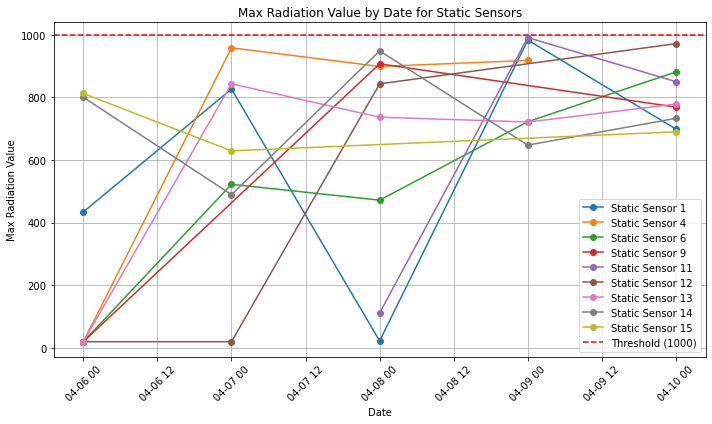

In [40]:
'''Office Hours Note
There are some spikes that arent making sense

Also look this with the perspective of Before and After earthquake (i.e. max radiation spikes from 
power coming back to the static sensors)

'''
# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each sensor on the same plot
for sensor_id, sensor_group in max_value_and_dates_df.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Date'], sensor_group_filtered['Max_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Date')
plt.ylabel('Max Radiation Value')
plt.title('Max Radiation Value by Date for Static Sensors')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.legend()  # Show legend with labels for each sensor
plt.tight_layout()
plt.show()


In [68]:
# Group by 'Sensor-id' and 'Date' to calculate the maximum radiation values on each day for each static sensor
max_daily_values_static = max_value_and_dates.groupby(['Sensor-id', 'Date'])['Max_Value'].max()

# Get unique static sensor IDs
unique_static_sensor_ids = max_value_and_dates['Sensor-id'].unique()

# Iterate through each static sensor ID and print out the maximum radiation values on each day
for sensor_id in unique_static_sensor_ids:
    sensor_max_data_static = max_daily_values_static[sensor_id]
    print(f"Static Sensor {sensor_id} Maximum Daily Radiation Values:")
    print(sensor_max_data_static)
    print("\n")


Static Sensor 1 Maximum Daily Radiation Values:
Date
2020-04-06    434.343
2020-04-07    826.627
2020-04-08     22.319
2020-04-09    982.982
2020-04-10    698.982
Name: Max_Value, dtype: float64


Static Sensor 4 Maximum Daily Radiation Values:
Date
2020-04-06      19.989
2020-04-07     958.155
2020-04-08     898.681
2020-04-09     917.947
2020-04-10    1067.926
Name: Max_Value, dtype: float64


Static Sensor 6 Maximum Daily Radiation Values:
Date
2020-04-06     19.988
2020-04-07    522.477
2020-04-08    471.874
2020-04-09    722.304
2020-04-10    881.220
Name: Max_Value, dtype: float64


Static Sensor 9 Maximum Daily Radiation Values:
Date
2020-04-06      20.000
2020-04-07    1124.101
2020-04-08     907.116
2020-04-09    1165.900
2020-04-10     768.972
Name: Max_Value, dtype: float64


Static Sensor 11 Maximum Daily Radiation Values:
Date
2020-04-06    1110.792
2020-04-07    1045.566
2020-04-08     111.595
2020-04-09     990.809
2020-04-10     850.142
Name: Max_Value, dtype: float64



##  Stationary Sensors Timeseries Plot of HOURS against AVERAGE Radiation Value 

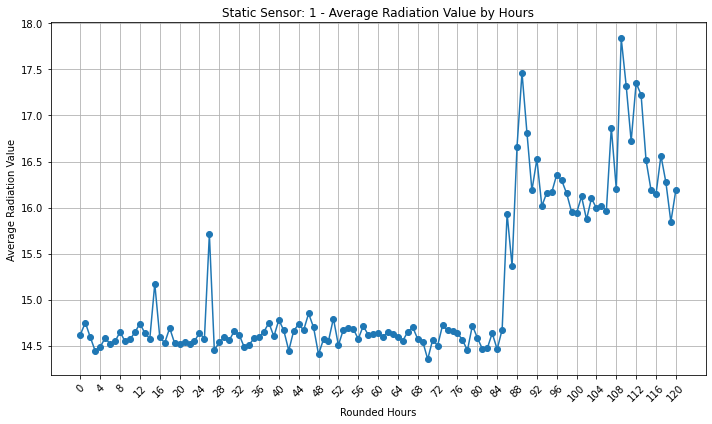

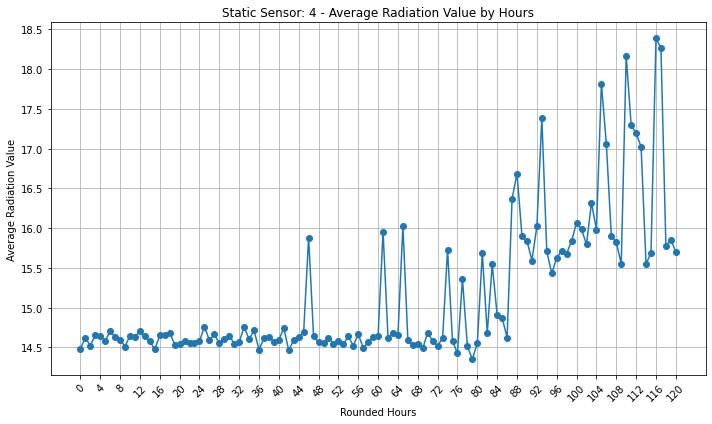

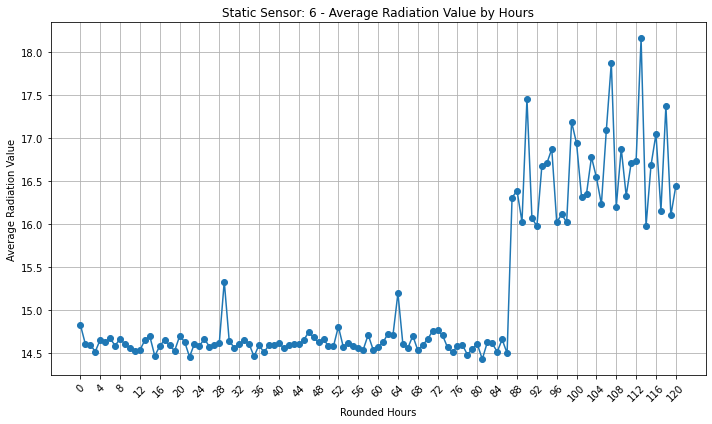

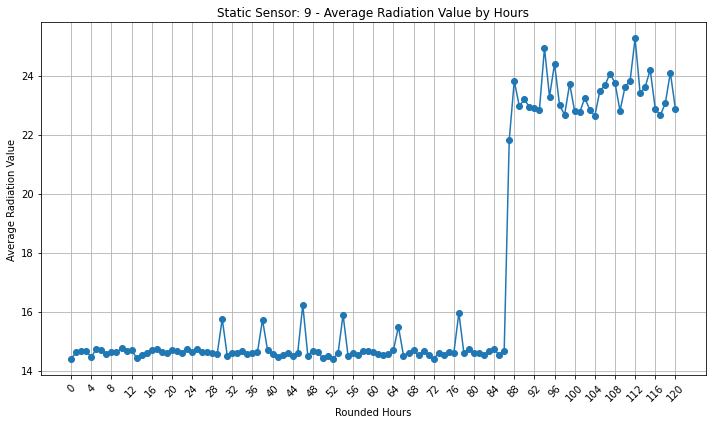

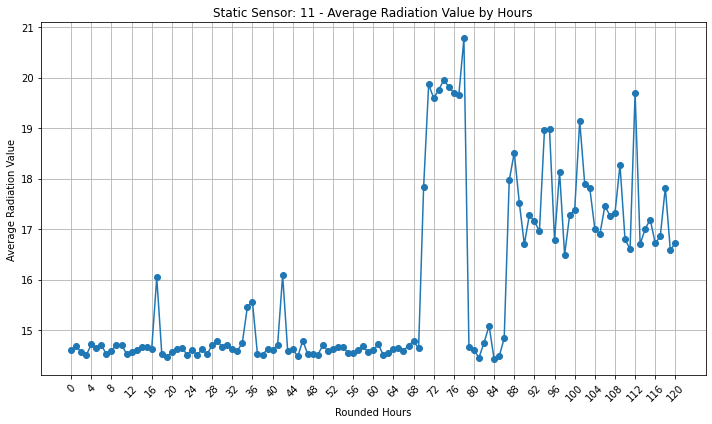

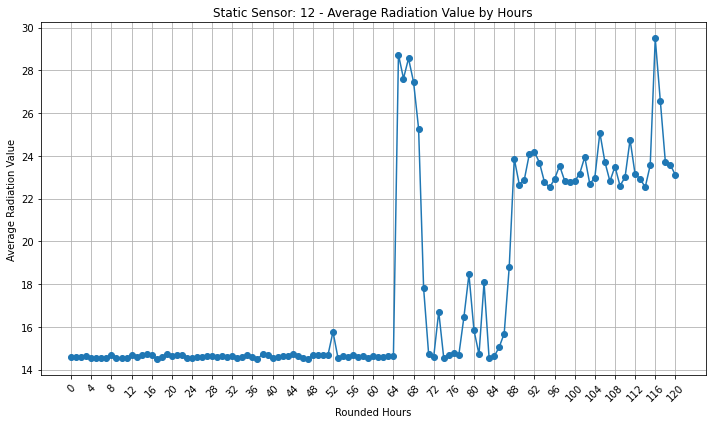

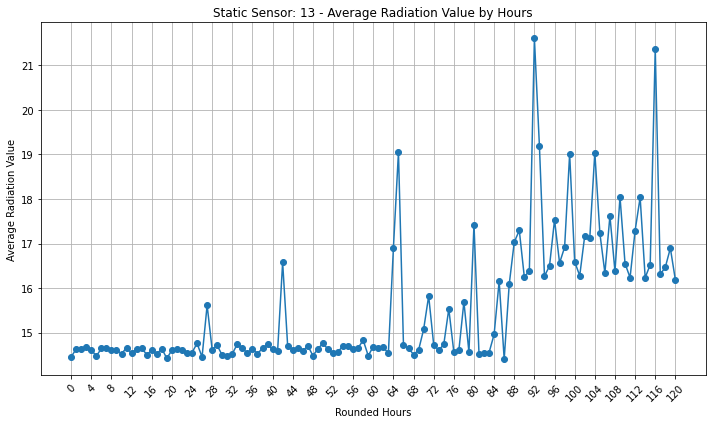

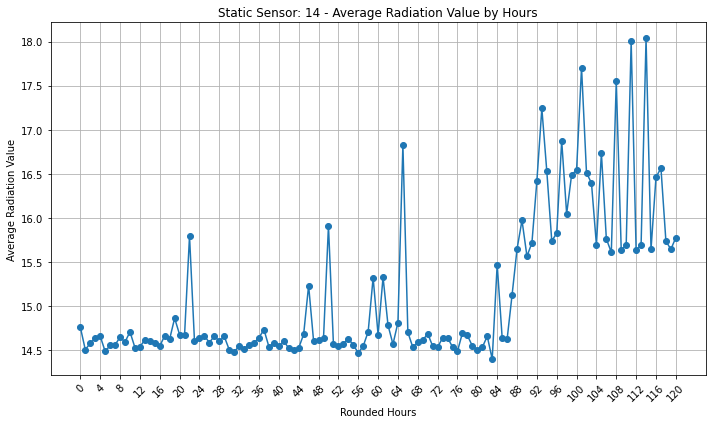

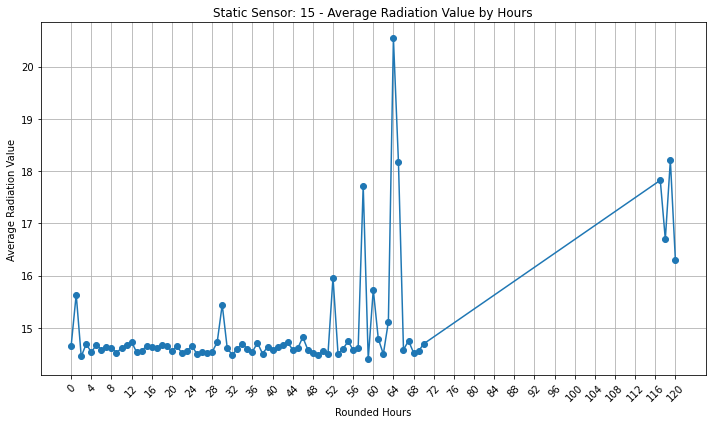

In [41]:
# Calculate the number of hours since the start of the data collection
static_df['Hours_since_start'] = (static_df['Timestamp'] - static_df['Timestamp'].min()).dt.total_seconds() / 3600

# Round the 'Hours_since_start' to the nearest hour
static_df['Rounded_Hours'] = static_df['Hours_since_start'].round()

# Define a custom aggregation function to get the average 'Value' for each hour
def custom_agg_hour(group):
    return pd.Series({
        'Average_Value': group['Value'].mean()
    })

# Group by 'Sensor-id', 'Rounded_Hours', and apply the custom_agg_hour function to get the desired result
average_value_and_hours_df = static_df.groupby(['Sensor-id', 'Rounded_Hours']).apply(custom_agg_hour)

# Reset the MultiIndex to have a cleaner DataFrame
average_value_and_hours_df.reset_index(inplace=True)

# Plot the time series for each static sensor
for sensor_id, sensor_group in average_value_and_hours_df.groupby('Sensor-id'):
    plt.figure(figsize=(10, 6))  # adjust the figure size as per needed
    plt.plot(sensor_group['Rounded_Hours'], sensor_group['Average_Value'], marker='o')
    plt.xlabel('Rounded Hours')
    plt.ylabel('Average Radiation Value')
    plt.title(f'Static Sensor: {sensor_id} - Average Radiation Value by Hours')
    plt.grid(True)
    plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # Adjust x-axis ticks for every 4 hours with rotation
    plt.tight_layout()
    plt.show()



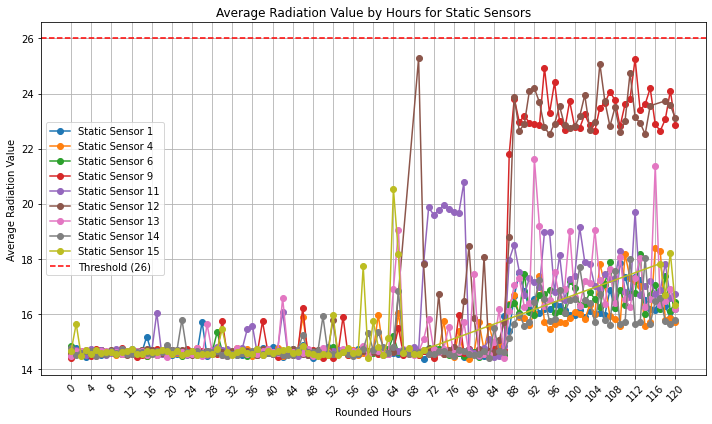

In [42]:
'''Office Hours Note
There are some spikes that arent making sense

Also look this with the perspective of Before and After earthquake (i.e. max radiation spikes from 
power coming back to the static sensors)
'''
# Set the y-value threshold
y_value_threshold = 26

# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in average_value_and_hours_df.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Average_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Average_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Rounded Hours')
plt.ylabel('Average Radiation Value')
plt.title('Average Radiation Value by Hours for Static Sensors')
plt.grid(True)
plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # Adjust x-axis ticks for every 4 hours with rotation
plt.tight_layout()
plt.legend()  # Show legend with labels for each sensor
plt.show()



In [72]:
# Convert the 'Timestamp' column to a datetime type if it's not already
temp2['Timestamp'] = pd.to_datetime(temp2['Timestamp'])

# Calculate the number of hours since the start of the data collection
temp2['Hours_since_start'] = (temp2['Timestamp'] - temp2['Timestamp'].min()).dt.total_seconds() / 3600

print(temp2['Hours_since_start'])

0           0.000000
1           0.000000
2           0.000000
3           0.000000
4           0.000000
             ...    
743995    119.983333
743996    119.983333
743997    119.983333
743998    119.983333
743999    119.983333
Name: Hours_since_start, Length: 744000, dtype: float64


#### The Final 80 Hours

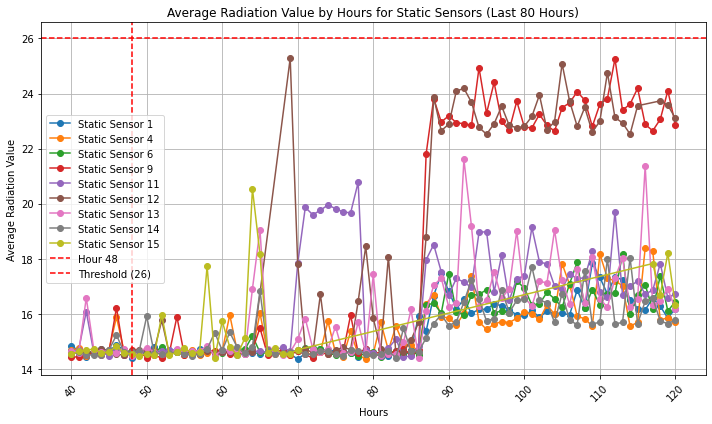

In [125]:
# Convert the 'Timestamp' column to a datetime type if it's not already
temp2['Timestamp'] = pd.to_datetime(temp2['Timestamp'])

# Calculate the number of hours since the start of the data collection
temp2['Hours_since_start'] = (temp2['Timestamp'] - temp2['Timestamp'].min()).dt.total_seconds() / 3600

# Filter data to include the last 80 hours
last_80_hours_data = temp2[temp2['Hours_since_start'] >= (temp2['Hours_since_start'].max() - 80)]

# Round the 'Hours_since_start' to the nearest hour
last_80_hours_data['Rounded_Hours'] = last_80_hours_data['Hours_since_start'].round()

# Define a custom aggregation function to get the average 'Value' for each hour
def custom_agg_hour(group):
    return pd.Series({
        'Average_Value': group['Value'].mean()
    })

# Group by 'Sensor-id', 'Rounded_Hours', and apply the custom_agg_hour function to get the desired result
average_value_and_hours = last_80_hours_data.groupby(['Sensor-id', 'Rounded_Hours']).apply(custom_agg_hour)

# Reset the MultiIndex to have a cleaner DataFrame
average_value_and_hours.reset_index(inplace=True)

# Set the y-value threshold
y_value_threshold = 26

# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in average_value_and_hours.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Average_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Average_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axvline(x=48, color='r', linestyle='--', label='Hour 48')
plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Hours')
plt.ylabel('Average Radiation Value')
plt.title('Average Radiation Value by Hours for Static Sensors (Last 80 Hours)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.tight_layout()
plt.legend()  # Show legend with labels for each sensor
plt.show()


##  Stationary Sensors Timeseries Plot of HOURS against MAXIMUM Radiation Value 

### Individual Plots

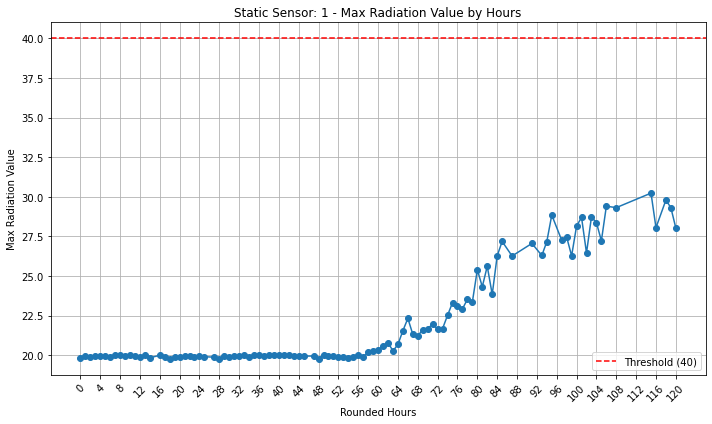

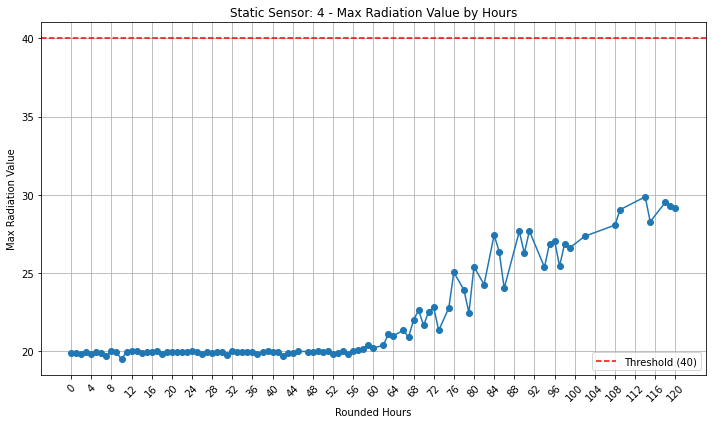

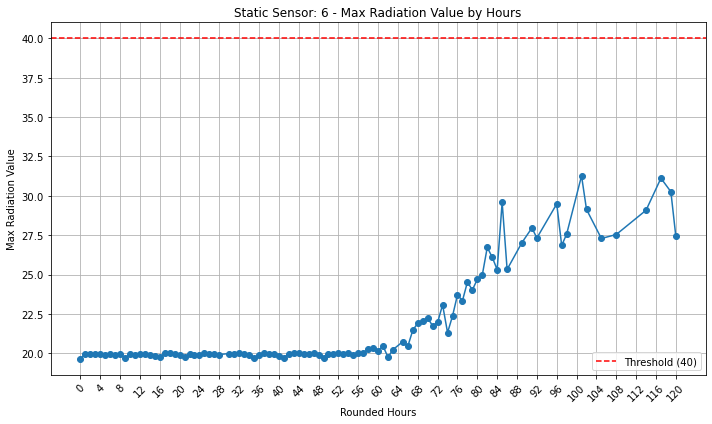

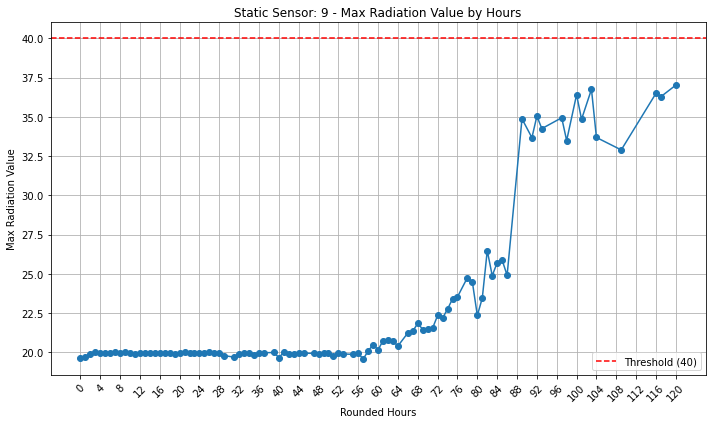

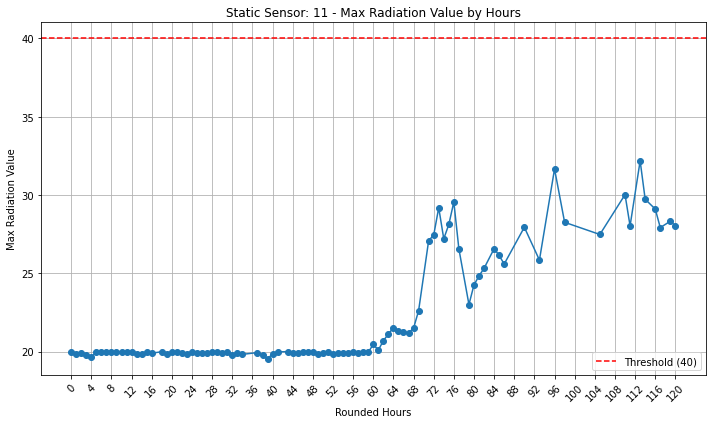

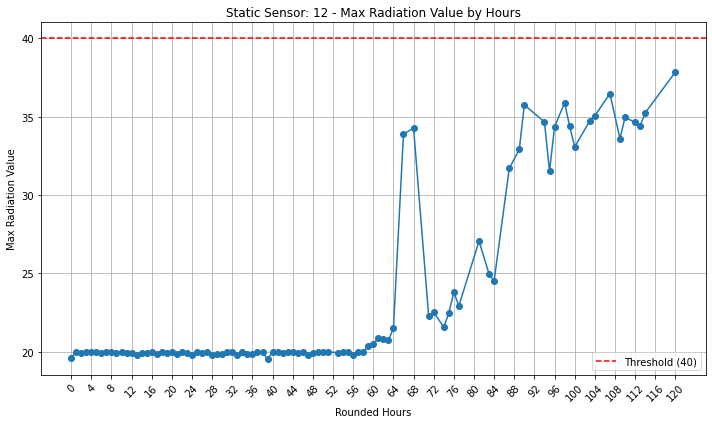

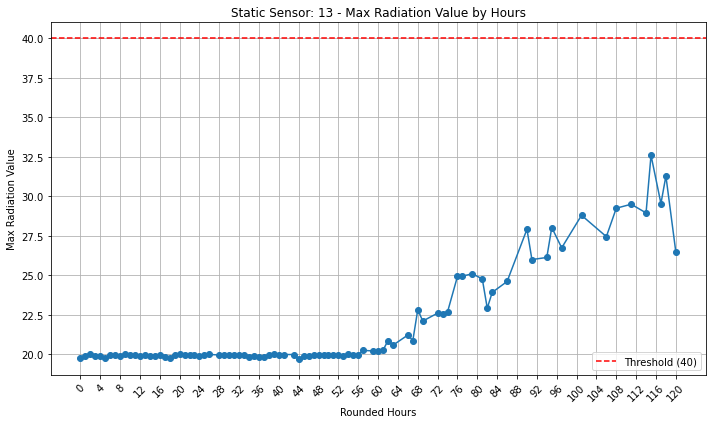

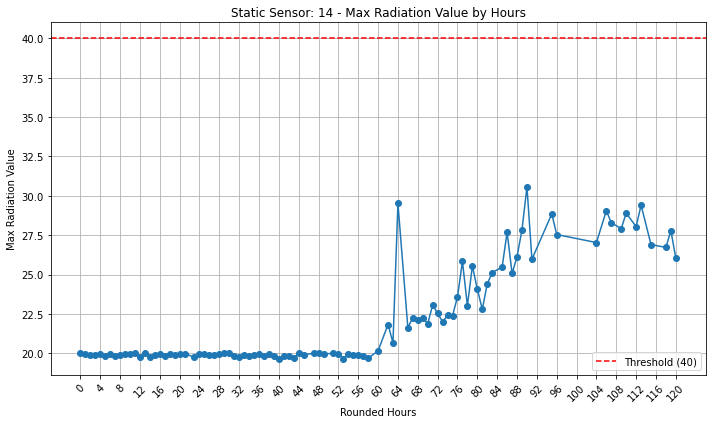

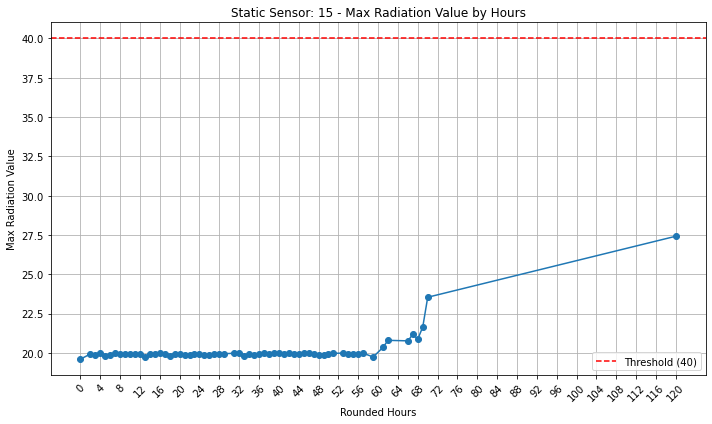

In [43]:
# Define a custom aggregation function to get the maximum 'Value' for each hour
def custom_agg_hour_max(group):
    return pd.Series({
        'Max_Value': group['Value'].max()
    })

# Group by 'Sensor-id', 'Rounded_Hours', and apply the custom_agg_hour_max function to get the 
# desired result
max_value_and_hours = static_df.groupby(['Sensor-id', 'Rounded_Hours']).apply(custom_agg_hour_max)

# Reset the MultiIndex to have a cleaner DataFrame
max_value_and_hours.reset_index(inplace=True)

# Set the y-value threshold
y_value_threshold = 40

# Plot the time series for each static sensor
for sensor_id, sensor_group in max_value_and_hours.groupby('Sensor-id'):
    plt.figure(figsize=(10, 6))  # adjust the figure size as needed
    
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Max_Value'], marker='o')
    plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
    plt.xlabel('Rounded Hours')
    plt.ylabel('Max Radiation Value')
    plt.title(f'Static Sensor: {sensor_id} - Max Radiation Value by Hours')
    plt.grid(True)
    plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # adjust x-axis ticks for every 4 hours with rotation
    plt.legend()
    plt.tight_layout()
    plt.show()


### Combined Plots

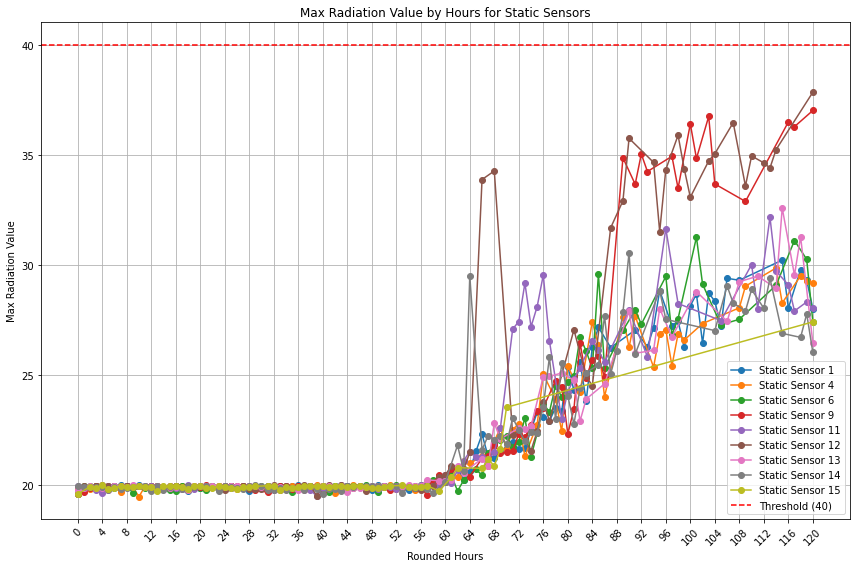

In [113]:
'''Office Hours Note
There are some spikes that arent making sense

Also look this with the perspective of Before and After earthquake (i.e. max radiation spikes from 
power coming back to the static sensors)
'''
# Create a single plot to contain all lines
plt.figure(figsize=(12, 8))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in max_value_and_hours.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Max_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Rounded Hours')
plt.ylabel('Max Radiation Value')
plt.title('Max Radiation Value by Hours for Static Sensors')
plt.grid(True)
plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # Adjust x-axis ticks for every 4 hours with rotation
plt.tight_layout()
plt.legend()  # Show legend with labels for each sensor
plt.show()


### The Final 80 Hours

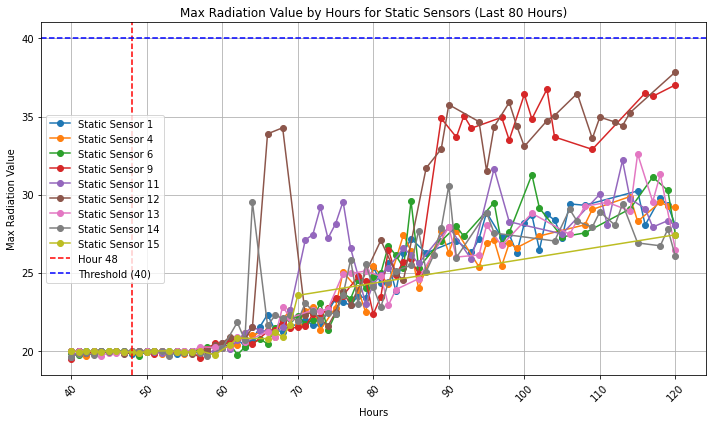

In [112]:
# Convert the 'Timestamp' column to a datetime type if it's not already
temp2['Timestamp'] = pd.to_datetime(temp2['Timestamp'])

# Calculate the number of hours since the start of the data collection
temp2['Hours_since_start'] = (temp2['Timestamp'] - temp2['Timestamp'].min()).dt.total_seconds() / 3600

# Filter data to include the last 80 hours
last_80_hours_data = temp2[temp2['Hours_since_start'] >= (temp2['Hours_since_start'].max() - 80)]

# Round the 'Hours_since_start' to the nearest hour
last_80_hours_data['Rounded_Hours'] = last_80_hours_data['Hours_since_start'].round()

# Define a custom aggregation function to get the maximum 'Value' for each hour
def custom_agg_hour_max(group):
    return pd.Series({
        'Max_Value': group['Value'].max()
    })

# Group by 'Sensor-id', 'Rounded_Hours', and apply the custom_agg_hour_max function to get the desired result
max_value_and_hours = last_80_hours_data.groupby(['Sensor-id', 'Rounded_Hours']).apply(custom_agg_hour_max)

# Reset the MultiIndex to have a cleaner DataFrame
max_value_and_hours.reset_index(inplace=True)

# Set the y-value threshold
y_value_threshold = 40

# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in max_value_and_hours.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Max_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axvline(x=48, color='r', linestyle='--', label='Hour 48')
plt.axhline(y=y_value_threshold, color='b', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Hours')
plt.ylabel('Max Radiation Value')
plt.title('Max Radiation Value by Hours for Static Sensors (Last 80 Hours)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.tight_layout()
plt.legend()  # Show legend with labels for each sensor
plt.show()
